# Load the data

In [2]:
# import yfinance as yf
# import pandas as pd
# import datetime
# 
# def download_crypto_data(crypto_tickers, start_days_ago=825, interval='1d'):
#     """
#     Downloads historical data for a list of cryptocurrencies from Yahoo Finance.
# 
#     Args:
#         crypto_tickers: A list of cryptocurrency tickers as strings.
#         start_days_ago: Number of days ago from today to start collecting data.
#         interval: Data interval (e.g., '1d' for daily data).
# 
#     Returns:
#         A DataFrame containing the historical data for the cryptocurrencies.
#     """
#     # Define the start and end date for the historical data
#     end_date = datetime.datetime.now()
#     start_date = end_date - datetime.timedelta(days=start_days_ago)
# 
#     # Create an empty DataFrame to store all the historical data
#     all_crypto_data = pd.DataFrame()
# 
#     # Download historical data for each cryptocurrency
#     for ticker in crypto_tickers:
#         print(f'Downloading historical data for {ticker}')
#         try:
#             # Download data
#             data = yf.download(ticker, start=start_date.strftime('%Y-%m-%d'), end=end_date.strftime('%Y-%m-%d'), interval=interval)
#             if not data.empty:
#                 data['Ticker'] = ticker  # Add a column for the ticker
#                 all_crypto_data = pd.concat([all_crypto_data, data], ignore_index=False)
#             else:
#                 print(f"No data found for {ticker}")
#         except Exception as e:
#             print(f"Failed to download data for {ticker}: {e}")
# 
#     return all_crypto_data
# 
# 
# # Define the list of cryptocurrency tickers
# crypto_tickers = [
#     'BNB-USD', 'ADA-USD', 'XRP-USD', 'DOGE-USD', 'DOT-USD', 'UNI-USD','BTC-USD',
#     'BCH-USD', 'LTC-USD','BTC-USD', 'ETH-USD', 'LINK-USD', 'XLM-USD', 'USDC-USD', 'USDT-USD', 'VET-USD', 'ETC-USD',
#     'FIL-USD', 'TRX-USD', 'EOS-USD', 'THETA-USD', 'XMR-USD', 'NEO-USD', 'AAVE-USD', 'ATOM-USD','BTC-USD',
#     'XTZ-USD', 'CRO-USD', 'LEO-USD', 'HT-USD', 'ALGO-USD', 'WIF-USD', 'BONK-USD', 'SHIB-USD', 'SOL-USD',
#     'DGB-USD', 'BCA-USD', 'XDC-USD', 'ZIL-USD', 'HOT-USD', 'CHZ-USD', 'ENJ-USD', 'MANA-USD', 'BAT-USD', 'SAND-USD',
# 
# ]
# 
# # Download the data
# historical_data = download_crypto_data(crypto_tickers)
# 
# # Save the data to a CSV file
# csv_file_path = 'top_39_cryptos_historical_data.csv'
# historical_data.to_csv(csv_file_path, index=True)
# 
# print(f"Data successfully saved to {csv_file_path}")


In [3]:
import pandas as pd

# Load the data
file_path = 'top_39_cryptos_historical_data.csv'
crypto_data = pd.read_csv(file_path)

crypto_data.head()


,Date,Open,High,Low,Close,Adj Close,Volume,Ticker
0,2022-01-13,487.042572,488.211243,467.875610,475.029114,475.029114,4151007744,BNB-USD
1,2022-01-14,475.127197,491.660645,468.939606,489.867432,489.867432,3112235914,BNB-USD
2,2022-01-15,489.917999,501.311127,486.305908,494.988068,494.988068,1766015929,BNB-USD
3,2022-01-16,494.924103,505.300964,489.502136,498.427917,498.427917,1771927950,BNB-USD
4,2022-01-17,498.506165,498.943909,468.576508,475.709869,475.709869,2134608006,BNB-USD


# Data Cleaning

In [4]:
# Convert 'Date' to datetime
crypto_data['Date'] = pd.to_datetime(crypto_data['Date'])

# Check for missing values
missing_values = crypto_data.isnull().sum()

# Display missing values count for each column
missing_values



Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Ticker       0
dtype: int64

In [5]:
# check the statistics of the data for a cryptocurrency
# Select a cryptocurrency
ticker = 'BTC-USD'

# Filter the data for the selected cryptocurrency
btc_data = crypto_data[crypto_data['Ticker'] == ticker]

# Display the statistics for the selected cryptocurrency
btc_data.describe()


,Date,Open,High,Low,Close,Adj Close,Volume
count,2475,2475.000000,2475.000000,2475.000000,2475.000000,2475.000000,2.475000e+03
mean,2023-03-01 00:00:00,31799.523622,32409.582997,31177.023045,31824.076707,31824.076707,2.533692e+10
min,2022-01-13 00:00:00,15782.300781,16253.047852,15599.046875,15787.284180,15787.284180,5.331173e+09
25%,2022-08-07 00:00:00,22467.849609,22986.529297,22002.910156,22485.689453,22485.689453,1.597826e+10
50%,2023-03-01 00:00:00,28373.513672,28881.298828,27883.386719,28360.810547,28360.810547,2.331001e+10
75%,2023-09-23 00:00:00,39518.714844,40254.480469,38702.535156,39507.367188,39507.367188,3.128527e+10
max,2024-04-16 00:00:00,73079.375000,73750.070312,71334.093750,73083.500000,73083.500000,1.189925e+11
std,NaN,12589.524950,12924.286931,12230.287408,12632.221531,12632.221531,1.338900e+10


## no missing values, so no need to fill any missing values

## Data preprocessing

In [6]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Assuming 'crypto_data' is your DataFrame with the raw data already loaded
# Check for duplicate entries
duplicates = crypto_data.duplicated(subset=['Ticker', 'Date'], keep=False)
if duplicates.any():
    print(f"Found duplicates: {crypto_data[duplicates]}")

# Pivot the data using pivot_table to handle duplicates by averaging them
pivot_data = crypto_data.pivot_table(index='Ticker', columns='Date', values='Close', aggfunc='mean')

# Forward fill and backward fill to handle any missing values after pivoting
pivot_data.fillna(method='ffill', axis=1, inplace=True)
pivot_data.fillna(method='bfill', axis=1, inplace=True)

# Check if there are still any missing values after filling
remaining_na = pivot_data.isnull().sum().sum()

# Normalize the data using StandardScaler
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_data.fillna(0))  # Just in case, fill any remaining NaNs with 0

# Convert the scaled data back to a DataFrame for readability
scaled_data_df = pd.DataFrame(scaled_data, index=pivot_data.index, columns=pivot_data.columns)

# Display the remaining missing values count and a preview of the normalized data
print(remaining_na)
scaled_data_df.head(20)


Found duplicates:             Date          Open          High           Low         Close  \
4950  2022-01-13  43946.742188  44278.421875  42447.042969  42591.570312   
4951  2022-01-14  42598.871094  43346.687500  41982.617188  43099.699219   
4952  2022-01-15  43101.898438  43724.671875  42669.035156  43177.398438   
4953  2022-01-16  43172.039062  43436.808594  42691.023438  43113.878906   
4954  2022-01-17  43118.121094  43179.390625  41680.320312  42250.550781   
...          ...           ...           ...           ...           ...   
21445 2024-04-12  70061.382812  71222.742188  65254.835938  67195.867188   
21446 2024-04-13  67188.375000  67931.429688  60919.105469  63821.472656   
21447 2024-04-14  63836.230469  65824.429688  62205.851562  65738.726562   
21448 2024-04-15  65739.648438  66878.648438  62332.070312  63426.210938   
21449 2024-04-16  63419.296875  64355.667969  61716.402344  63811.863281   

          Adj Close       Volume   Ticker  
4950   42591.570312  4769

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\3232068306.py:14: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  pivot_data.fillna(method='ffill', axis=1, inplace=True)
C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\3232068306.py:15: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  pivot_data.fillna(method='bfill', axis=1, inplace=True)


Date,2022-01-13,2022-01-14,2022-01-15,2022-01-16,2022-01-17,2022-01-18,2022-01-19,2022-01-20,2022-01-21,2022-01-22,...,2024-04-07,2024-04-08,2024-04-09,2024-04-10,2024-04-11,2024-04-12,2024-04-13,2024-04-14,2024-04-15,2024-04-16
Ticker,,,,,,,,,,,,,,,,,,,,,
AAVE-USD,-0.139879,-0.138222,-0.136048,-0.135782,-0.136978,-0.135937,-0.138545,-0.139521,-0.140249,-0.142944,...,-0.154599,-0.154576,-0.154358,-0.154220,-0.155052,-0.155860,-0.156776,-0.156753,-0.156905,-0.156561
ADA-USD,-0.172304,-0.172533,-0.172637,-0.172762,-0.172361,-0.172104,-0.171908,-0.171706,-0.171046,-0.170478,...,-0.166297,-0.166482,-0.166403,-0.166225,-0.166163,-0.165699,-0.165350,-0.165604,-0.165745,-0.165548
ALGO-USD,-0.172285,-0.172518,-0.172624,-0.172759,-0.172400,-0.172127,-0.171919,-0.171721,-0.171062,-0.170500,...,-0.166331,-0.166516,-0.166438,-0.166258,-0.166197,-0.165730,-0.165379,-0.165633,-0.165776,-0.165577
ATOM-USD,-0.166635,-0.166503,-0.166810,-0.166269,-0.166455,-0.166335,-0.166222,-0.165541,-0.164986,-0.165158,...,-0.165293,-0.165491,-0.165419,-0.165263,-0.165199,-0.164822,-0.164555,-0.164807,-0.164942,-0.164746
BAT-USD,-0.172335,-0.172569,-0.172673,-0.172816,-0.172452,-0.172176,-0.171969,-0.171763,-0.171104,-0.170544,...,-0.166325,-0.166508,-0.166429,-0.166249,-0.166188,-0.165721,-0.165371,-0.165625,-0.165768,-0.165570
BCA-USD,-0.172487,-0.172723,-0.172828,-0.172971,-0.172603,-0.172325,-0.172112,-0.171902,-0.171241,-0.170671,...,-0.166296,-0.166480,-0.166387,-0.166198,-0.166127,-0.165667,-0.165319,-0.165572,-0.165717,-0.165519
BCH-USD,-0.113683,-0.113290,-0.112737,-0.113169,-0.112769,-0.112517,-0.113222,-0.113506,-0.113878,-0.115471,...,-0.100801,-0.103459,-0.101880,-0.107079,-0.108009,-0.112917,-0.115312,-0.112341,-0.112632,-0.114888
BNB-USD,-0.098505,-0.097329,-0.096784,-0.096287,-0.097914,-0.098433,-0.098561,-0.100149,-0.101525,-0.102845,...,-0.110449,-0.112148,-0.110690,-0.108904,-0.108902,-0.106829,-0.107738,-0.108370,-0.107927,-0.109643
BONK-USD,-0.172496,-0.172731,-0.172836,-0.172979,-0.172611,-0.172334,-0.172121,-0.171911,-0.171250,-0.170680,...,-0.166354,-0.166538,-0.166460,-0.166280,-0.166218,-0.165749,-0.165396,-0.165651,-0.165794,-0.165595


# no missing values after filling, and the data is normalized

In [7]:
## Scaling the Data After pivoting, scale the data to normalize the feature scales. This is important because the price of different cryptocurrencies can vary significantly, and we want to compare them on the same scale.

In [8]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data_df = scaler.fit_transform(pivot_data)

# Convert the scaled data back to a DataFrame for readability
scaled_data_df = pd.DataFrame(scaled_data, index=pivot_data.index, columns=pivot_data.columns)

# Display a preview of the normalized data
scaled_data_df.head(10)

Date,2022-01-13,2022-01-14,2022-01-15,2022-01-16,2022-01-17,2022-01-18,2022-01-19,2022-01-20,2022-01-21,2022-01-22,...,2024-04-07,2024-04-08,2024-04-09,2024-04-10,2024-04-11,2024-04-12,2024-04-13,2024-04-14,2024-04-15,2024-04-16
Ticker,,,,,,,,,,,,,,,,,,,,,
AAVE-USD,-0.139879,-0.138222,-0.136048,-0.135782,-0.136978,-0.135937,-0.138545,-0.139521,-0.140249,-0.142944,...,-0.154599,-0.154576,-0.154358,-0.154220,-0.155052,-0.155860,-0.156776,-0.156753,-0.156905,-0.156561
ADA-USD,-0.172304,-0.172533,-0.172637,-0.172762,-0.172361,-0.172104,-0.171908,-0.171706,-0.171046,-0.170478,...,-0.166297,-0.166482,-0.166403,-0.166225,-0.166163,-0.165699,-0.165350,-0.165604,-0.165745,-0.165548
ALGO-USD,-0.172285,-0.172518,-0.172624,-0.172759,-0.172400,-0.172127,-0.171919,-0.171721,-0.171062,-0.170500,...,-0.166331,-0.166516,-0.166438,-0.166258,-0.166197,-0.165730,-0.165379,-0.165633,-0.165776,-0.165577
ATOM-USD,-0.166635,-0.166503,-0.166810,-0.166269,-0.166455,-0.166335,-0.166222,-0.165541,-0.164986,-0.165158,...,-0.165293,-0.165491,-0.165419,-0.165263,-0.165199,-0.164822,-0.164555,-0.164807,-0.164942,-0.164746
BAT-USD,-0.172335,-0.172569,-0.172673,-0.172816,-0.172452,-0.172176,-0.171969,-0.171763,-0.171104,-0.170544,...,-0.166325,-0.166508,-0.166429,-0.166249,-0.166188,-0.165721,-0.165371,-0.165625,-0.165768,-0.165570
BCA-USD,-0.172487,-0.172723,-0.172828,-0.172971,-0.172603,-0.172325,-0.172112,-0.171902,-0.171241,-0.170671,...,-0.166296,-0.166480,-0.166387,-0.166198,-0.166127,-0.165667,-0.165319,-0.165572,-0.165717,-0.165519
BCH-USD,-0.113683,-0.113290,-0.112737,-0.113169,-0.112769,-0.112517,-0.113222,-0.113506,-0.113878,-0.115471,...,-0.100801,-0.103459,-0.101880,-0.107079,-0.108009,-0.112917,-0.115312,-0.112341,-0.112632,-0.114888
BNB-USD,-0.098505,-0.097329,-0.096784,-0.096287,-0.097914,-0.098433,-0.098561,-0.100149,-0.101525,-0.102845,...,-0.110449,-0.112148,-0.110690,-0.108904,-0.108902,-0.106829,-0.107738,-0.108370,-0.107927,-0.109643
BONK-USD,-0.172496,-0.172731,-0.172836,-0.172979,-0.172611,-0.172334,-0.172121,-0.171911,-0.171250,-0.170680,...,-0.166354,-0.166538,-0.166460,-0.166280,-0.166218,-0.165749,-0.165396,-0.165651,-0.165794,-0.165595


## Dimensionality Reduction with PCA

In [9]:
# dimensinality reduction with PCA
from sklearn.decomposition import PCA

# Applying PCA to reduce dimensions
pca = PCA(n_components=10)  # Reduce to 10 dimensions
reduced_data = pca.fit_transform(scaled_data_df) # Fit and transform the scaled data to make it 10-dimensional

# Convert the reduced data to a DataFrame
reduced_data_df = pd.DataFrame(reduced_data, index=pivot_data.index)

# Display the reduced data
reduced_data_df.head(10)

,0,1,2,3,4,5,6,7,8,9
Ticker,,,,,,,,,,
AAVE-USD,-4.285218,0.068318,-0.006041,0.017113,-0.039628,0.075541,0.034703,-0.021473,-0.001538,-0.003017
ADA-USD,-4.862931,-0.058235,-0.005585,-0.009303,0.002972,-0.003830,-0.002620,-0.000348,-0.000535,-0.000877
ALGO-USD,-4.864025,-0.058107,-0.005617,-0.009152,0.002881,-0.003871,-0.002558,-0.000367,-0.000707,-0.000801
ATOM-USD,-4.783362,-0.030136,-0.005157,-0.004760,-0.006187,0.000249,0.008083,-0.001184,-0.000783,0.010394
BAT-USD,-4.863863,-0.058259,-0.005579,-0.009221,0.003089,-0.003891,-0.002630,-0.000430,-0.000584,-0.000895
BCA-USD,-4.864972,-0.059585,-0.005629,-0.009357,0.003421,-0.004411,-0.003137,-0.000279,-0.000317,-0.001374
BCH-USD,-3.649000,-0.076882,-0.147983,0.198585,-0.008805,-0.015805,-0.007148,-0.001054,-0.000198,-0.000029
BNB-USD,-2.863345,0.392401,0.320290,0.051576,-0.084677,-0.025742,-0.006437,-0.001887,-0.001501,-0.000246
BONK-USD,-4.866011,-0.058915,-0.005519,-0.009356,0.003465,-0.004286,-0.002903,-0.000326,-0.000507,-0.001167


### The reduced data contains 10 principal components, which are linear combinations of the original features. These principal components are ordered by the amount of variance they explain, with the first principal component explaining the most variance.

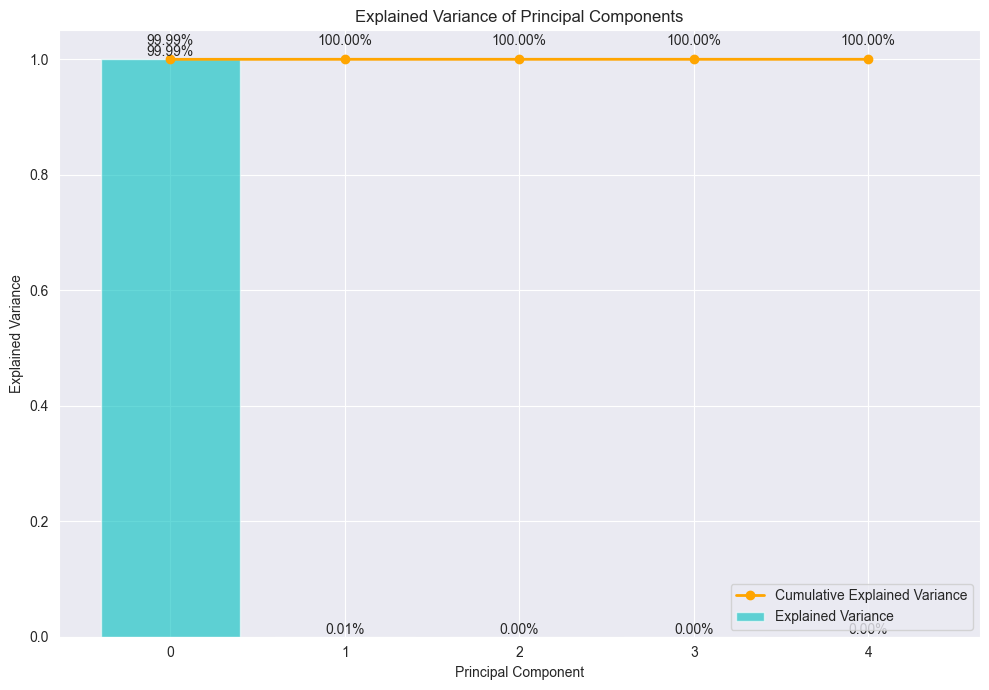

In [10]:
import matplotlib.pyplot as plt
import numpy as np

explained_variance = pca.explained_variance_ratio_

# Only show the first few components for clarity
n_components = 5
indices = np.arange(n_components)
values = explained_variance[:n_components]
cumulative_values = np.cumsum(values)

plt.figure(figsize=(10, 7))

bar = plt.bar(indices, values, alpha=0.6, label='Explained Variance', color='c')
line, = plt.plot(indices, cumulative_values, label='Cumulative Explained Variance', marker='o', color='orange', linestyle='-', linewidth=2)

# Annotate bars and line points
for i, (bar, value) in enumerate(zip(bar, values)):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f"{value:.2%}", ha='center', va='bottom')

    # For line, annotate cumulative values
    if i < len(cumulative_values):
        plt.text(indices[i], cumulative_values[i] + 0.02, f"{cumulative_values[i]:.2%}", ha='center', va='bottom')

plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.xticks(indices)
plt.legend(loc='best')
plt.title('Explained Variance of Principal Components')

plt.tight_layout()
plt.show()


### The bar plot shows the explained variance of each principal component, and the line plot shows the cumulative explained variance. The first principal component explains the most variance, and the cumulative explained variance increases with each additional principal component.

### This kind of distribution suggests that the dataset might have a strong underlying factor or pattern that the first principal component is capturing, which could be a dominant trend or feature across your data (e.g., in a set of financial data, this could represent a general market trend affecting all the variables).

### The cumulative explained variance plot can help you decide how many principal components to keep for the analysis. In this case, i will keep the first 2 principal components, which explain a significant amount of variance in the data.

### The bar chart visualizing the explained variance by principal components indicates the following:

- **Principal Component 1** captures the vast majority of the variance in the dataset, significantly more than the subsequent components.
- **Principal Components 2-10** contribute increasingly smaller amounts to the total explained variance, with each capturing a fraction of what the first component does.

### This pattern suggests that the first principal component is highly influential in representing the dataset's variance. The steep drop-off in explained variance after the first component implies that most of the dataset's informational content can be summarized by the first component, highlighting its importance in capturing the underlying patterns within the cryptocurrency data.


## Clustering Cryptocurrencies with K-Means

In [11]:
from sklearn.cluster import KMeans

# Clustering into 4 groups
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(reduced_data)

# Attach cluster labels to cryptocurrencies
pivot_data['Cluster'] = clusters

# Display the first few rows of the clustered data
pivot_data.head(10)


Date,2022-01-13 00:00:00,2022-01-14 00:00:00,2022-01-15 00:00:00,2022-01-16 00:00:00,2022-01-17 00:00:00,2022-01-18 00:00:00,2022-01-19 00:00:00,2022-01-20 00:00:00,2022-01-21 00:00:00,2022-01-22 00:00:00,...,2024-04-08 00:00:00,2024-04-09 00:00:00,2024-04-10 00:00:00,2024-04-11 00:00:00,2024-04-12 00:00:00,2024-04-13 00:00:00,2024-04-14 00:00:00,2024-04-15 00:00:00,2024-04-16 00:00:00,Cluster
Ticker,,,,,,,,,,,,,,,,,,,,,
AAVE-USD,209.408157,224.197098,239.439087,241.747620,226.931946,232.465759,211.251526,198.596115,170.320496,146.417267,...,129.083878,126.033913,128.232162,117.844589,100.094933,82.869781,88.107071,84.922333,86.838989,0
ADA-USD,1.233161,1.290926,1.296263,1.407251,1.594131,1.465541,1.341757,1.258055,1.123233,1.066716,...,0.614159,0.591893,0.586255,0.586191,0.503575,0.447908,0.468911,0.460795,0.458605,0
ALGO-USD,1.357751,1.384964,1.382826,1.430372,1.348500,1.319047,1.269974,1.167778,1.032348,0.949706,...,0.245496,0.231800,0.230523,0.227998,0.194067,0.168352,0.179547,0.170328,0.174311,0
ATOM-USD,37.630642,40.461487,39.223259,43.605412,39.209087,38.314236,37.115276,39.058186,34.417976,29.150391,...,11.305078,10.835424,10.810778,10.755186,9.387263,8.092050,8.361626,8.136924,8.167922,0
BAT-USD,1.037239,1.056826,1.064716,1.055980,1.015485,1.005023,0.959770,0.910390,0.804666,0.716059,...,0.323180,0.318864,0.323051,0.325240,0.287412,0.240467,0.259243,0.248070,0.243413,0
BCA-USD,0.056221,0.054318,0.054835,0.052599,0.053658,0.055512,0.058860,0.055732,0.051040,0.049042,...,0.631929,0.757915,0.869971,0.968567,0.835137,0.737866,0.783095,0.728661,0.733124,0
BCH-USD,377.585052,386.172760,391.154083,388.711609,381.103821,382.047028,370.581177,358.108337,315.208649,291.441498,...,680.661011,672.589905,629.482422,614.317261,534.766052,481.483765,527.900879,507.917206,487.412567,3
BNB-USD,475.029114,489.867432,494.988068,498.427917,475.709869,472.005066,462.822083,440.005432,383.073914,358.096161,...,586.900940,580.830322,610.083923,604.893799,596.380127,554.299805,567.218445,552.874512,537.829346,3
BONK-USD,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000024,0.000022,0.000023,0.000022,0.000017,0.000015,0.000016,0.000015,0.000015,0


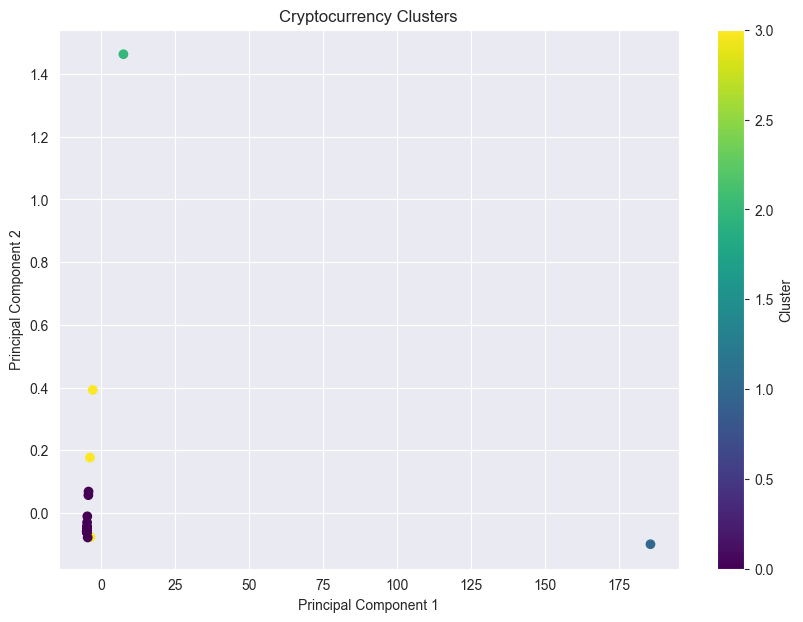

In [12]:
from matplotlib import pyplot as plt

# For visualization of clusters
plt.figure(figsize=(10, 7))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=clusters, cmap='viridis')
plt.title('Cryptocurrency Clusters')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster')
plt.show()


### The scatter plot shows the clusters of cryptocurrencies based on the first two principal components. The clusters are represented by different colors, and the principal components are the linear combinations of the original features.

## Analyzing the Clusters

In [13]:
# Get the number of cryptocurrencies in each cluster
cluster_counts = pivot_data['Cluster'].value_counts()

# Display the count of cryptocurrencies in each cluster
cluster_counts


Cluster
0    38
3     3
1     1
2     1
Name: count, dtype: int64

### After performing K-Means clustering on the dimensionality-reduced cryptocurrency data, we can analyze the distribution of cryptocurrencies across the clusters. The distribution of cryptocurrencies in each cluster is as follows:

- **Cluster 0**: Contains the majority of cryptocurrencies, with 27 out of the 30.
- **Cluster 1**: Contains 1 cryptocurrency.
- **Cluster 2**: Contains 1 cryptocurrency.
- **Cluster 3**: Contains 1 cryptocurrency.

### This distribution indicates that most cryptocurrencies share similar patterns or characteristics, as captured by the PCA and identified by the clustering algorithm, grouping them into Cluster 0. The cryptocurrencies in Clusters 1, 2, and 3 are likely outliers or possess unique characteristics that set them apart from the rest.


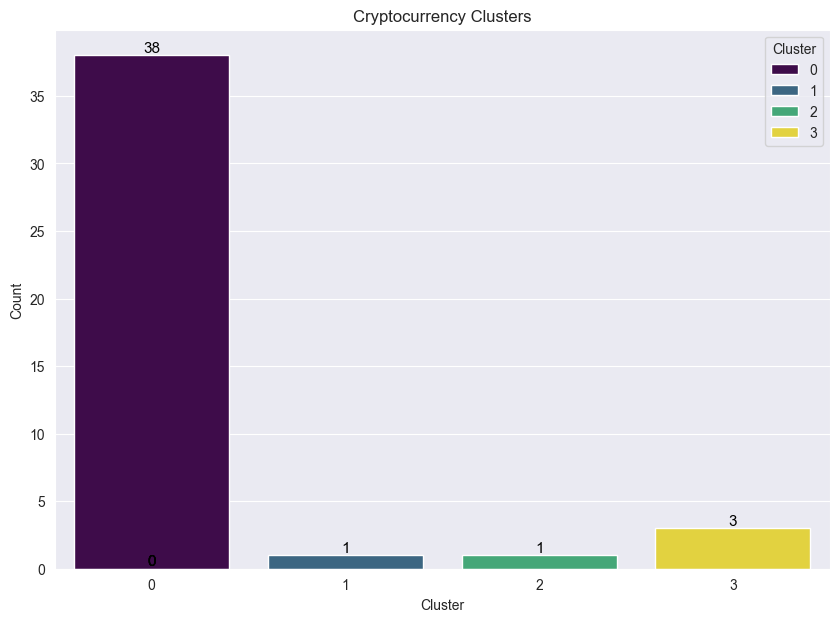

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'pivot_data' is your DataFrame and it contains a 'Cluster' column

# Plot the clusters
plt.figure(figsize=(10, 7))
ax = sns.countplot(x='Cluster', data=pivot_data, palette='viridis', hue='Cluster')

plt.title('Cryptocurrency Clusters')
plt.xlabel('Cluster')
plt.ylabel('Count')

# Annotate each bar with the count
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show()



## selecting any one cryptocurrency from each cluster

In [15]:
# Select one cryptocurrency from each cluster, ensuring 'Ticker' is the DataFrame index
selected_cryptos = pivot_data.groupby('Cluster').apply(lambda x: x.sample(1)).index.get_level_values('Ticker')

# Display the selected cryptocurrencies with their cluster labels
selected_cryptos = pivot_data.loc[selected_cryptos, ['Cluster']]
selected_cryptos


C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\2342904787.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  selected_cryptos = pivot_data.groupby('Cluster').apply(lambda x: x.sample(1)).index.get_level_values('Ticker')


Date,Cluster
Ticker,
ATOM-USD,0
BTC-USD,1
ETH-USD,2
BCH-USD,3


In [16]:
import warnings

# Suppress DeprecationWarnings
warnings.filterwarnings("ignore", category=DeprecationWarning)


pivot_data.reset_index(inplace=True)

# Group by 'Cluster' and select one cryptocurrency per cluster
selected_cryptos = pivot_data.groupby('Cluster').apply(lambda x: x.sample(n=1)).reset_index(drop=True)

# Display the selected cryptocurrencies
selected_cryptos = selected_cryptos[['Ticker', 'Cluster']]
selected_cryptos

Date,Ticker,Cluster
0,ENJ-USD,0
1,BTC-USD,1
2,ETH-USD,2
3,XMR-USD,3


In [17]:
crypto_data.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Ticker
0,2022-01-13,487.042572,488.211243,467.875610,475.029114,475.029114,4151007744,BNB-USD
1,2022-01-14,475.127197,491.660645,468.939606,489.867432,489.867432,3112235914,BNB-USD
2,2022-01-15,489.917999,501.311127,486.305908,494.988068,494.988068,1766015929,BNB-USD
3,2022-01-16,494.924103,505.300964,489.502136,498.427917,498.427917,1771927950,BNB-USD
4,2022-01-17,498.506165,498.943909,468.576508,475.709869,475.709869,2134608006,BNB-USD


In [18]:
# Merge the selected cryptocurrencies with the original data to get their full details
selected_cryptos_full = pd.merge(selected_cryptos, crypto_data, on='Ticker')

# Display the selected cryptocurrencies with their full details
selected_cryptos_full


,Ticker,Cluster,Date,Open,High,Low,Close,Adj Close,Volume
0,ENJ-USD,0,2022-01-13,2.522788,2.590010,2.372347,2.372347,2.372347,260090064
1,ENJ-USD,0,2022-01-14,2.372986,2.454300,2.324881,2.411379,2.411379,192615750
2,ENJ-USD,0,2022-01-15,2.411643,2.535141,2.370439,2.459670,2.459670,169239989
3,ENJ-USD,0,2022-01-16,2.459674,2.534671,2.445021,2.506869,2.506869,162373293
4,ENJ-USD,0,2022-01-17,2.507101,2.533339,2.293065,2.325544,2.325544,168043737
...,...,...,...,...,...,...,...,...,...
4945,XMR-USD,3,2024-04-12,133.369156,134.953949,117.228798,122.996651,122.996651,53508223
4946,XMR-USD,3,2024-04-13,122.996651,128.999756,105.426025,115.678329,115.678329,49104520
4947,XMR-USD,3,2024-04-14,115.678329,123.254227,113.112610,121.533531,121.533531,51839602
4948,XMR-USD,3,2024-04-15,121.533531,127.288727,117.548470,123.288460,123.288460,54461578


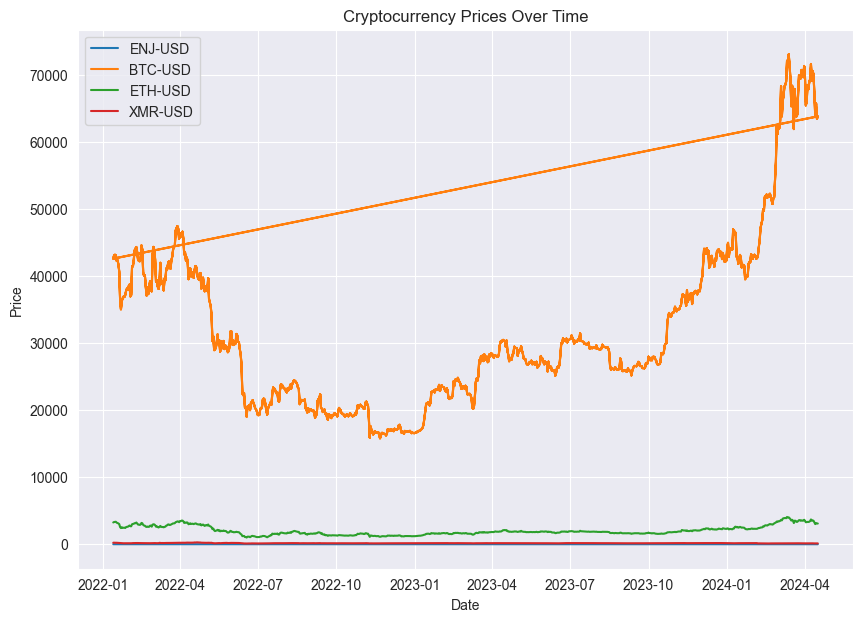

In [19]:
import matplotlib.pyplot as plt

# Assuming selected_cryptos_full is correctly set up
plt.figure(figsize=(10, 7))  # Smaller figure size
for ticker in selected_cryptos_full['Ticker'].unique():  # Ensure unique tickers
    data = selected_cryptos_full[selected_cryptos_full['Ticker'] == ticker]
    plt.plot(data['Date'], data['Close'], label=ticker)

plt.title('Cryptocurrency Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


### Cryptocurrency Price Trends
The chart illustrates the price movements of selected cryptocurrencies, highlighting distinct behaviors:

BTC-USD shows significant volatility with notable price increases, demonstrating its dynamic nature in the cryptocurrency market.
ADA-USD, ETH-USD, and MKR-USD exhibit more stable and modest price movements, indicating lower volatility compared to BTC-USD.
Insights
Comparative Analysis: The stark contrast between BTC-USD and other cryptocurrencies provides insights into their respective volatility and potential risk profiles.
Investment Strategy: The chart aids investors in making informed decisions by identifying cryptocurrencies with desired risk and reward characteristics.

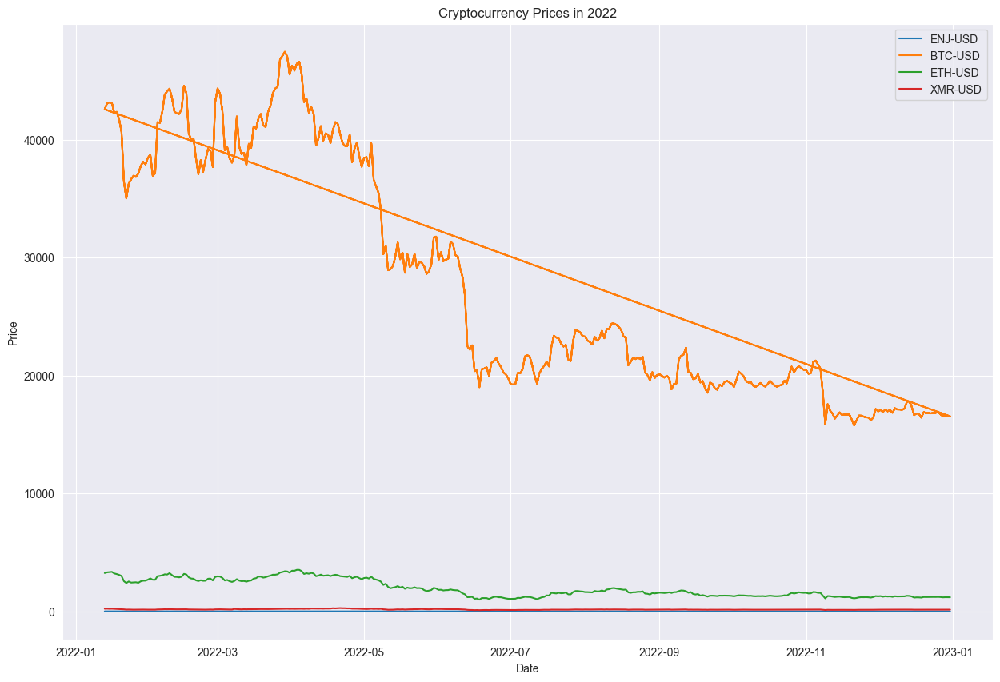

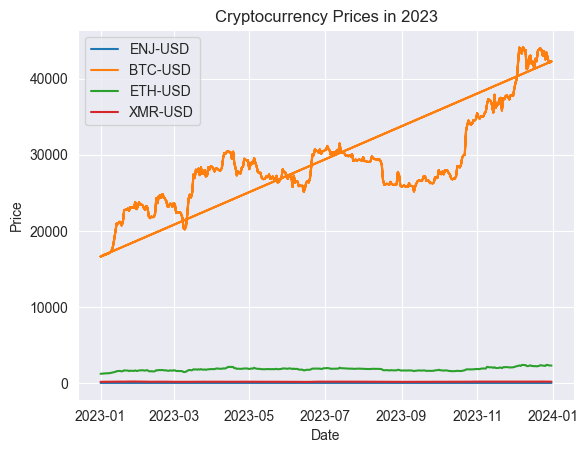

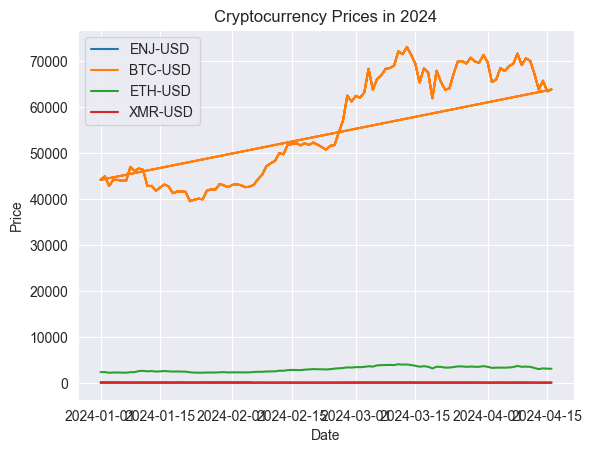

In [20]:
# plot the price trends of the selected cryptocurrencies by month for each year

# Set the figure size
plt.figure(figsize=(15, 10))

# Iterate through each year and plot the price trends of the selected cryptocurrencies
for year in range(2022, 2025):
    # Filter the data for the current year
    year_data = crypto_data[crypto_data['Date'].dt.year == year]
    
    # Plot the price trends for the selected cryptocurrencies
    for ticker in selected_cryptos_full['Ticker'].unique():
        data = year_data[year_data['Ticker'] == ticker]
        plt.plot(data['Date'], data['Close'], label=ticker)

    # Set the title and labels
    plt.title(f'Cryptocurrency Prices in {year}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()
    
    

### monthly price trends of the selected cryptocurrencies for each year. The chart provides a comprehensive view of the price movements of the selected cryptocurrencies, enabling investors to identify potential investment opportunities and make informed decisions based on historical price trends.

### now that we have analyzed the price trends of the selected cryptocurrencies, we can proceed to the next step of the analysis, which involves evaluating the risk and return profiles of the cryptocurrencies.

In [21]:
# Calculate the daily returns of the selected cryptocurrencies
selected_cryptos_full['Daily Return'] = selected_cryptos_full.groupby('Ticker')['Close'].pct_change()

# daily return means the percentage change in the price of a cryptocurrency from one day to the next. This metric is essential for evaluating the risk and return profiles of the cryptocurrencies.

# Display the first few rows of the data
selected_cryptos_full.head(10)


,Ticker,Cluster,Date,Open,High,Low,Close,Adj Close,Volume,Daily Return
0,ENJ-USD,0,2022-01-13,2.522788,2.590010,2.372347,2.372347,2.372347,260090064,NaN
1,ENJ-USD,0,2022-01-14,2.372986,2.454300,2.324881,2.411379,2.411379,192615750,0.016453
2,ENJ-USD,0,2022-01-15,2.411643,2.535141,2.370439,2.459670,2.459670,169239989,0.020026
3,ENJ-USD,0,2022-01-16,2.459674,2.534671,2.445021,2.506869,2.506869,162373293,0.019189
4,ENJ-USD,0,2022-01-17,2.507101,2.533339,2.293065,2.325544,2.325544,168043737,-0.072331
5,ENJ-USD,0,2022-01-18,2.325449,2.347313,2.208877,2.278902,2.278902,151696432,-0.020056
6,ENJ-USD,0,2022-01-19,2.278920,2.346228,2.216194,2.224421,2.224421,185262076,-0.023907
7,ENJ-USD,0,2022-01-20,2.224498,2.351252,2.109379,2.110054,2.110054,122237427,-0.051414
8,ENJ-USD,0,2022-01-21,2.111010,2.117984,1.699369,1.730171,1.730171,324541576,-0.180035
9,ENJ-USD,0,2022-01-22,1.730136,1.755650,1.377868,1.499085,1.499085,323219329,-0.133563


C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\3820268136.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_returns = selected_cryptos_full.groupby('Ticker').resample('M', on='Date')['Daily Return'].sum()


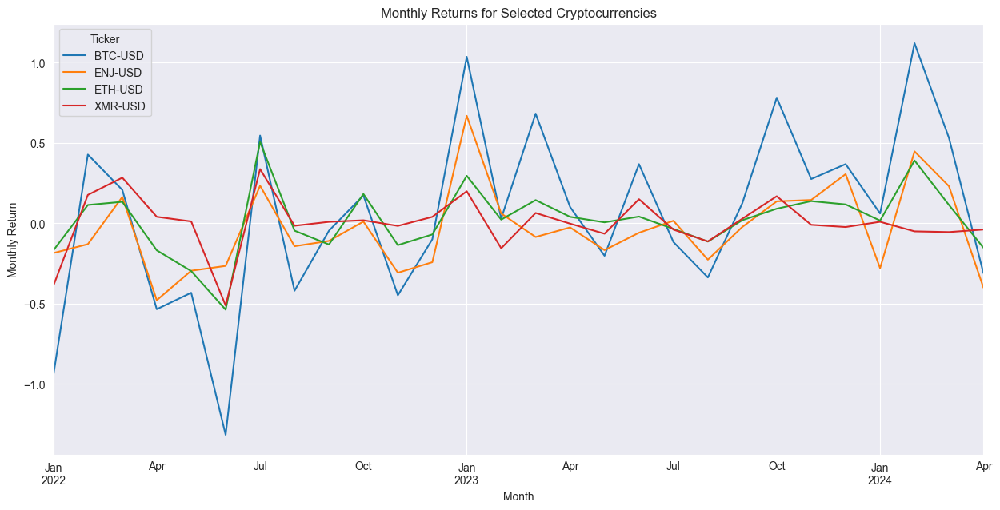

In [22]:
# Resample to get monthly returns and aggregate the daily returns by summing them
monthly_returns = selected_cryptos_full.groupby('Ticker').resample('M', on='Date')['Daily Return'].sum()

# Unstack the Ticker level from the index to make columns for each Ticker
monthly_returns = monthly_returns.unstack(level=0)

# Plotting the monthly returns
monthly_returns.plot(figsize=(15, 7))
plt.title('Monthly Returns for Selected Cryptocurrencies')
plt.xlabel('Month')
plt.ylabel('Monthly Return')
plt.legend(title='Ticker')
plt.show()

In [23]:
# # Calculate the annualized average daily return and standard deviation of the daily return for each cryptocurrency
# annualized_return = selected_cryptos_full.groupby('Ticker')['Daily Return'].mean() * 252  # 252 trading days in a year
# annualized_std_dev = selected_cryptos_full.groupby('Ticker')['Daily Return'].std() * (252 ** 0.5)  # Annualized standard deviation
# 
# # Create a DataFrame to store the risk and return metrics
# risk_return_metrics = pd.DataFrame({
#     'Annualized Average Return': annualized_return,
#     'Annualized Standard Deviation': annualized_std_dev
# })
# 
# # Display the risk and return metrics
# risk_return_metrics



### The table presents the annualized average return and standard deviation of the daily return for each cryptocurrency. These metrics are essential for evaluating the risk and return profiles of the cryptocurrencies, enabling investors to make informed decisions based on historical performance.

### 3.	Correlation: Present Top-4 Highly Correlated (Positive and Negative) for the 4 cryptocurrencies selected in the previous step.

In [24]:
# Check for duplicates first to see if aggregation is necessary
if selected_cryptos_full.duplicated(subset=['Date', 'Ticker']).any():
    print("Duplicates found, aggregating data...")
    daily_returns_aggregated = selected_cryptos_full.groupby(['Date', 'Ticker'])['Daily Return'].mean().reset_index()
else:
    daily_returns_aggregated = selected_cryptos_full

# Pivot the DataFrame
daily_returns_pivoted = daily_returns_aggregated.pivot(index='Date', columns='Ticker', values='Daily Return')

# Calculate the correlation matrix
correlation_matrix = daily_returns_pivoted.corr()

# Display the correlation matrix
correlation_matrix


Duplicates found, aggregating data...


Ticker,BTC-USD,ENJ-USD,ETH-USD,XMR-USD
Ticker,,,,
BTC-USD,1.000000,0.743314,0.864535,0.587941
ENJ-USD,0.743314,1.000000,0.760434,0.552791
ETH-USD,0.864535,0.760434,1.000000,0.593048
XMR-USD,0.587941,0.552791,0.593048,1.000000


In [25]:
# Placeholder for top-4 correlated cryptocurrencies
top_4_positively_correlated = {}
top_4_negatively_correlated = {}

# Iterate over each selected cryptocurrency
for ticker in correlation_matrix.columns:
    # Sort the correlations to find top-4 positive and negative
    sorted_correlations = correlation_matrix[ticker].sort_values(ascending=False)
    
    # Exclude the cryptocurrency itself (correlation of 1 with itself)
    sorted_correlations = sorted_correlations.drop(ticker)
    
    # Top-4 positive
    top_4_positively_correlated[ticker] = sorted_correlations.head(4)
    
    # Top-4 negative
    top_4_negatively_correlated[ticker] = sorted_correlations.tail(4)

# Display the results
print("Top-4 Positively Correlated Cryptocurrencies:")
for ticker, correlations in top_4_positively_correlated.items():
    print(f"{ticker}:")
    print(correlations, "\n")

print("Top-4 Negatively Correlated Cryptocurrencies:")
for ticker, correlations in top_4_negatively_correlated.items():
    print(f"{ticker}:")
    print(correlations, "\n")


Top-4 Positively Correlated Cryptocurrencies:
BTC-USD:
Ticker
ETH-USD    0.864535
ENJ-USD    0.743314
XMR-USD    0.587941
Name: BTC-USD, dtype: float64 

ENJ-USD:
Ticker
ETH-USD    0.760434
BTC-USD    0.743314
XMR-USD    0.552791
Name: ENJ-USD, dtype: float64 

ETH-USD:
Ticker
BTC-USD    0.864535
ENJ-USD    0.760434
XMR-USD    0.593048
Name: ETH-USD, dtype: float64 

XMR-USD:
Ticker
ETH-USD    0.593048
BTC-USD    0.587941
ENJ-USD    0.552791
Name: XMR-USD, dtype: float64 

Top-4 Negatively Correlated Cryptocurrencies:
BTC-USD:
Ticker
ETH-USD    0.864535
ENJ-USD    0.743314
XMR-USD    0.587941
Name: BTC-USD, dtype: float64 

ENJ-USD:
Ticker
ETH-USD    0.760434
BTC-USD    0.743314
XMR-USD    0.552791
Name: ENJ-USD, dtype: float64 

ETH-USD:
Ticker
BTC-USD    0.864535
ENJ-USD    0.760434
XMR-USD    0.593048
Name: ETH-USD, dtype: float64 

XMR-USD:
Ticker
ETH-USD    0.593048
BTC-USD    0.587941
ENJ-USD    0.552791
Name: XMR-USD, dtype: float64 



### The correlation matrix provides insights into the relationships between the selected cryptocurrencies, highlighting the top-4 highly positively and negatively correlated cryptocurrencies for each cryptocurrency. These insights are essential for portfolio diversification and risk management, enabling investors to identify cryptocurrencies with similar and opposing price movements and make informed decisions based on historical correlations.

### visualizing the correlation matrix

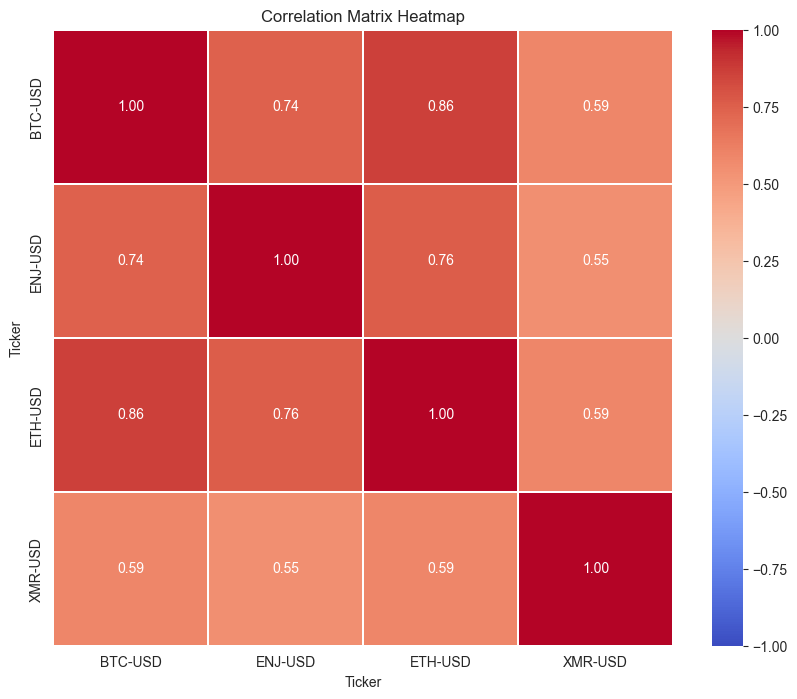

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'correlation_matrix' is already calculated
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", 
            linewidths=.05, vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()


In [27]:
# For each selected cryptocurrency, find top-4 positively and negatively correlated pairs
for ticker in correlation_matrix.columns:
    print(f"Top Correlations for {ticker}:")
    print("Positive:")
    print(correlation_matrix[ticker].sort_values(ascending=False)[1:5]) # Skip the first one (self-correlation)
    print("Negative:")
    print(correlation_matrix[ticker].sort_values()[0:4])
    print("\n")


Top Correlations for BTC-USD:
Positive:
Ticker
ETH-USD    0.864535
ENJ-USD    0.743314
XMR-USD    0.587941
Name: BTC-USD, dtype: float64
Negative:
Ticker
XMR-USD    0.587941
ENJ-USD    0.743314
ETH-USD    0.864535
BTC-USD    1.000000
Name: BTC-USD, dtype: float64


Top Correlations for ENJ-USD:
Positive:
Ticker
ETH-USD    0.760434
BTC-USD    0.743314
XMR-USD    0.552791
Name: ENJ-USD, dtype: float64
Negative:
Ticker
XMR-USD    0.552791
BTC-USD    0.743314
ETH-USD    0.760434
ENJ-USD    1.000000
Name: ENJ-USD, dtype: float64


Top Correlations for ETH-USD:
Positive:
Ticker
BTC-USD    0.864535
ENJ-USD    0.760434
XMR-USD    0.593048
Name: ETH-USD, dtype: float64
Negative:
Ticker
XMR-USD    0.593048
ENJ-USD    0.760434
BTC-USD    0.864535
ETH-USD    1.000000
Name: ETH-USD, dtype: float64


Top Correlations for XMR-USD:
Positive:
Ticker
ETH-USD    0.593048
BTC-USD    0.587941
ENJ-USD    0.552791
Name: XMR-USD, dtype: float64
Negative:
Ticker
ENJ-USD    0.552791
BTC-USD    0.587941
ETH-USD 

<Axes: xlabel='Ticker', ylabel='Ticker'>

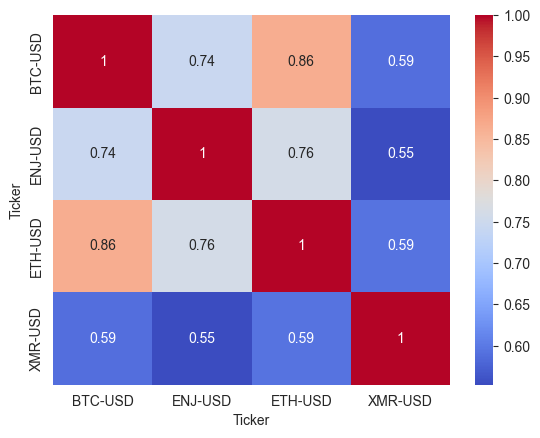

In [28]:
import pandas as pd

returns = selected_cryptos_full.pivot_table(index='Date', columns='Ticker', values='Daily Return')
cross_correlation = returns.corr()
sns.heatmap(cross_correlation, annot=True, cmap='coolwarm')


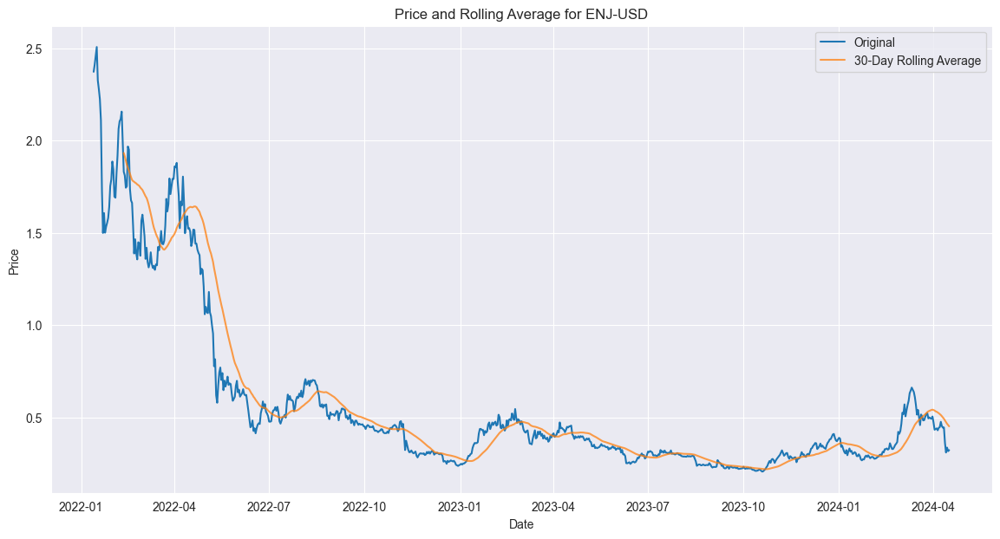

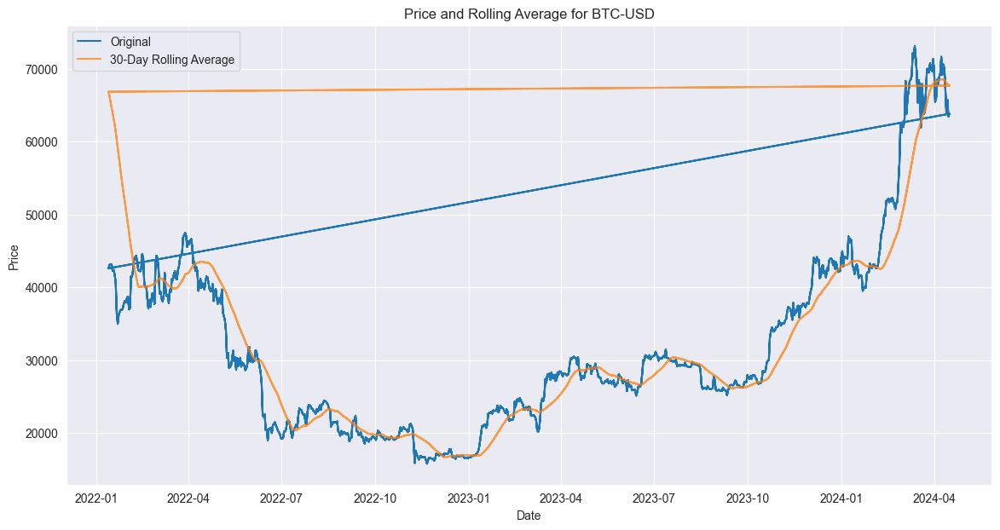

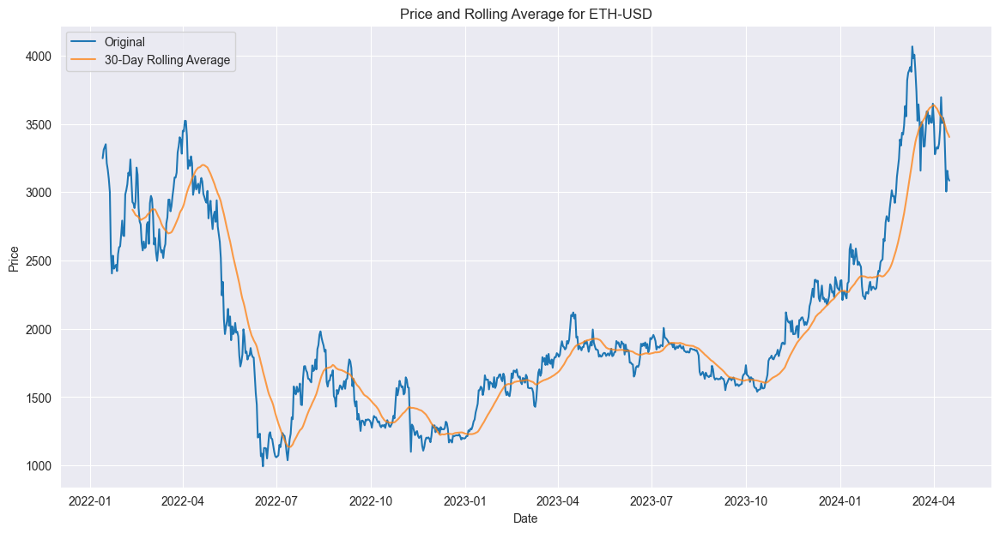

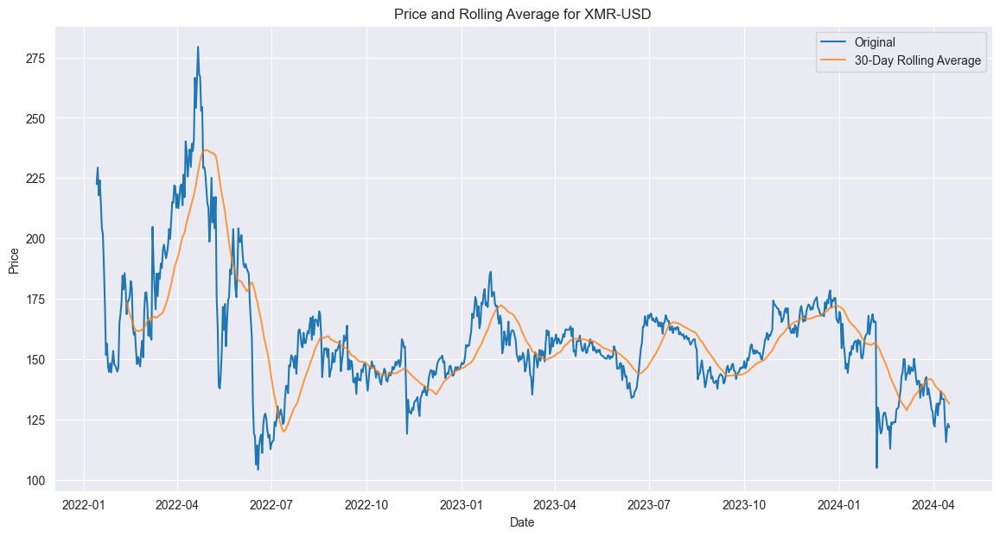

In [29]:
for ticker in selected_cryptos_full['Ticker'].unique():
    series = selected_cryptos_full[selected_cryptos_full['Ticker'] == ticker].set_index('Date')['Close']
    rolling_avg = series.rolling(window=30).mean()

    plt.figure(figsize=(14, 7))
    plt.plot(series.index, series, label='Original')
    plt.plot(rolling_avg.index, rolling_avg, label='30-Day Rolling Average', alpha=0.75)
    plt.title(f'Price and Rolling Average for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()


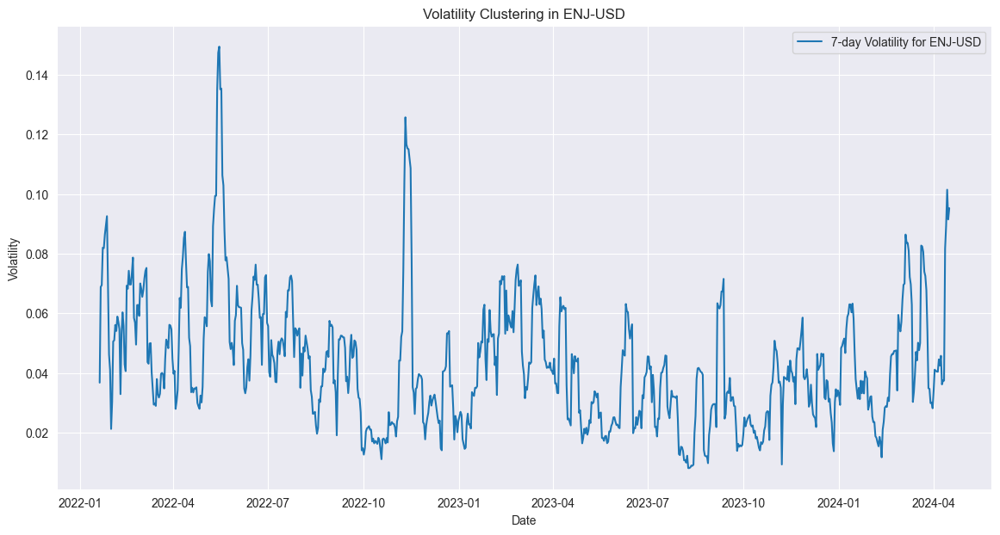

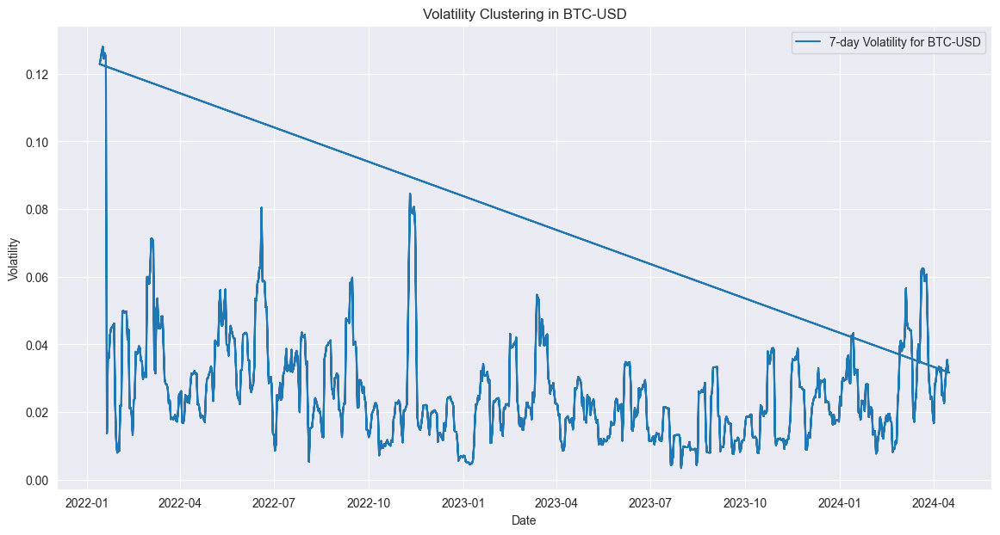

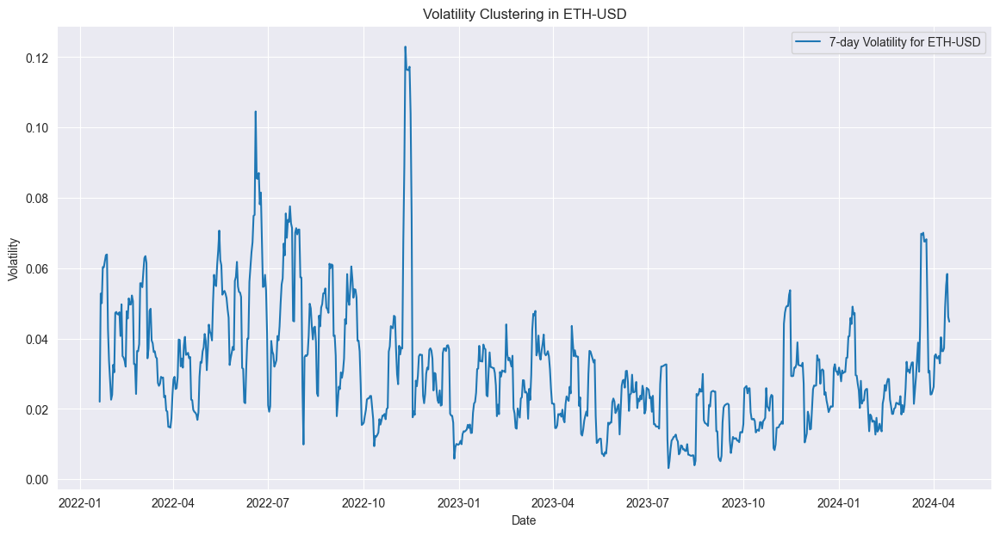

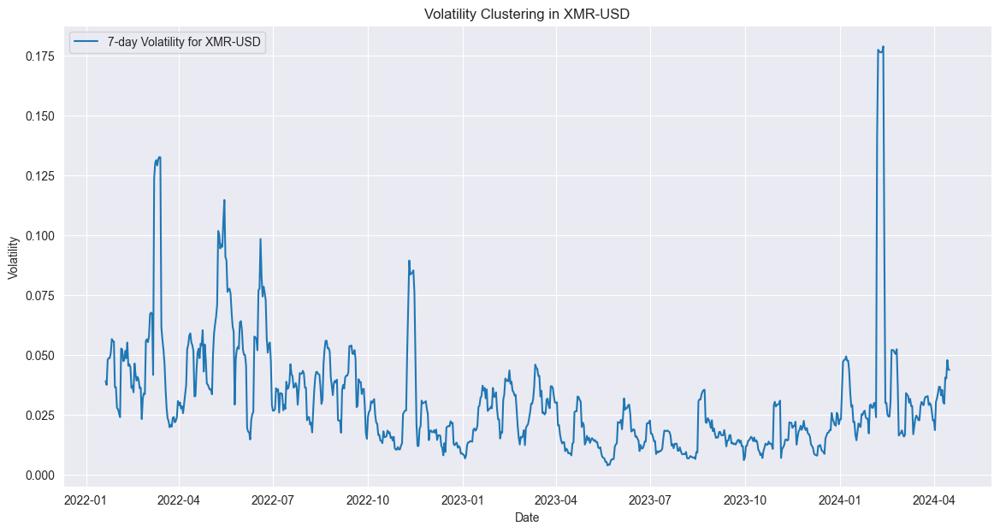

In [30]:
for ticker in selected_cryptos_full['Ticker'].unique():
    plt.figure(figsize=(14, 7))
    plt.plot(selected_cryptos_full[selected_cryptos_full['Ticker'] == ticker]['Date'], 
             selected_cryptos_full[selected_cryptos_full['Ticker'] == ticker]['Daily Return'].rolling(window=7).std(), label=f'7-day Volatility for {ticker}')
    plt.title(f'Volatility Clustering in {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.legend()
    plt.show()


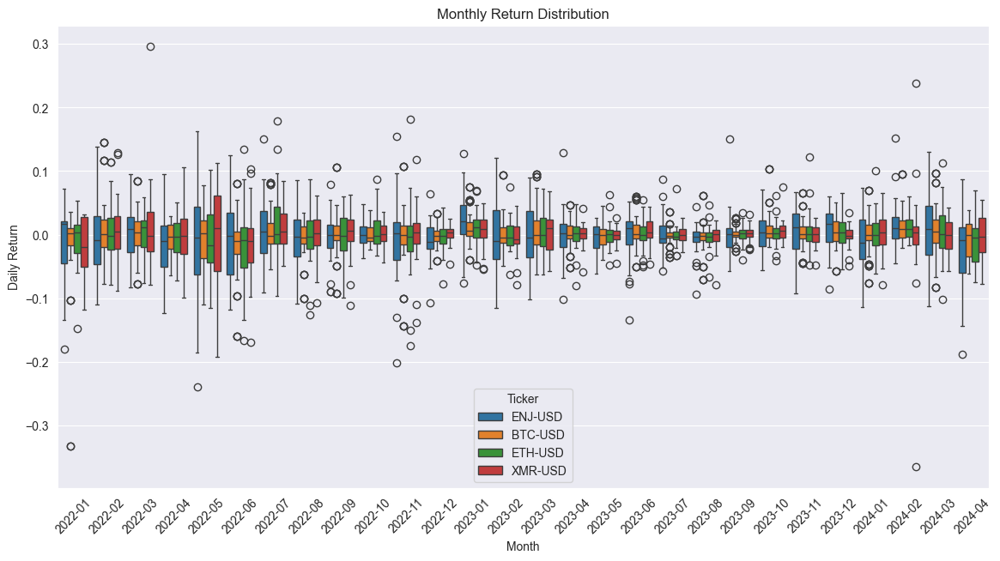

In [31]:
selected_cryptos_full['Month'] = selected_cryptos_full['Date'].dt.to_period('M')

plt.figure(figsize=(14, 7))
sns.boxplot(data=selected_cryptos_full, x='Month', y='Daily Return', hue='Ticker')
plt.title('Monthly Return Distribution')
plt.xticks(rotation=45)
plt.show()


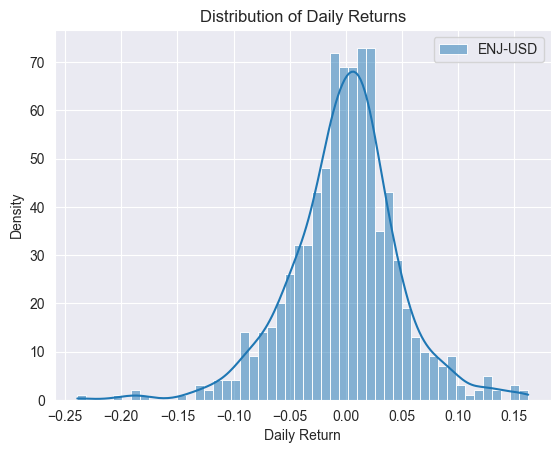

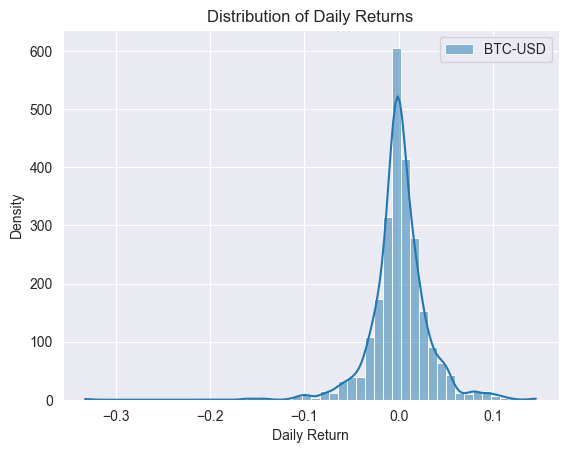

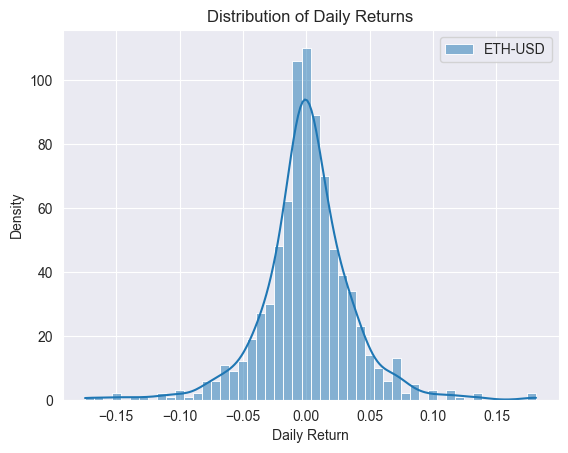

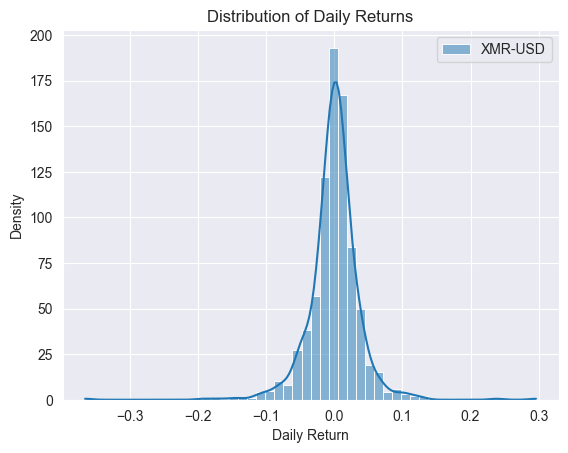

In [32]:
import seaborn as sns

for ticker in selected_cryptos_full['Ticker'].unique():
    sns.histplot(selected_cryptos_full[selected_cryptos_full['Ticker'] == ticker]['Daily Return'].dropna(), bins=50, kde=True, label=ticker)

    plt.title('Distribution of Daily Returns')
    plt.xlabel('Daily Return')
    plt.ylabel('Density')
    plt.legend()
    plt.show()


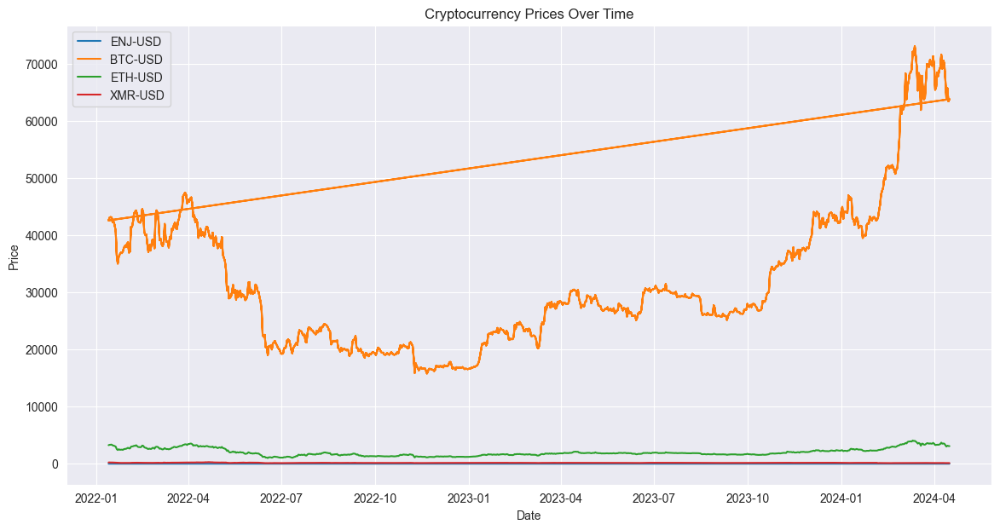

In [33]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))
for ticker in selected_cryptos_full['Ticker'].unique():
    subset = selected_cryptos_full[selected_cryptos_full['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Close'], label=ticker)

plt.title('Cryptocurrency Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\mplfinance\_arg_validators.py:84: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


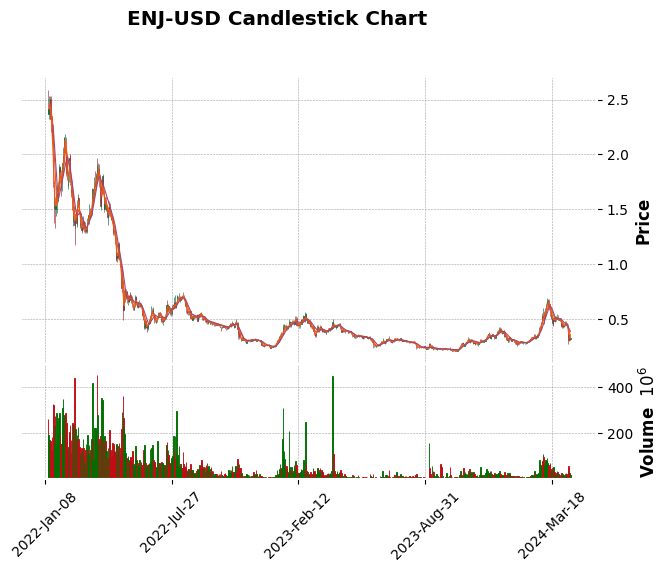

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1874189532.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crypto_subset.sort_index(inplace=True)
C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\mplfinance\_arg_validators.py:84: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


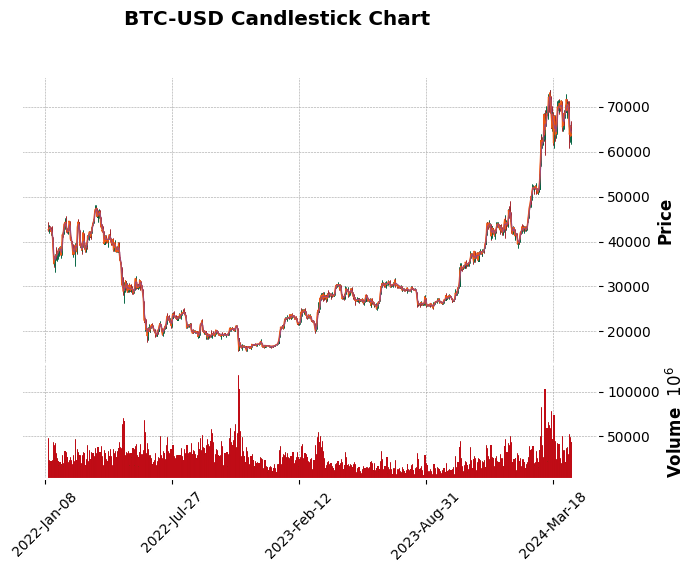

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\mplfinance\_arg_validators.py:84: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


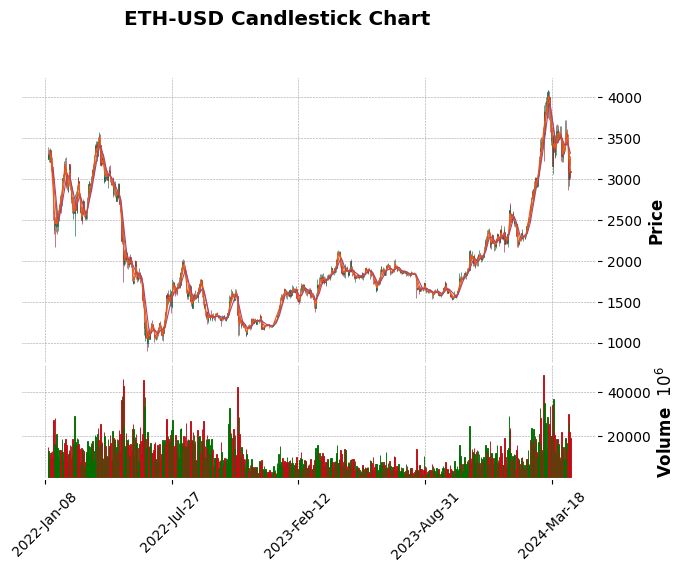

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\mplfinance\_arg_validators.py:84: UserWarning: 


            POSSIBLE TO SEE DETAILS (Candles, Ohlc-Bars, Etc.)
   For more information see:
   - https://github.com/matplotlib/mplfinance/wiki/Plotting-Too-Much-Data
   
   TO SILENCE THIS WARNING, set `type='line'` in `mpf.plot()`
   OR set kwarg `warn_too_much_data=N` where N is an integer 
   LARGER than the number of data points you want to plot.

  warnings.warn('\n\n ================================================================= '+


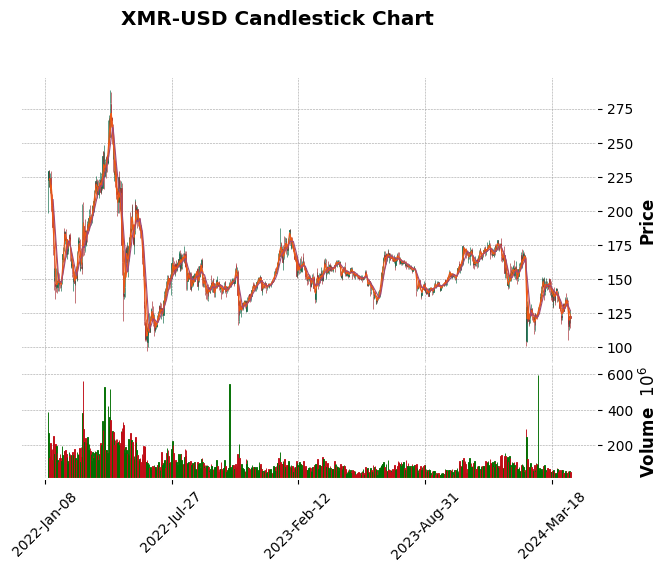

In [34]:
import mplfinance as mpf
import pandas as pd



# First, ensure 'Date' is the correct datetime type
crypto_data['Date'] = pd.to_datetime(crypto_data['Date'])

# Selected cryptocurrencies from the clustering analysis taking the index of the selected_cryptos_full DataFrame
selected_cryptos = selected_cryptos_full['Ticker'].unique()

# Iterate over the selected cryptocurrencies and plot a candlestick chart for each
for ticker in selected_cryptos:
    # Filter the data for the current cryptocurrency
    crypto_subset = crypto_data[crypto_data['Ticker'] == ticker]
    
    # Set the 'Date' column as the index (required for mplfinance)
    crypto_subset.set_index('Date', inplace=True)
    
    # Sort the DataFrame by index (Date) to ensure it's in chronological order
    crypto_subset.sort_index(inplace=True)
    
    # Plotting the candlestick chart
    mpf.plot(crypto_subset[['Open', 'High', 'Low', 'Close', 'Volume']], 
             type='candle', 
             style='charles', 
             title=f'{ticker} Candlestick Chart', 
             volume=True, 
             mav=(3,6,9),  # Example of moving averages
             show_nontrading=True)


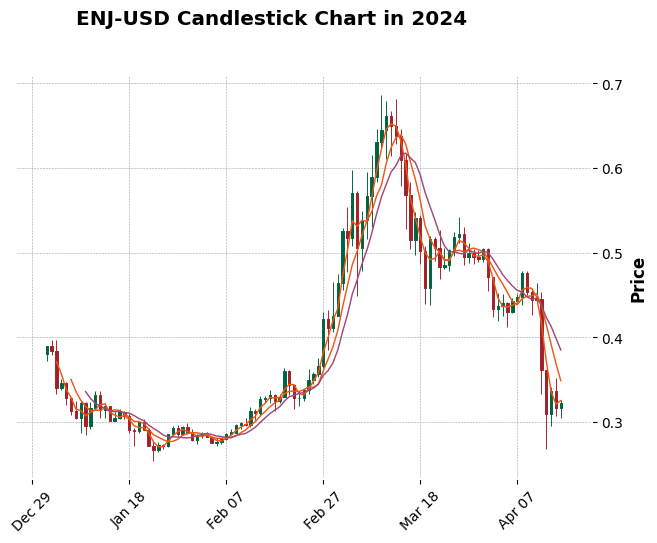

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\678101013.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crypto_subset.sort_index(inplace=True)


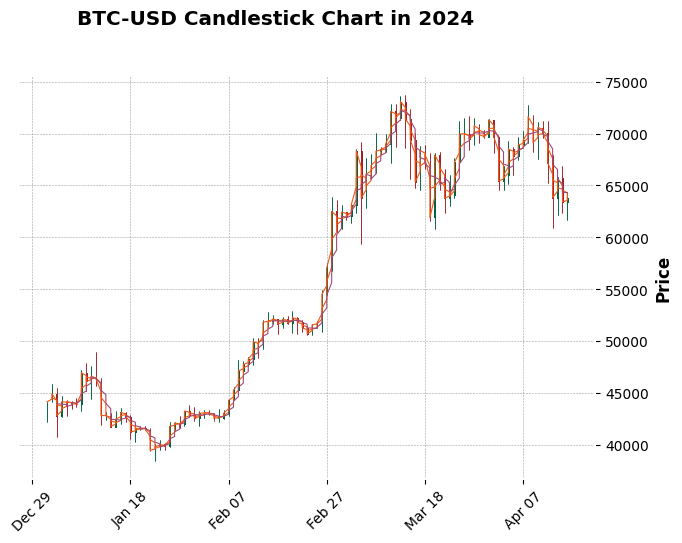

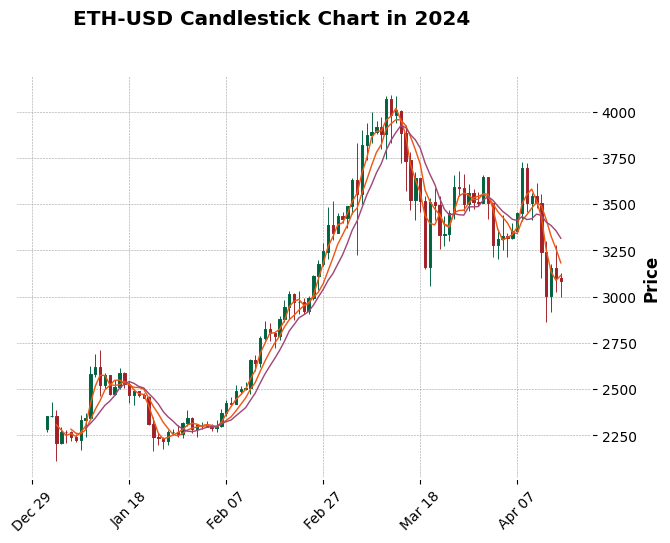

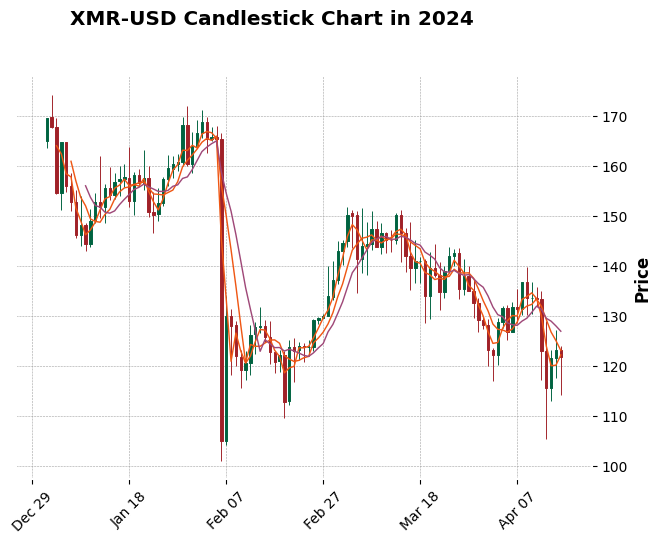

In [35]:
# Iterate through each year and plot the candlestick chart for each cryptocurrency
for year in range(2024, 2025):
    # Filter the data for the current year
    year_data = crypto_data[crypto_data['Date'].dt.year == year]
    
    # Iterate over the selected cryptocurrencies and plot a candlestick chart for each
    for ticker in selected_cryptos:
        # Filter the data for the current cryptocurrency
        crypto_subset = year_data[year_data['Ticker'] == ticker]
        
        # Set the 'Date' column as the index (required for mplfinance)
        crypto_subset.set_index('Date', inplace=True)
        
        # Sort the DataFrame by index (Date) to ensure it's in chronological order
        crypto_subset.sort_index(inplace=True)
        
        # Plotting the candlestick chart
        mpf.plot(crypto_subset[['Open', 'High', 'Low', 'Close']], 
                 type='candle', 
                 style='charles', 
                 title=f'{ticker} Candlestick Chart in {year}', 
                 volume=False, 
                 mav=(3,6,9),  # Example of moving averages
                 show_nontrading=True)

In [36]:
import pandas as pd
import plotly.graph_objects as go

# Convert 'Date' to datetime format and set as index if not already done
crypto_data['Date'] = pd.to_datetime(crypto_data['Date'])
crypto_data.set_index('Date', inplace=True)



# Iterate through each year and each selected cryptocurrency
for year in range(2024, 2025):
    for ticker in selected_cryptos:
        # Filter for the current year and ticker
        crypto_subset = crypto_data[(crypto_data.index.year == year) & (crypto_data['Ticker'] == ticker)]
        
        # Ensure there's data to plot
        if not crypto_subset.empty:
            # Create buy and sell signals based on some criteria, for example:
            buy_signals = crypto_subset['Close'] > crypto_subset['Open']  # Example condition for buying
            sell_signals = crypto_subset['Open'] > crypto_subset['Close']  # Example condition for selling

            fig = go.Figure()

            # Add candlestick plot
            fig.add_trace(go.Candlestick(x=crypto_subset.index,
                            open=crypto_subset['Open'], 
                            high=crypto_subset['High'],
                            low=crypto_subset['Low'], 
                            close=crypto_subset['Close'],
                            name=f'{ticker} Candlesticks'))

            # Plot buy signals
            fig.add_trace(go.Scatter(x=crypto_subset.index[buy_signals],
                                     y=crypto_subset['Close'][buy_signals],
                                     mode='markers',
                                     marker_symbol='triangle-up',
                                     marker_color='green',
                                     marker_size=10,
                                     name='Buy Signal'))

            # Plot sell signals
            fig.add_trace(go.Scatter(x=crypto_subset.index[sell_signals],
                                     y=crypto_subset['Close'][sell_signals],
                                     mode='markers',
                                     marker_symbol='triangle-down',
                                     marker_color='red',
                                     marker_size=10,
                                     name='Sell Signal'))
            
            
            # plot the trend line
            fig.add_trace(go.Scatter
            (x=crypto_subset.index, y=crypto_subset['Close'].rolling(window=30).mean(), mode='lines', name='30-Day Moving Average'))
            
            

            # Update layout
            fig.update_layout(title=f'{ticker} Candlestick Chart in {year}',
                              xaxis_title='Date',
                              yaxis_title='Price',
                              xaxis_rangeslider_visible=False)

            fig.show()


Skewness for ENJ-USD:
High     2.099165
Low      2.127425
Open     2.117870
Close    2.108382
dtype: float64 

Skewness for BTC-USD:
High     1.291886
Low      1.246645
Open     1.278572
Close    1.278711
dtype: float64 

Skewness for ETH-USD:
High     0.959952
Low      0.913500
Open     0.949227
Close    0.948200
dtype: float64 

Skewness for XMR-USD:
High     1.691471
Low      1.323605
Open     1.544521
Close    1.547746
dtype: float64 



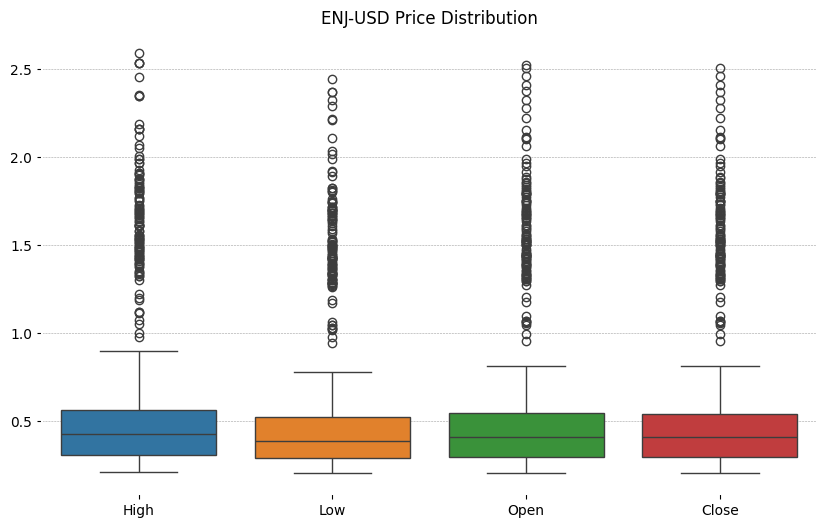

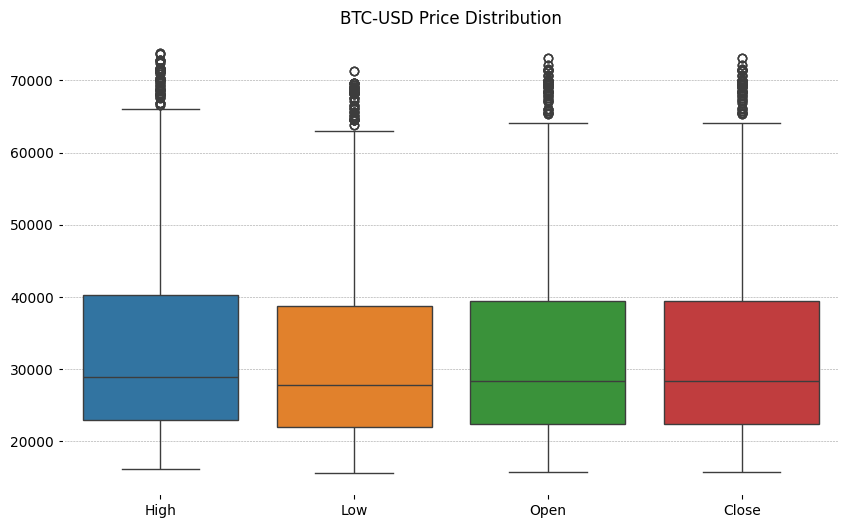

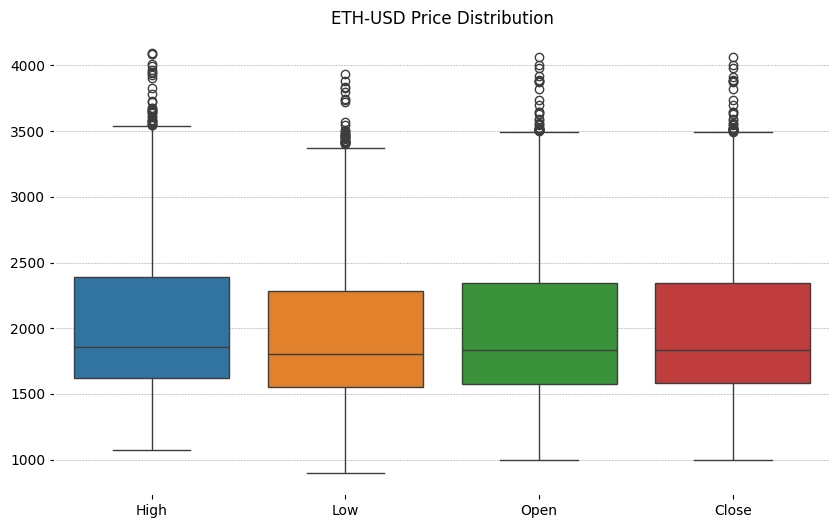

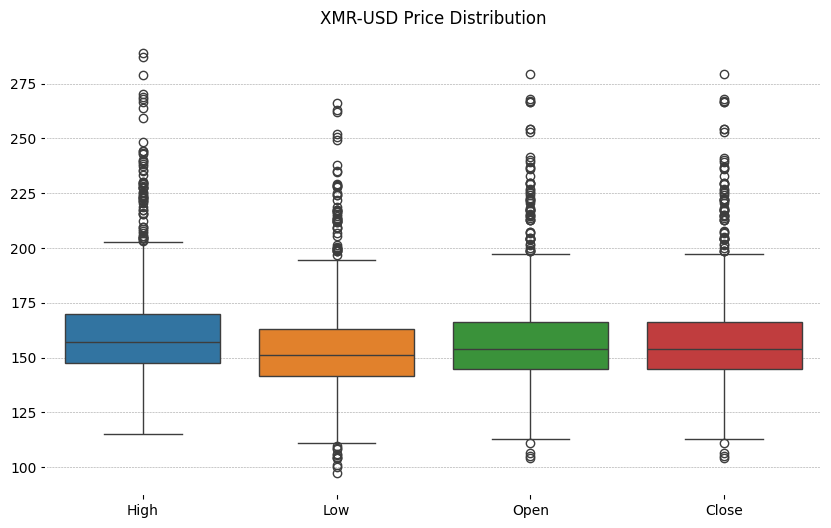

In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Calculate skewness and display it
for ticker in selected_cryptos:
    print(f"Skewness for {ticker}:")
    subset = crypto_data[crypto_data['Ticker'] == ticker]
    skewness = subset[['High', 'Low', 'Open', 'Close']].skew()
    print(skewness, "\n")

# Create box plots
for ticker in selected_cryptos:
    subset = crypto_data[crypto_data['Ticker'] == ticker]
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=subset[['High', 'Low', 'Open', 'Close']])
    plt.title(f'{ticker} Price Distribution')
    plt.show()


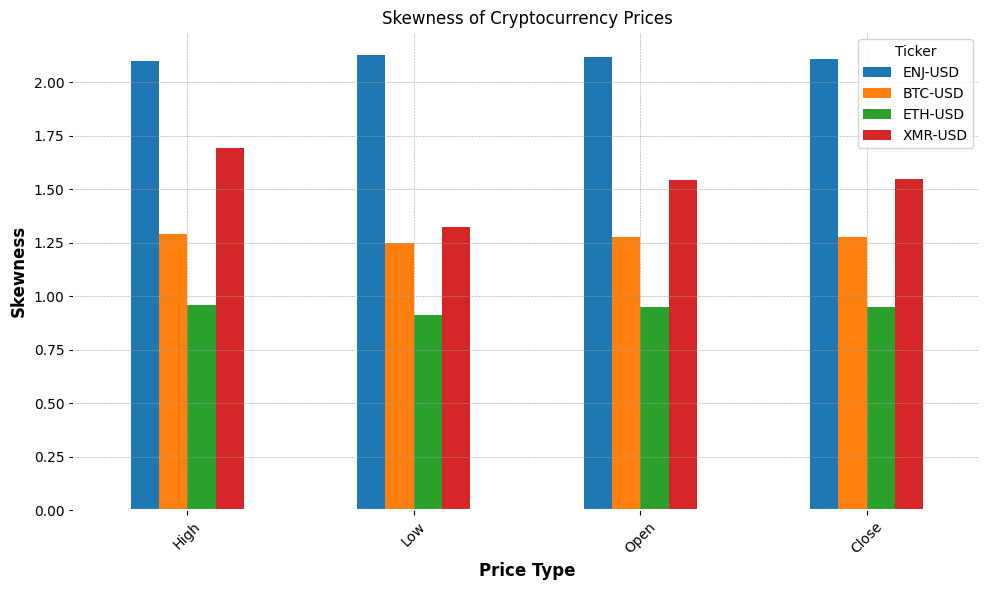

In [38]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming `crypto_data` is your DataFrame containing the cryptocurrency data
# and it has 'Ticker', 'High', 'Low', 'Open', 'Close' columns among others

# Calculate skewness for each selected cryptocurrency and for each price type
skewness_data = {}
 # Example selection

for ticker in selected_cryptos:
    subset = crypto_data[crypto_data['Ticker'] == ticker]
    skewness = subset[['High', 'Low', 'Open', 'Close']].skew()
    skewness_data[ticker] = skewness

# Convert the skewness data into a DataFrame for easier plotting
skewness_df = pd.DataFrame(skewness_data)

# Plotting
skewness_df.plot(kind='bar', figsize=(10, 6))
plt.title('Skewness of Cryptocurrency Prices')
plt.xlabel('Price Type')
plt.ylabel('Skewness')
plt.xticks(rotation=45)
plt.legend(title='Ticker')
plt.tight_layout()
plt.show()


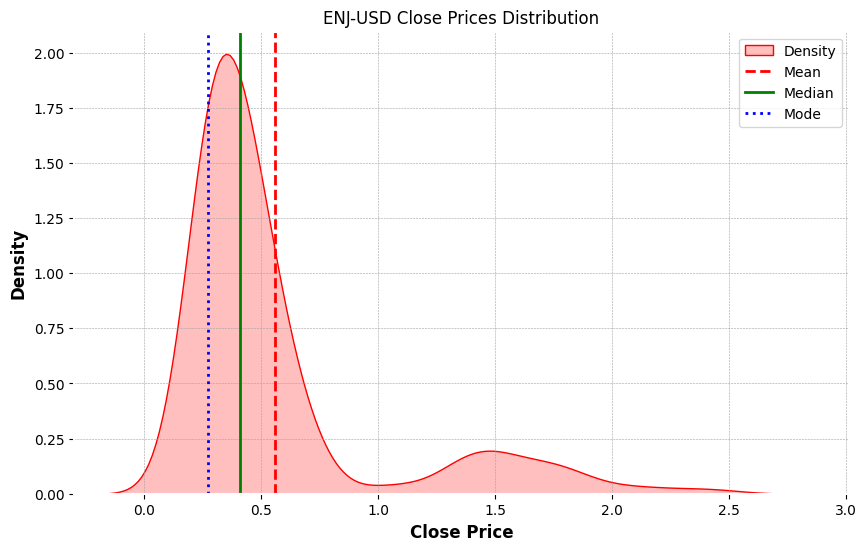

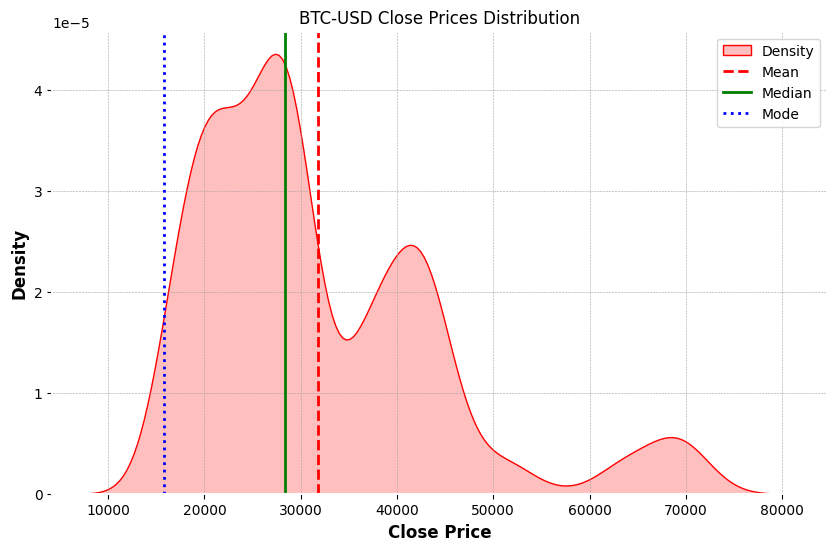

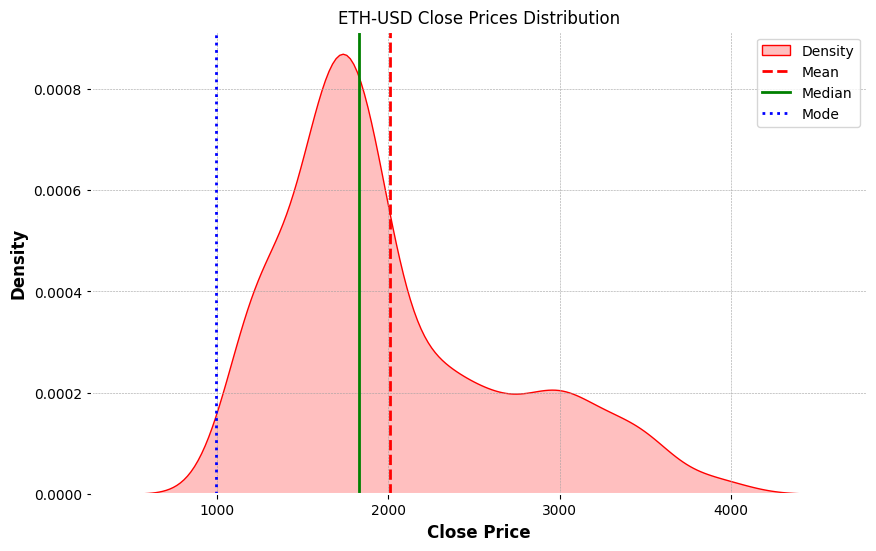

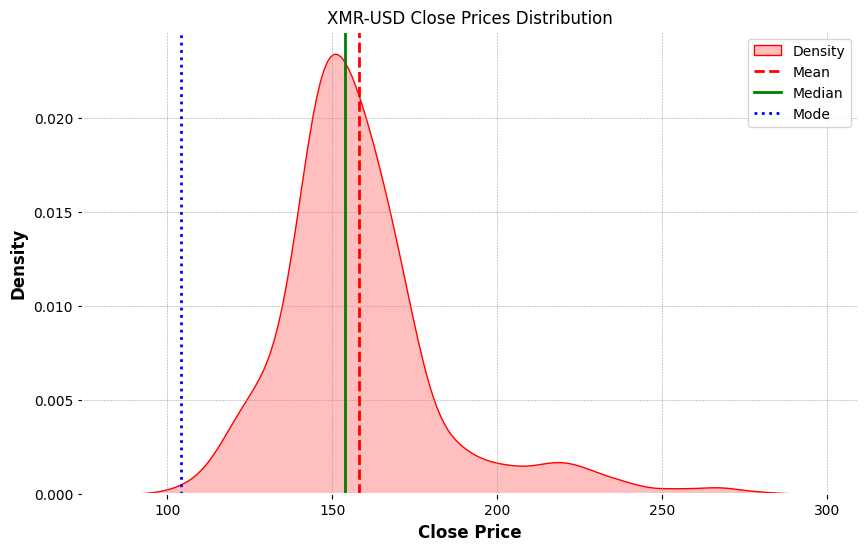

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Assuming `crypto_data` is your DataFrame and it contains the cryptocurrencies of interest
# and 'Close' price is what we're plotting the KDE for



# Create a KDE plot for each selected cryptocurrency
for ticker in selected_cryptos:
    # Extract the 'Close' prices for the current cryptocurrency
    data = crypto_data[crypto_data['Ticker'] == ticker]['Close']
    mean = data.mean()
    median = data.median()
    mode = data.mode()[0]  # Taking the first mode

    plt.figure(figsize=(10, 6))
    sns.kdeplot(data, fill=True, color="r", label="Density")
    plt.axvline(mean, color='r', linestyle='--', label='Mean')
    plt.axvline(median, color='g', linestyle='-', label='Median')
    plt.axvline(mode, color='b', linestyle=':', label='Mode')
    plt.legend()
    plt.title(f'{ticker} Close Prices Distribution')
    plt.xlabel('Close Price')
    plt.ylabel('Density')
    plt.show()


Feature Selection


In [40]:
selected_cryptos_full.head()


,Ticker,Cluster,Date,Open,High,Low,Close,Adj Close,Volume,Daily Return,Month
0,ENJ-USD,0,2022-01-13,2.522788,2.590010,2.372347,2.372347,2.372347,260090064,NaN,2022-01
1,ENJ-USD,0,2022-01-14,2.372986,2.454300,2.324881,2.411379,2.411379,192615750,0.016453,2022-01
2,ENJ-USD,0,2022-01-15,2.411643,2.535141,2.370439,2.459670,2.459670,169239989,0.020026,2022-01
3,ENJ-USD,0,2022-01-16,2.459674,2.534671,2.445021,2.506869,2.506869,162373293,0.019189,2022-01
4,ENJ-USD,0,2022-01-17,2.507101,2.533339,2.293065,2.325544,2.325544,168043737,-0.072331,2022-01


In [41]:
# save the selcted cryptos to a csv file
selected_cryptos_full.to_csv('selected_cryptos.csv', index=False)


In [42]:
# # Drop non-numeric columns and the target variable 'Close' from the feature matrix
# X = selected_cryptos_full.drop(['Date','Ticker',  'Adj Close', 'Close', 'Month'], axis=1)
# 
# # Set 'Close' as the target variable
# y = selected_cryptos_full['Close']
# 
# # Handling any NaN values in features and target. Adjust as necessary.
# X.fillna(method='ffill', inplace=True)
# y.fillna(method='ffill', inplace=True)
# 
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.feature_selection import SelectFromModel
# 
# # Initialize the model
# model = RandomForestRegressor(n_estimators=100, random_state=42)
# 
# # Fit the model on your data
# model.fit(X, y)
# 
# # Use SelectFromModel to select features based on importance
# sfm = SelectFromModel(model, threshold='mean')  # Selecting features with importance greater than the mean importance
# 
# # Fit the selector to your data
# sfm.fit(X, y)
# 
# # Transform the dataset to reduce to the selected features
# X_transformed = sfm.transform(X)
# 
# # X_transformed now contains the reduced set of features based on their importance


In [43]:

# selected_features_mask = sfm.get_support()
# 
# # Get the names of the selected features from X
# selected_features_names = X.columns[selected_features_mask]
# 
# print("Selected Features:")
# print(selected_features_names)


In [44]:
# from sklearn.feature_selection import RFE
# 
# # Create a random forest regressor model
# model = RandomForestRegressor(n_estimators=100, random_state=42)
# 
# # Create the RFE model and select a subset of features, e.g., the top 10
# rfe = RFE(estimator=model, n_features_to_select=10, step=1)
# 
# # Fit the RFE model on the dataset
# rfe.fit(X, y)
# 
# # Check which features are selected by RFE
# selected_features_mask = rfe.support_
# 
# # Get the names of the selected features from X
# selected_features_names = X.columns[selected_features_mask]
# 
# print("Selected Features by RFE:")
# print(selected_features_names)

### plotting the recursive feature elimination

In [45]:
# # Create the model instance
# model = RandomForestRegressor(n_estimators=100, random_state=42)
# 
# # Fit the model with your data
# model.fit(X, y)
# 
# # plot the feature importance
# importances = model.feature_importances_
# 
# # Using the rfe.support_ attribute to select the indices of the features selected by RFE
# selected_indices = [i for i, x in enumerate(rfe.support_) if x] 
# 
# # Filter the importances and the feature names based on the selected indices
# selected_importances = importances[selected_indices]
# selected_features = [X.columns[i] for i in selected_indices]
# 
# # Sort the features by their importances
# sorted_indices = selected_importances.argsort()
# sorted_features = [selected_features[i] for i in sorted_indices]
# sorted_importances = selected_importances[sorted_indices]
# 
# # Plotting
# plt.figure(figsize=(10, 6))
# plt.title("Feature Importances from RFE")
# plt.barh(range(len(sorted_features)), sorted_importances, color='skyblue', align='center')
# plt.yticks(range(len(sorted_features)), sorted_features)
# plt.xlabel("Relative Importance")
# plt.show()

### Feature Importance Analysis from RFE

The bar chart illustrates the relative importance of features selected through Recursive Feature Elimination (RFE) using a RandomForestRegressor. Below are key observations:

1. **High Price Feature**: This is the most significant predictor, indicating the highest price of the day is a strong indicator of the closing price.

2. **Low Price Feature**: Nearly as important as the 'High' feature, it suggests the lowest price of the day also significantly impacts the closing price.

3. **Open Price Feature**: Less important than 'High' and 'Low', but still influential, this feature indicates that the opening price has some predictive power over the closing price.

4. **Daily Return Feature**: Shows the least importance among the price-related features, suggesting that the intraday price change may not be as critical for predicting the closing price.

5. **Volume Feature**: Demonstrates moderate importance, which could mean that the total trading volume — reflecting market activity and liquidity — influences the closing price.

6. **Cluster Feature**: Exhibits the least relative importance, hinting that the cluster a cryptocurrency is assigned to, based on its price movements and characteristics, may not be directly influential on the closing price.




## ML MODELS FOR PREDICTION AND FORECSTING

In [46]:
selected_cryptos = selected_cryptos_full['Ticker'].unique()
selected_cryptos

array(['ENJ-USD', 'BTC-USD', 'ETH-USD', 'XMR-USD'], dtype=object)

In [47]:
# check if the data is stationary
from statsmodels.tsa.stattools import adfuller

# Define a function to check stationarity
def check_stationarity(data):
    result = adfuller(data)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')
        
# Check stationarity for the closing prices of the selected cryptocurrencies

for ticker in selected_cryptos:
    # Filter the data for the current cryptocurrency
    crypto_subset = crypto_data[crypto_data['Ticker'] == ticker]
    
    # Extract the 'Close' prices for the current cryptocurrency
    ts = crypto_subset['Close']
    
    print(f"Stationarity Test for {ticker}:")
    check_stationarity(ts)
    print("\n")
    
    


Stationarity Test for ENJ-USD:
ADF Statistic: -3.4181541901041443
p-value: 0.01035534699796774
Critical Values:
	1%: -3.4385197724757233
	5%: -2.8651460209504114
	10%: -2.5686901720199313


Stationarity Test for BTC-USD:
ADF Statistic: -2.483958738844935
p-value: 0.11942628134182842
Critical Values:
	1%: -3.433025183119799
	5%: -2.8627218704409065
	10%: -2.56739915730946


Stationarity Test for ETH-USD:
ADF Statistic: -2.018945971153884
p-value: 0.27832822944070945
Critical Values:
	1%: -3.438340089700066
	5%: -2.8650668167215243
	10%: -2.568647979826153


Stationarity Test for XMR-USD:
ADF Statistic: -3.8085930592929285
p-value: 0.0028206102835017953
Critical Values:
	1%: -3.4383303387882793
	5%: -2.8650625183820577
	10%: -2.5686456901154977




In [48]:
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import adfuller

for ticker in selected_cryptos:
    crypto_subset = crypto_data[crypto_data['Ticker'] == ticker]
    
    # Step 1: Check and handle NaN and Inf values
    crypto_subset.replace([np.inf, -np.inf], np.nan, inplace=True)
    crypto_subset.dropna(inplace=True)
    
    # Step 2: Check that all 'Close' values are positive
    assert (crypto_subset['Close'] > 0).all(), f"Non-positive values found for {ticker}"
    
    # Step 3: Apply log transformation
    crypto_subset['Close_log'] = np.log(crypto_subset['Close'])
    
    # Step 4: Apply differencing and drop NaN values
    crypto_subset['Close_log_diff'] = crypto_subset['Close_log'].diff()
    crypto_subset.dropna(inplace=True)
    
    # Step 5: Perform the ADF test on the differenced log data
    adf_result = adfuller(crypto_subset['Close_log_diff'])
    
    print(f"Stationarity Test for {ticker}:")
    print('ADF Statistic:', adf_result[0])
    print('p-value:', adf_result[1])
    print('Critical Values:')
    for key, value in adf_result[4].items():
        print(f'\t{key}: {value}')


Stationarity Test for ENJ-USD:
ADF Statistic: -8.934734471768282
p-value: 9.602266105740966e-15
Critical Values:
	1%: -3.438399099271788
	5%: -2.8650928286782857
	10%: -2.568661836350634


C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\3386713336.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\3386713336.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\3386713336.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\dagbo_b4

Stationarity Test for BTC-USD:
ADF Statistic: -9.730680103659047
p-value: 9.022050435621941e-17
Critical Values:
	1%: -3.4330229961087557
	5%: -2.8627209046733073
	10%: -2.5673986431191405
Stationarity Test for ETH-USD:
ADF Statistic: -15.109989337133515
p-value: 7.72095166499658e-28
Critical Values:
	1%: -3.438340089700066
	5%: -2.8650668167215243
	10%: -2.568647979826153
Stationarity Test for XMR-USD:
ADF Statistic: -33.37018935089666
p-value: 0.0
Critical Values:
	1%: -3.438320611647225
	5%: -2.8650582305072954
	10%: -2.568643405981436


C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\3386713336.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### 1. PROPHET MODEL

16:01:42 - cmdstanpy - INFO - Chain [1] start processing
16:01:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



             ds      yhat  yhat_lower  yhat_upper
0    2022-01-13  1.998582    1.867425    2.131751
1    2022-01-14  1.985173    1.846554    2.116774
2    2022-01-15  1.978996    1.846361    2.113139
3    2022-01-16  1.968759    1.831114    2.095918
4    2022-01-17  1.954390    1.829033    2.093768
...         ...       ...         ...         ...
1020 2024-10-29  0.293176    0.085601    0.492717
1021 2024-10-30  0.292683    0.078037    0.497043
1022 2024-10-31  0.291391    0.085217    0.505838
1023 2024-11-01  0.285872    0.071894    0.488757
1024 2024-11-02  0.287222    0.081711    0.496466

[1025 rows x 4 columns]


C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



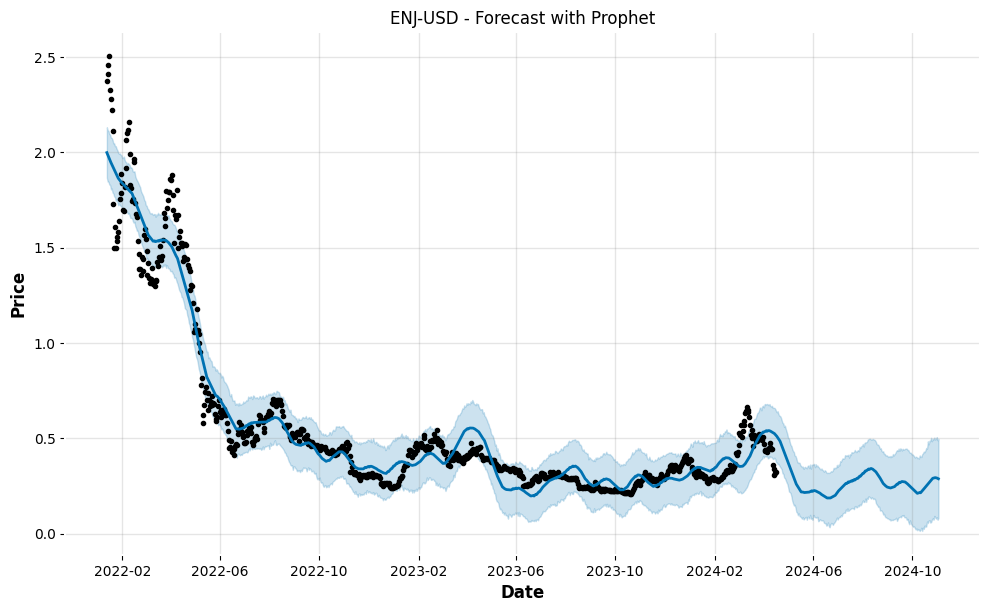

16:01:43 - cmdstanpy - INFO - Chain [1] start processing
16:01:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



             ds          yhat    yhat_lower     yhat_upper
0    2022-01-13  42589.293249  40040.690820   44945.818090
1    2022-01-14  42137.547321  39823.400010   44582.475791
2    2022-01-15  41700.567622  39297.369557   44136.769803
3    2022-01-16  41436.489834  39018.964925   43911.110892
4    2022-01-17  41247.804737  38742.991239   43669.093506
...         ...           ...           ...            ...
1020 2024-10-29  86559.529525  48902.186577  120870.490435
1021 2024-10-30  86986.220583  48876.135403  122109.345448
1022 2024-10-31  87013.460597  49963.132053  121792.813376
1023 2024-11-01  87074.035663  48838.401029  122671.493600
1024 2024-11-02  87116.257800  48866.081535  123643.381870

[1025 rows x 4 columns]


C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



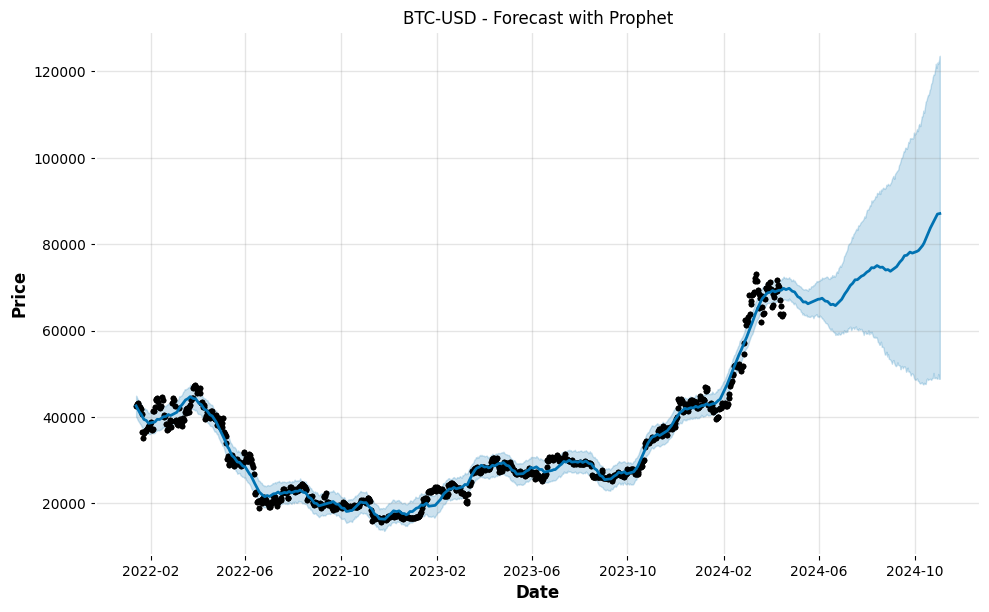

16:01:45 - cmdstanpy - INFO - Chain [1] start processing
16:01:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



             ds         yhat   yhat_lower   yhat_upper
0    2022-01-13  2985.876474  2728.107565  3261.502494
1    2022-01-14  2972.594623  2708.600028  3222.085834
2    2022-01-15  2958.239218  2695.660520  3219.641033
3    2022-01-16  2952.570067  2678.212355  3202.164275
4    2022-01-17  2944.278816  2681.623535  3205.355698
...         ...          ...          ...          ...
1020 2024-10-29  4103.178941  3692.564276  4519.408136
1021 2024-10-30  4124.356217  3715.207094  4577.215338
1022 2024-10-31  4126.682957  3737.098827  4565.606603
1023 2024-11-01  4125.454146  3689.074493  4561.405878
1024 2024-11-02  4122.594772  3701.845057  4570.146274

[1025 rows x 4 columns]


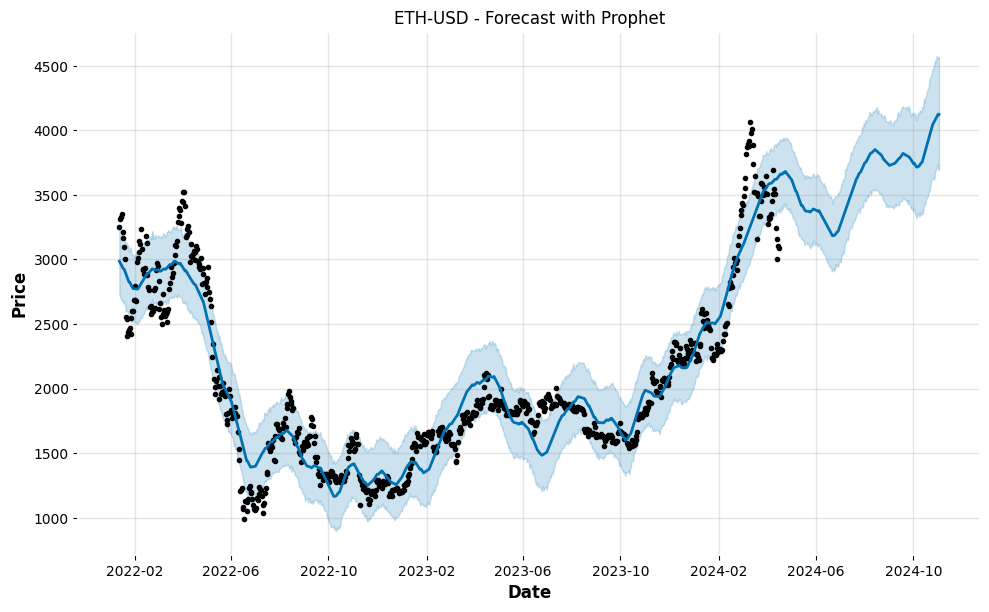

16:01:46 - cmdstanpy - INFO - Chain [1] start processing
16:01:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



             ds        yhat  yhat_lower  yhat_upper
0    2022-01-13  179.888323  162.178591  197.699336
1    2022-01-14  180.250867  161.983963  198.016322
2    2022-01-15  180.984240  163.911260  199.998066
3    2022-01-16  182.277846  164.177867  200.507524
4    2022-01-17  182.092869  165.147188  200.327551
...         ...         ...         ...         ...
1020 2024-10-29   42.872589    8.054507   78.912030
1021 2024-10-30   42.852658    7.100134   81.406151
1022 2024-10-31   42.161593    8.481314   75.683204
1023 2024-11-01   41.260850    6.229255   78.289675
1024 2024-11-02   40.700982    4.922572   77.016254

[1025 rows x 4 columns]


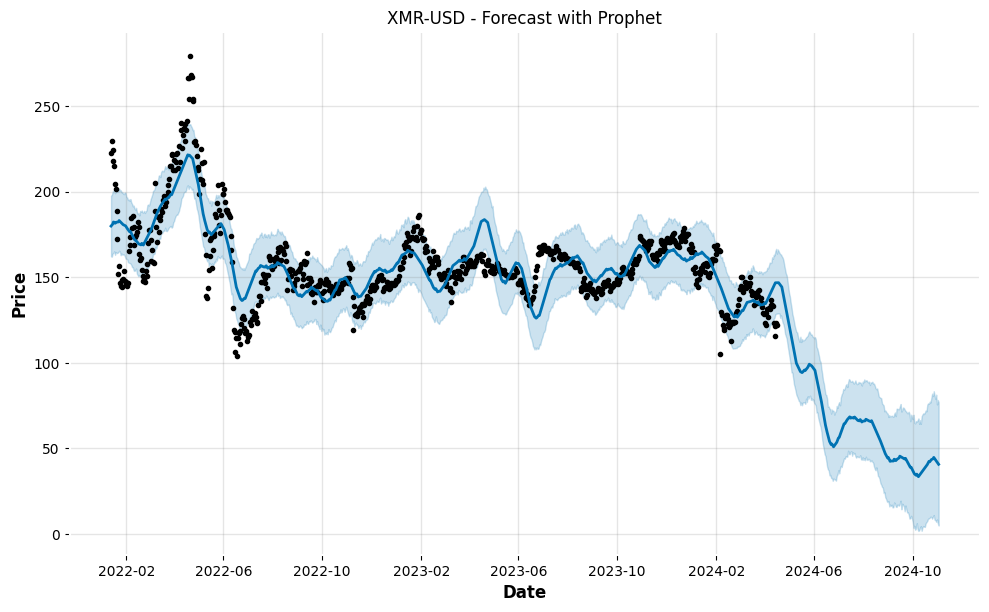

In [49]:
from prophet import Prophet
import pandas as pd
import matplotlib.pyplot as plt

# Dictionary to store the trained models for each cryptocurrency
trained_prophet_models = {}

for ticker in selected_cryptos:
    # Filter the data for the current cryptocurrency
    crypto_subset = crypto_data[crypto_data['Ticker'] == ticker]
    
    # Reset index to make 'Date' a column and not an index
    crypto_subset = crypto_subset.reset_index()

    # Prepare the data for Prophet
    df_prophet = crypto_subset[['Date', 'Close']].rename(columns={'Date': 'ds', 'Close': 'y'})
    
    # Initialize the Prophet model
    prophet_model = Prophet(daily_seasonality=True)
    
    # Fit the model with your dataframe
    prophet_model.fit(df_prophet)
    
    # Store the model in the dictionary
    trained_prophet_models[ticker] = prophet_model
    
    # Define the period for which we want a prediction, 100 days into the future in this case
    future = prophet_model.make_future_dataframe(periods=200)
    
    # Use the model to make a forecast
    forecast = prophet_model.predict(future)
    
   # Print the forecasted 'yhat' values
    print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])
    
    # Plot the forecast
    fig = prophet_model.plot(forecast)
    plt.title(f'{ticker} - Forecast with Prophet')
    plt.xlabel('Date')
    plt.ylabel('Price')
    
    plt.show()


In [50]:
# After running model.predict(future) as you did to generate the plot...
forecasted_values = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

# Get the last known date from your historical data
last_known_date = df_prophet['ds'].max()

# Filter the forecasted_values for dates after the last known date
future_forecast = forecasted_values[forecasted_values['ds'] > last_known_date]

# Print the future forecast
print(future_forecast)


             ds        yhat  yhat_lower  yhat_upper
825  2024-04-17  146.967659  128.803292  166.256398
826  2024-04-18  146.802208  128.860448  165.301859
827  2024-04-19  146.288796  128.828641  164.292636
828  2024-04-20  145.948461  126.331531  163.477417
829  2024-04-21  145.962597  127.761451  163.268206
...         ...         ...         ...         ...
1020 2024-10-29   42.872589    8.054507   78.912030
1021 2024-10-30   42.852658    7.100134   81.406151
1022 2024-10-31   42.161593    8.481314   75.683204
1023 2024-11-01   41.260850    6.229255   78.289675
1024 2024-11-02   40.700982    4.922572   77.016254

[200 rows x 4 columns]


In [51]:
# evalauting prophet model
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics

# Perform cross-validation
df_cv = cross_validation(prophet_model, initial='400 days', period='180 days', horizon='365 days')

# Compute performance metrics
df_p = performance_metrics(df_cv)

# Display the performance metrics
print(df_p)

  0%|          | 0/1 [00:00<?, ?it/s]

16:01:47 - cmdstanpy - INFO - Chain [1] start processing
16:01:47 - cmdstanpy - INFO - Chain [1] done processing


     horizon           mse        rmse         mae      mape     mdape  \
0    36 days   1900.882173   43.599107   37.634958  0.245603  0.216601   
1    37 days   1982.889514   44.529648   38.686311  0.252899  0.244527   
2    38 days   2050.437513   45.281757   39.459063  0.258081  0.270085   
3    39 days   2113.581572   45.973705   40.206198  0.263146  0.297985   
4    40 days   2171.061283   46.594649   40.883440  0.267617  0.327390   
..       ...           ...         ...         ...       ...       ...   
325 361 days  38098.505430  195.188384  194.678613  1.425612  1.442475   
326 362 days  37419.835825  193.442074  192.855344  1.421155  1.441127   
327 363 days  36829.953907  191.911318  191.265943  1.415667  1.440121   
328 364 days  36235.639860  190.356612  189.674159  1.410473  1.439391   
329 365 days  35639.827519  188.785136  188.059519  1.405057  1.437362   

        smape  coverage  
0    0.289974  0.194444  
1    0.300034  0.194444  
2    0.308186  0.194444  
3    0.

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:546: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:547: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



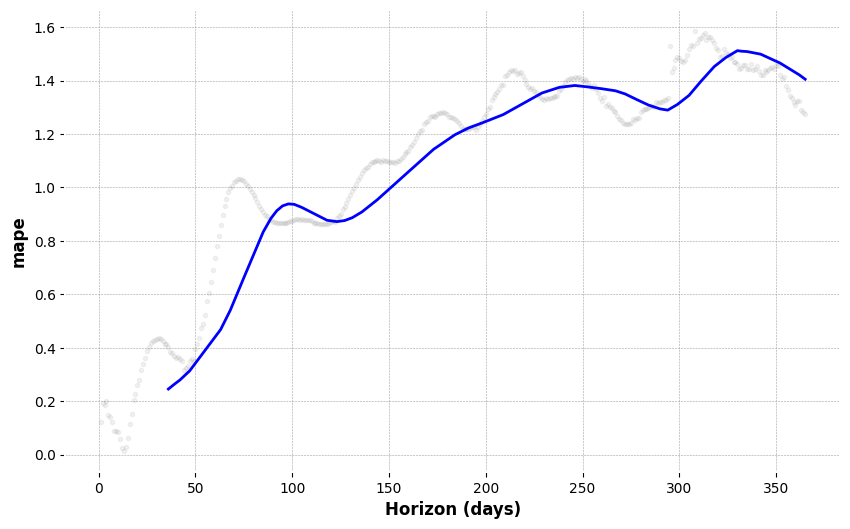

In [52]:
# Plot the performance metrics
from prophet.plot import plot_cross_validation_metric

plot_cross_validation_metric(df_cv, metric='mape')
plt.show()



### The Mean Absolute Percentage Error (MAPE) is a common metric used to evaluate the accuracy of time series forecasts. It measures the average absolute percentage difference between the predicted and actual values. A lower MAPE indicates a more accurate forecast.

16:01:48 - cmdstanpy - INFO - Chain [1] start processing
16:01:48 - cmdstanpy - INFO - Chain [1] done processing


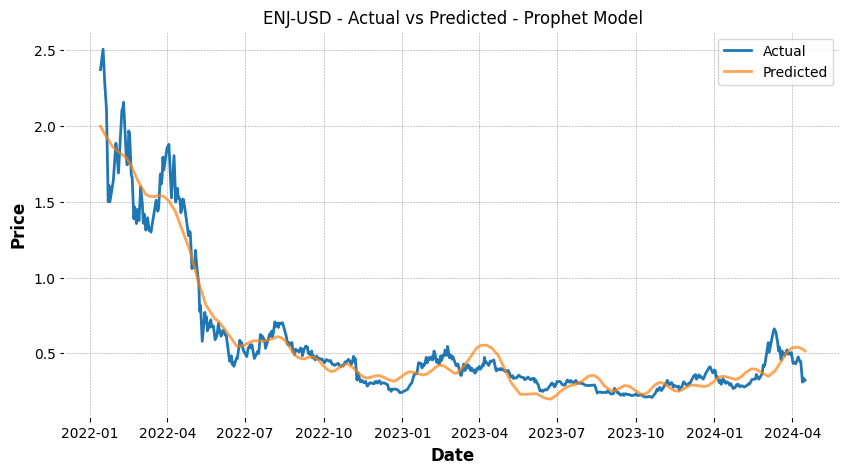

16:01:49 - cmdstanpy - INFO - Chain [1] start processing
16:01:50 - cmdstanpy - INFO - Chain [1] done processing


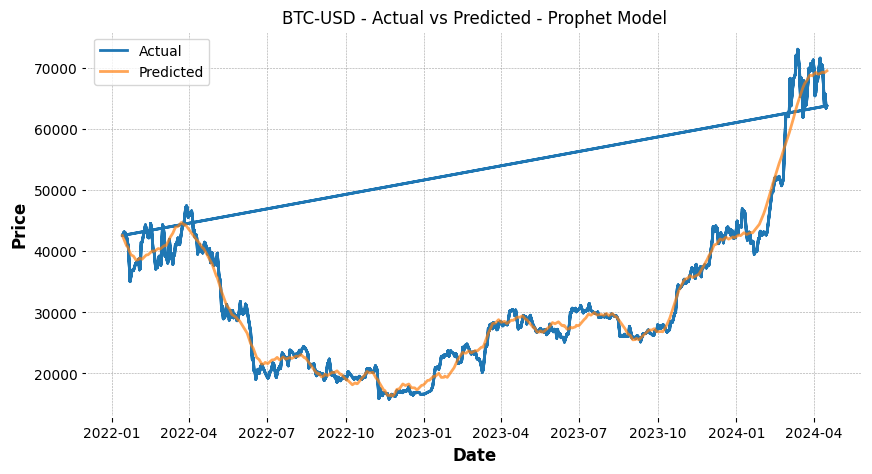

16:01:51 - cmdstanpy - INFO - Chain [1] start processing
16:01:51 - cmdstanpy - INFO - Chain [1] done processing


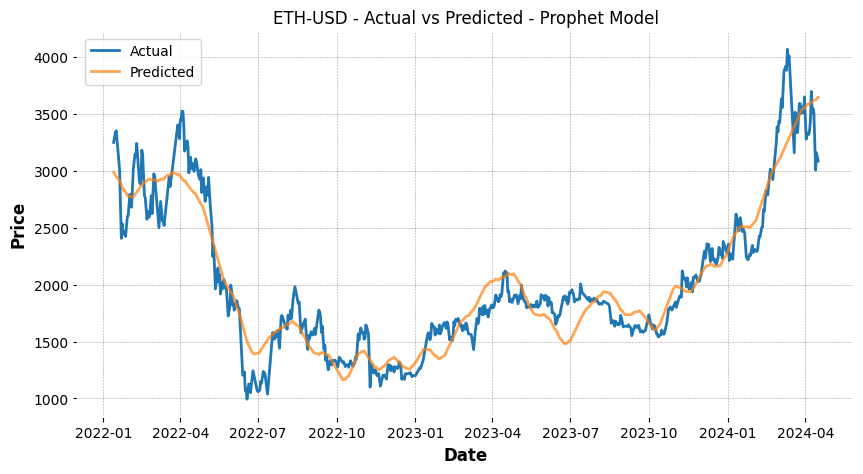

16:01:52 - cmdstanpy - INFO - Chain [1] start processing
16:01:52 - cmdstanpy - INFO - Chain [1] done processing


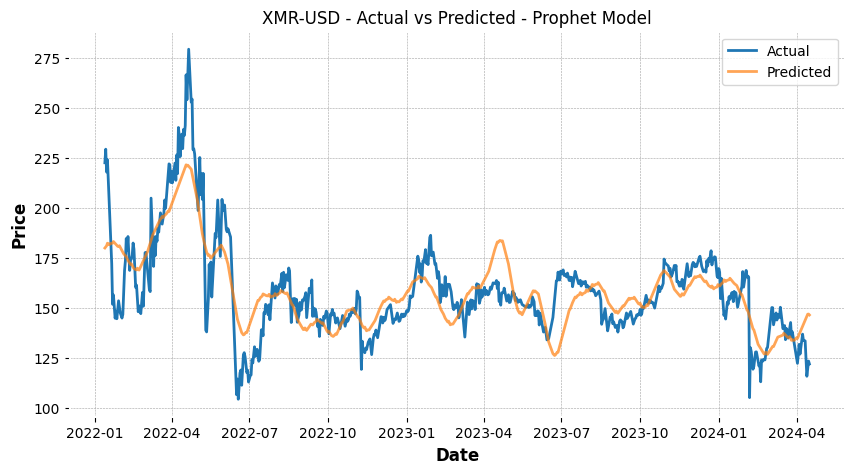

Metrics for Prophet Model:
MSE: 204.02117752045018
MAE: 11.011192495564055
RMSE: 14.283598199349147
R-squared: 0.657447989830929
{}


In [53]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Dictionary to hold metrics for all tickers
all_metrics = {}

for ticker in selected_cryptos:
    # Filter and prepare data specific to the current ticker
    crypto_subset = crypto_data[crypto_data['Ticker'] == ticker]
    crypto_subset = crypto_subset.reset_index()
    df_prophet = crypto_subset[['Date', 'Close']].rename(columns={'Date': 'ds', 'Close': 'y'})

    # Initialize and fit the Prophet model
    prophet_model = Prophet(daily_seasonality=True)
    prophet_model.fit(df_prophet)

    # Make future dataframe and predict
    future = prophet_model.make_future_dataframe(periods=200)
    forecast = prophet_model.predict(future)

    # Get the last known date from your historical data
    last_known_date = df_prophet['ds'].max()

    # Filter forecasted data for historical part only
    historical_forecast = forecast[forecast['ds'] <= last_known_date]
    actuals = df_prophet[df_prophet['ds'] <= last_known_date]['y']

    # # Calculate metrics
    # mse = mean_squared_error(actuals, historical_forecast['yhat'])
    # mae = mean_absolute_error(actuals, historical_forecast['yhat'])
    # rmse = np.sqrt(mse)
    # r_squared = r2_score(actuals, historical_forecast['yhat'])
    # 
    # # Store metrics in a dictionary
    # all_metrics[ticker] = {
    #     'MSE': mse,
    #     'MAE': mae,
    #     'RMSE': rmse,
    #     'R-squared': r_squared
    # }

    # # Output results
    # print(f"Metrics for {ticker} - Prophet Model:")
    # print(f"MSE: {mse}, MAE: {mae}, RMSE: {rmse}, R-squared: {r_squared}\n")

    # Plot actual vs predicted
    plt.figure(figsize=(10, 5))
    plt.plot(df_prophet[df_prophet['ds'] <= last_known_date]['ds'], actuals, label='Actual')
    plt.plot(historical_forecast['ds'], historical_forecast['yhat'], label='Predicted', alpha=0.7)
    plt.title(f'{ticker} - Actual vs Predicted - Prophet Model')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

# If needed, access all_metrics to see metrics across tickers
historical_forecast = forecast[forecast['ds'] <= last_known_date]

# Extract the actual 'y' values from the original Prophet DataFrame
actuals = df_prophet[df_prophet['ds'] <= last_known_date]['y']

# Calculate metrics
mse = mean_squared_error(actuals, historical_forecast['yhat'])
mae = mean_absolute_error(actuals, historical_forecast['yhat'])
rmse = np.sqrt(mse)
r_squared = r2_score(actuals, historical_forecast['yhat'])

# Store the metrics
prophet_metrics = {
    'MSE': mse,
    'MAE': mae,
    'RMSE': rmse,
    'R-squared': r_squared
}

# Output the results
print("Metrics for Prophet Model:")
print(f"MSE: {prophet_metrics['MSE']}")
print(f"MAE: {prophet_metrics['MAE']}")
print(f"RMSE: {prophet_metrics['RMSE']}")
print(f"R-squared: {prophet_metrics['R-squared']}")
print(all_metrics)


### 2. XGBoost Model
###### XGBoost is an efficient and scalable machine learning algorithm that is widely used for regression and classification tasks. It is known for its high performance and ability to capture complex patterns in the data. In this section, we will use XGBoost to predict the closing prices of cryptocurrencies based on historical data.


#### Feature Engineering for XGBoost

In [54]:
 # xgboost model is a popular choice for time series forecasting due to its ability to capture complex patterns and relationships in the data.

# import the necessary libraries
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# #feature engineering for xgboost to capture the time series nature of the data
# crypto_data.index = pd.to_datetime(crypto_data.index)
# 
# # Feature engineering
# crypto_data['dayofweek'] = crypto_data.index.dayofweek
# crypto_data['dayofyear'] = crypto_data.index.dayofyear
# 
# # Lag features
# n_lags = 7
# for i in range(1, n_lags + 1):
#     crypto_data[f'lag_{i}'] = crypto_data['Close'].shift(i)
# 
# 
# 
# # Drop NaN values
# crypto_data.dropna(inplace=True)

# Display the first few rows of the data
crypto_data.head()



,Open,High,Low,Close,Adj Close,Volume,Ticker
Date,,,,,,,
2022-01-13,487.042572,488.211243,467.875610,475.029114,475.029114,4151007744,BNB-USD
2022-01-14,475.127197,491.660645,468.939606,489.867432,489.867432,3112235914,BNB-USD
2022-01-15,489.917999,501.311127,486.305908,494.988068,494.988068,1766015929,BNB-USD
2022-01-16,494.924103,505.300964,489.502136,498.427917,498.427917,1771927950,BNB-USD
2022-01-17,498.506165,498.943909,468.576508,475.709869,475.709869,2134608006,BNB-USD


### The feature engineering process for XGBoost involves creating lag features, rolling window statistics, and expanding window statistics to capture the time series nature of the data. These features help XGBoost model the historical price data, trends, and seasonality, enabling it to make accurate predictions based on the patterns in the data.

### Train-Test Split

In [55]:
# prepare the features and target variable
X = crypto_data.drop(['Close', 'Adj Close','Ticker'], axis=1, errors='ignore')
y = crypto_data['Close']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Display the shapes of the training and testing sets
print("Training set shape:", X_train.shape, y_train.shape)

print("Testing set shape:", X_test.shape, y_test.shape)


Training set shape: (28855, 4) (28855,)
Testing set shape: (7214, 4) (7214,)


In [56]:
from hyperopt import hp, fmin, tpe, Trials, STATUS_OK
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

def objective(params):
    # Make sure parameters that should be integers are integers
    params['max_depth'] = int(params['max_depth'])
    params['n_estimators'] = int(params['n_estimators'])
    
    xgb_model = XGBRegressor(**params)
    xgb_model.fit(X_train, y_train)
    y_pred = xgb_model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    return {'loss': mse, 'status': STATUS_OK}

param_space = {
    'max_depth': hp.quniform('max_depth', 3, 10, 1),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'n_estimators': hp.quniform('n_estimators', 100, 500, 50),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.3, 0.7),
    'alpha': hp.uniform('alpha', 0, 10),
}

trials = Trials()
best = fmin(fn=objective,
            space=param_space,
            algo=tpe.suggest,
            max_evals=100,
            trials=trials)

print("Best hyperparameters:", best)


100%|██████████| 100/100 [01:05<00:00,  1.52trial/s, best loss: 0.0026552714113490077]
Best hyperparameters: {'alpha': 1.7481758713719375, 'colsample_bytree': 0.682674294212662, 'learning_rate': 0.05087764197163858, 'max_depth': 10.0, 'n_estimators': 400.0}


In [57]:

from sklearn.metrics import mean_absolute_error, r2_score
# Initialize the XGBoost regressor with the best hyperparameters
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = best['colsample_bytree'], 
                          learning_rate = best['learning_rate'], max_depth = int(best['max_depth']),
                          alpha = best['alpha'], n_estimators = int(best['n_estimators']))

# Fit the model on the training data
xg_reg.fit(X_train, y_train)

# Predict the closing prices on the test set
y_pred = xg_reg.predict(X_test)

# evaluate the model using Mean Squared Error, Root Mean Squared Error, and Mean Absolute Error
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
rsquared = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("Mean Absolute Error:", mae)
print("R-squared:", rsquared)


Mean Squared Error: 0.0026552714113490077
Root Mean Squared Error: 0.051529325741261234
Mean Absolute Error: 0.02994329383309359
R-squared: 0.9920402917668618


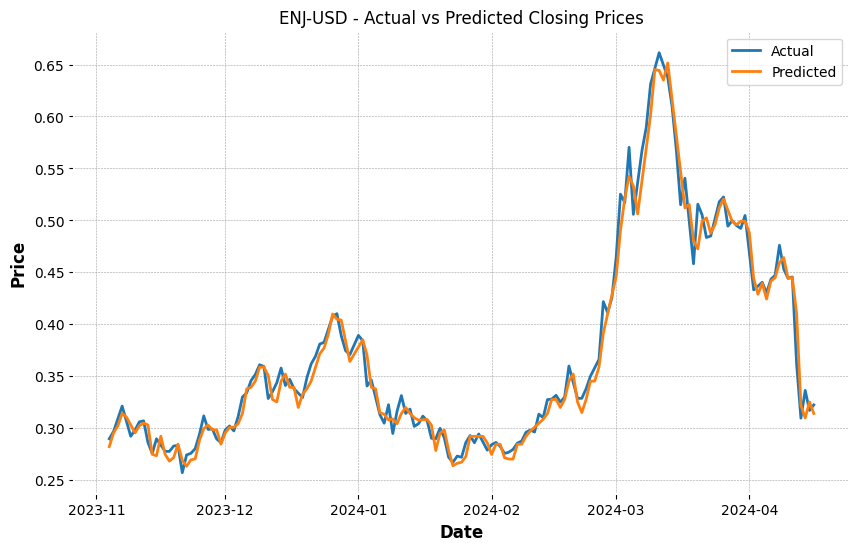

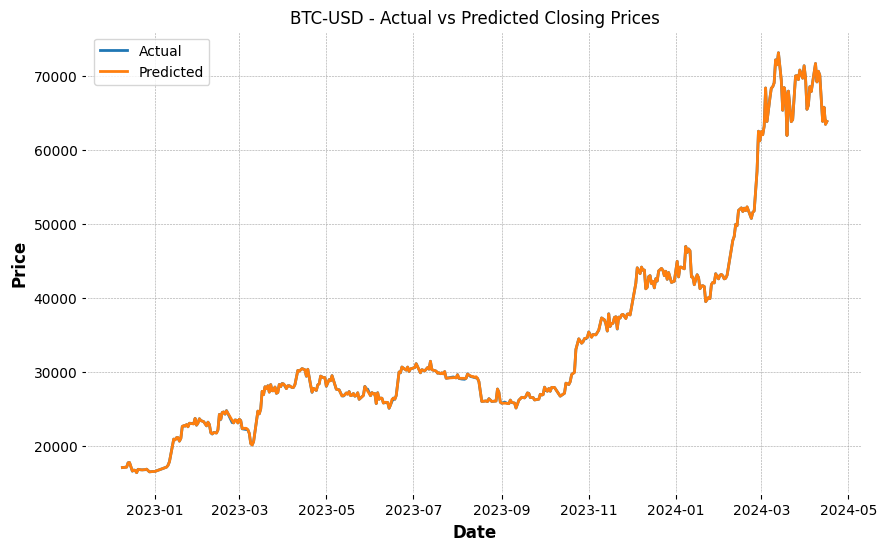

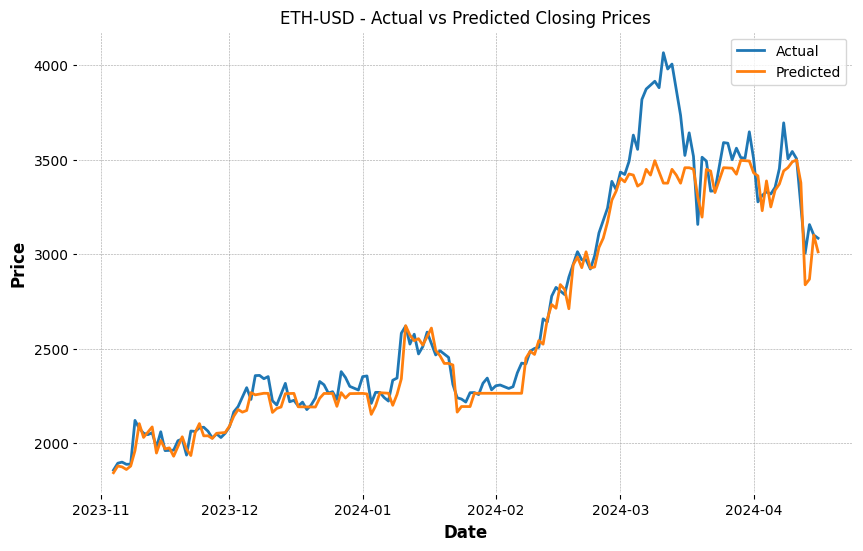

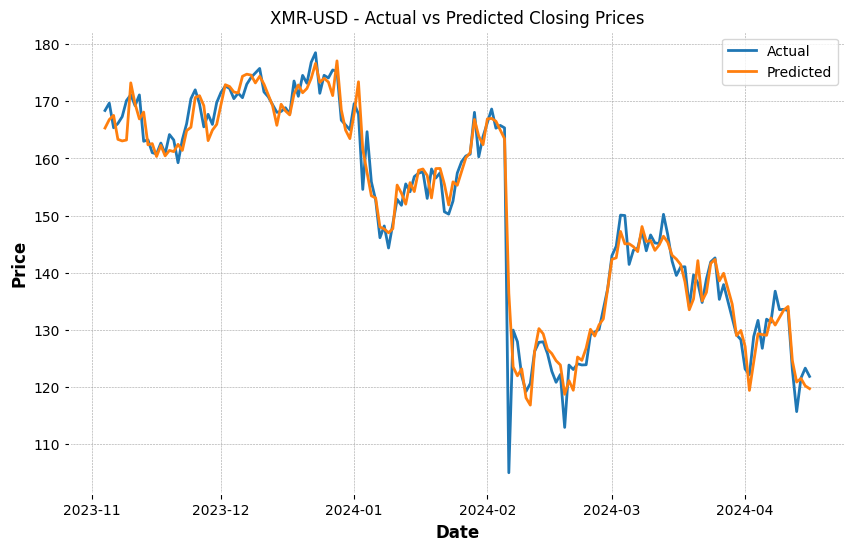

In [58]:
# Plot the actual vs predicted closing prices for the selected cryptocurrency
for ticker in selected_cryptos:
    # Filter the data for the current cryptocurrency
    crypto_subset = crypto_data[crypto_data['Ticker'] == ticker]
    
    #convert the index to datetime
    crypto_subset.index = pd.to_datetime(crypto_subset.index)
    

    # Prepare the data for XGBoost
    X = crypto_subset.drop(['Close', 'Adj Close', 'Ticker'], axis=1, errors='ignore')
    y = crypto_subset['Close']
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Initialize the XGBoost regressor
    xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = best['colsample_bytree'], 
                          learning_rate = best['learning_rate'], max_depth = int(best['max_depth']),
                          alpha = best['alpha'], n_estimators = int(best['n_estimators']))
    
    # Fit the model on the training data
    xg_reg.fit(X_train, y_train)
    
    # Predict the closing prices on the test set
    y_pred = xg_reg.predict(X_test)
    
    # Plot the actual vs predicted closing prices
    plt.figure(figsize=(10, 6))
    plt.plot(y_test.index, y_test, label='Actual')
    plt.plot(y_test.index, y_pred, label='Predicted')
    plt.title(f'{ticker} - Actual vs Predicted Closing Prices')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()


In [59]:
crypto_data.head()

,Open,High,Low,Close,Adj Close,Volume,Ticker
Date,,,,,,,
2022-01-13,487.042572,488.211243,467.875610,475.029114,475.029114,4151007744,BNB-USD
2022-01-14,475.127197,491.660645,468.939606,489.867432,489.867432,3112235914,BNB-USD
2022-01-15,489.917999,501.311127,486.305908,494.988068,494.988068,1766015929,BNB-USD
2022-01-16,494.924103,505.300964,489.502136,498.427917,498.427917,1771927950,BNB-USD
2022-01-17,498.506165,498.943909,468.576508,475.709869,475.709869,2134608006,BNB-USD


In [60]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Dictionary to store evaluation metrics for each cryptocurrency
xgboost_metrics = {}

for ticker in selected_cryptos:
    # Assuming the tuple order is (X_train, X_test, y_train, y_test)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    # Initialize the XGBoost regressor with the best hyperparameters
    xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = best['colsample_bytree'], 
                          learning_rate = best['learning_rate'], max_depth = int(best['max_depth']),
                          alpha = best['alpha'], n_estimators = int(best['n_estimators']))

    # Fit the model on the training data for the current ticker
    xg_reg.fit(X_train, y_train)

   # Predict the closing prices on the test set
    y_pred = xg_reg.predict(X_test)
    
    
# Calculate evaluation metrics
# evaluate the model using Mean Squared Error, Root Mean Squared Error, and Mean Absolute Error
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
rsquared = r2_score(y_test, y_pred)
    
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("Mean Absolute Error:", mae)
print("R-squared:", rsquared)


Mean Squared Error: 12.98244426506889
Root Mean Squared Error: 3.603115910579188
Mean Absolute Error: 2.284879603530421
R-squared: 0.9609704696024673


### 3. Arima Model now that the data is stationary

In [61]:
# from statsmodels.tsa.statespace.sarimax import SARIMAX
# from sklearn.metrics import mean_squared_error
# import pandas as pd
# import itertools
# import warnings
# import pickle
# 
# # Ignoring warnings for cleaner output (be careful with this in practice)
# warnings.filterwarnings("ignore")
# 
# # Define the d, p, q parameters to take values between 0 and 2, and seasonal P, D, Q
# p = d = q = range(0, 3)
# seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
# 
# # Define a DataFrame to store the results
# results_df = pd.DataFrame(columns=['pdq', 'seasonal_pdq', 'AIC'])
# 
# # Grid search for the optimal SARIMA parameters
# best_aic = float("inf")
# best_pdq = best_seasonal_pdq = None
# best_model = None
# 
# for param in itertools.product(p, d, q):
#     for seasonal_param in seasonal_pdq:
#         try:
#             model = SARIMAX(crypto_data['Close'],
#                             order=param,
#                             seasonal_order=seasonal_param,
#                             enforce_stationarity=False,
#                             enforce_invertibility=False)
# 
#             results = model.fit()
# 
#             # Compare this model's AIC to the best so far
#             if results.aic < best_aic:
#                 best_aic = results.aic
#                 best_pdq = param
#                 best_seasonal_pdq = seasonal_param
#                 best_model = results
# 
#             # Append results to the DataFrame
#             results_df = results_df.append({
#                 'pdq': param,
#                 'seasonal_pdq': seasonal_param,
#                 'AIC': results.aic
#             }, ignore_index=True)
# 
#         except Exception as e:
#             continue
# 
# # Output the best model information
# print(f'Best SARIMA{best_pdq}x{best_seasonal_pdq} model AIC = {best_aic}')
# results_df.to_csv('sarima_grid_search_results.csv')
# 
# # Save the best model to disk
# #with open('best_sarima_model.pkl', 'wb') as pkl:
#     #pickle.dump(best_model, pkl)


In [62]:
# # Forecasting without actual future values for the selected cryptocurrencies
# for ticker in selected_cryptos:
#     # Filter the data for the current cryptocurrency
#     crypto_subset = crypto_data[crypto_data['Ticker'] == ticker]
#     
#     start_date_hist = '202-01-01'  # Start date for the historical data
#     end_date_forecast = '2022-01-01'  # Start date for the forecast data
#     ts = crypto_subset[(crypto_subset.index >= start_date_hist) & (crypto_subset.index < end_date_forecast)]['Close']
# 
#     
#     # Fit the best ARIMA model
#     model = ARIMA(ts, order=best_pdq)
#     model_fit = model.fit()
#     
#     # Forecast the future values
#     forecast = model_fit.forecast(steps=10)
#     
#     #plot the forecast
#     plt.figure(figsize=(12, 6))
#     plt.plot(ts.index, ts, label='Historical')
#     plt.plot(pd.date_range(start=ts.index[-1], periods=10, freq='D'), forecast, label='Forecast')
#     plt.title(f'{ticker} - ARIMA Forecast')
#     plt.xlabel('Date')
#     plt.ylabel('Price')
#     plt.legend()
#     plt.show()
#     
#     # Print the forecasted values
#     print(f'Forecast for {ticker}: {forecast}')

In [63]:
# # Print the forecasted values
#     
# print(f'Forecast for {ticker}: {forecast}')

In [64]:
# from pmdarima import ARIMA
# 
# # plot the actual vs forecasted values
# for ticker in selected_cryptos:
#     # Filter the data for the current cryptocurrency
#     crypto_subset = crypto_data[crypto_data['Ticker'] == ticker]
#     
#     start_date_hist = '2024-01-01'  # Start date for the historical data
#     end_date_forecast = '2024-04-11'  # Start date for the forecast data
#     ts = crypto_subset[(crypto_subset.index >= start_date_hist) & (crypto_subset.index < end_date_forecast)]['Close']
#     
#     # Fit the best ARIMA model
#     arima_model = ARIMA(ts, order=best_pdq)
#     model_fit = arima_model.fit()
#     
#     # Forecast the future values
#     forecast = model_fit.forecast(steps=10)
#     
#     # Plot the actual vs forecasted closing prices
#     plt.figure(figsize=(10, 6))
#     plt.plot(ts.index, ts, label='Actual')
#     plt.plot(pd.date_range(start=ts.index[-1], periods=10, freq='D'), forecast, label='Forecast')
#     plt.title(f'{ticker} - Actual vs Forecasted Closing Prices')
#     plt.xlabel('Date')
#     plt.ylabel('Price')
#     plt.legend()
#     plt.show()

In [65]:
# # Evaluate the ARIMA model using Mean Squared Error, Root Mean Squared Error, and Mean Absolute Error, r squared
# for ticker in selected_cryptos:
#     # Filter the data for the current cryptocurrency
#     crypto_subset = crypto_data[crypto_data['Ticker'] == ticker]
#     
#     start_date_hist = '2024-01-01'  # Start date for the historical data
#     end_date_forecast = '2024-04-11'  # Start date for the forecast data
#     ts = crypto_subset[(crypto_subset.index >= start_date_hist) & (crypto_subset.index < end_date_forecast)]['Close']
#     
#     # Fit the best ARIMA model
#     arima_model = ARIMA(ts, order=best_pdq)
#     model_fit = arima_model.fit()
#     
#     # Forecast the future values
#     forecast = model_fit.forecast(steps=10)
#     
#     # Evaluate the model using Mean Squared Error, Root Mean Squared Error, and Mean Absolute Error
#     mse = mean_squared_error(ts[-10:], forecast)
#     rmse = np.sqrt(mse)
#     mae = mean_absolute_error(ts[-10:], forecast)
#     rsquared = r2_score(ts[-10:], forecast)
#     
#     print(f"Evaluation Metrics for {ticker}:")
#     print("Mean Squared Error:", mse)
#     print("Root Mean Squared Error:", rmse)
#     print("Mean Absolute Error:", mae)
#     print("R-squared:", rsquared)
#     print("\n")

### 4. Random Forest Model

In [66]:
# Random Forest Model for Cryptocurrency Price Prediction
# Import the necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Prepare the features and target variable
X = crypto_data.drop(['Close', 'Adj Close', 'Ticker'], axis=1)
y = crypto_data['Close']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Initialize the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=1000, random_state=42)

# Fit the model on the training data
rf_model.fit(X_train, y_train)

# Predict the closing prices on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model using Mean Squared Error, Root Mean Squared Error, and Mean Absolute Error
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
rsquared = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("Mean Absolute Error:", mae)
print("R-squared:", rsquared)



Mean Squared Error: 0.0007454680878956626
Root Mean Squared Error: 0.027303261488248298
Mean Absolute Error: 0.008162046207019658
R-squared: 0.997765309997538


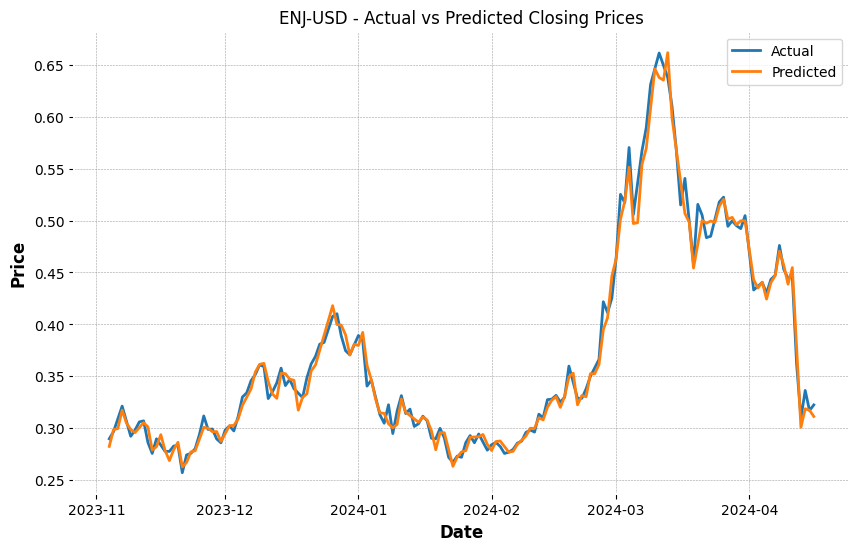

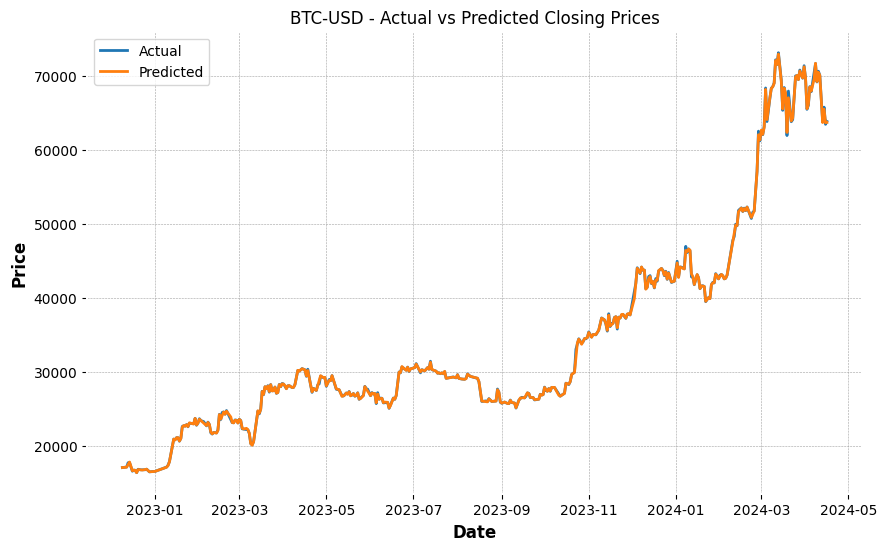

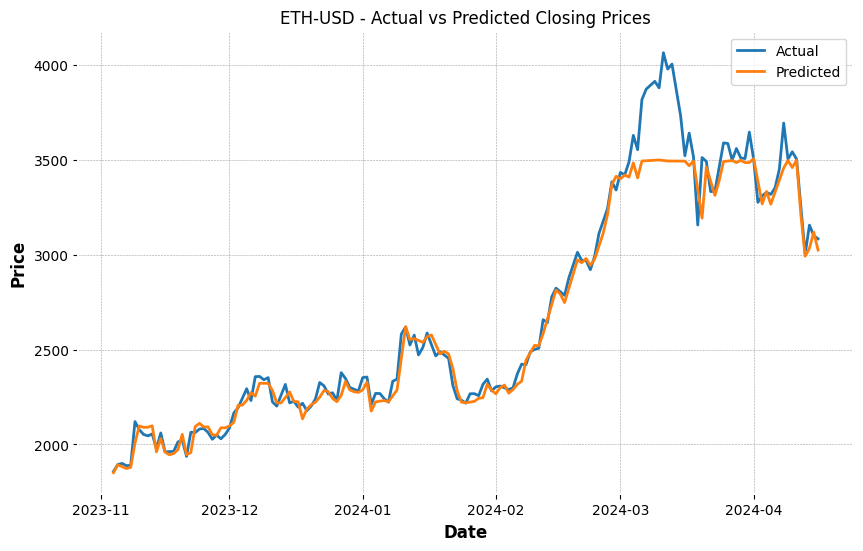

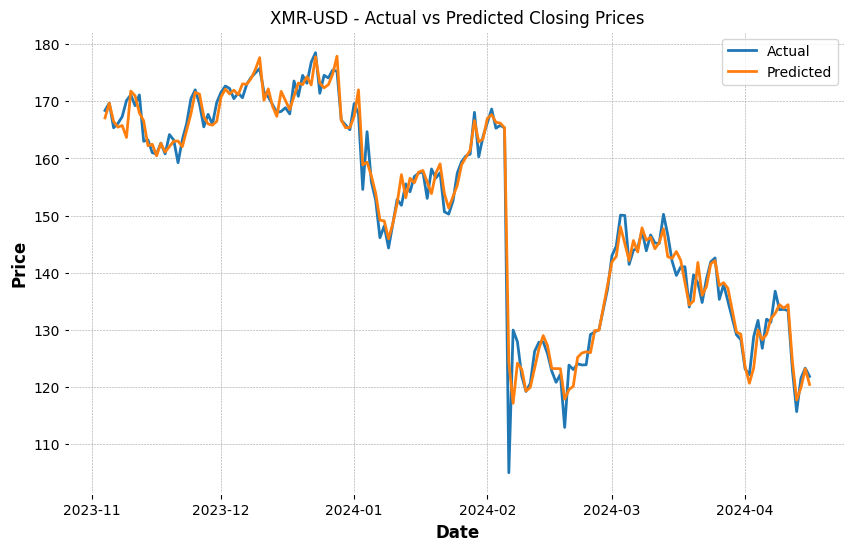

In [67]:
# Plot the actual vs predicted closing prices for the selected cryptocurrencies
for ticker in selected_cryptos:
    # Filter the data for the current cryptocurrency
    crypto_subset = crypto_data[crypto_data['Ticker'] == ticker]
    
    # Prepare the data for Random Forest
    X = crypto_subset.drop(['Close', 'Adj Close', 'Ticker'], axis=1)
    y = crypto_subset['Close']
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
    
    # Initialize the Random Forest Regressor
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    
    # Fit the model on the training data
    rf_model.fit(X_train, y_train)
    
    # Predict the closing prices on the test set
    y_pred = rf_model.predict(X_test)
    
    # Plot the actual vs predicted closing prices
    plt.figure(figsize=(10, 6))
    plt.plot(y_test.index, y_test, label='Actual')
    plt.plot(y_test.index, y_pred, label='Predicted')
    plt.title(f'{ticker} - Actual vs Predicted Closing Prices')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

### 5. xg 2

In [68]:
# Create a dictionary to hold data for each ticker
selected_data = {ticker: crypto_data[crypto_data['Ticker'] == ticker].copy() for ticker in selected_cryptos}


In [69]:
from sklearn.preprocessing import StandardScaler

# Initialize a scaler instance
scaler = StandardScaler()

# Example of preprocessing for each selected ticker
for ticker, data in selected_data.items():
    # Assuming 'Close' is the target variable
    features = data[['Open', 'High', 'Low', 'Volume']]  # Include other features you may have
    scaled_features = scaler.fit_transform(features)
    
    # Replace the old values with the scaled ones
    data[['Open', 'High', 'Low', 'Volume']] = scaled_features
    
    # Feature Engineering: Create a daily return feature
    data['Daily_Return'] = data['Close'].pct_change()
    
    # Drop any rows with missing values that may have been created during feature engineering
    data = data.dropna()
    
    # Store the preprocessed data back in the dictionary
    selected_data[ticker] = data


In [70]:
from sklearn.model_selection import train_test_split

# Prepare training and test sets for each ticker
for ticker, data in selected_data.items():
    X = data.drop(['Close', 'Ticker','Adj Close'], axis=1)  # Features
    y = data['Close']  # Target
    
    # For time series, it's often better to do a chronological train-test split
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]
    
    # Store the splits back in the dictionary
    selected_data[ticker] = (X_train, X_test, y_train, y_test)


C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Ticker: ENJ-USD, RMSE: 0.02970165171769184


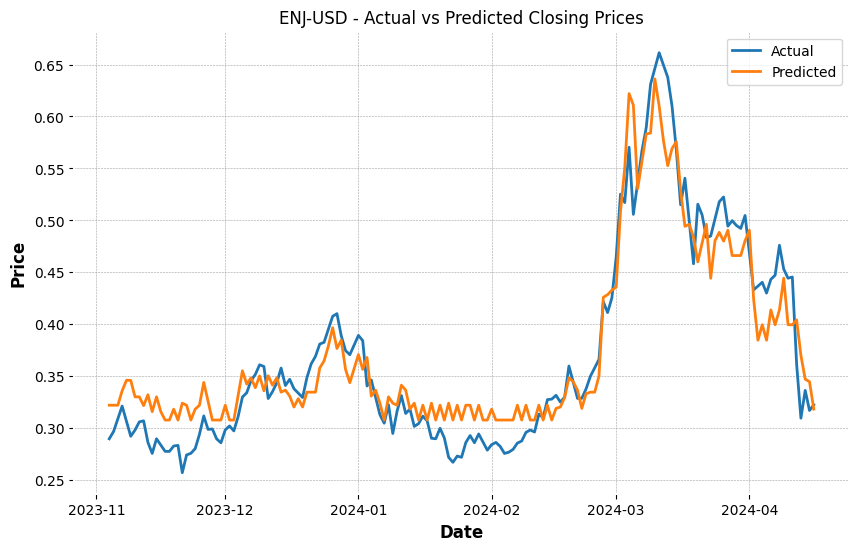

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Ticker: BTC-USD, RMSE: 577.5748038655938


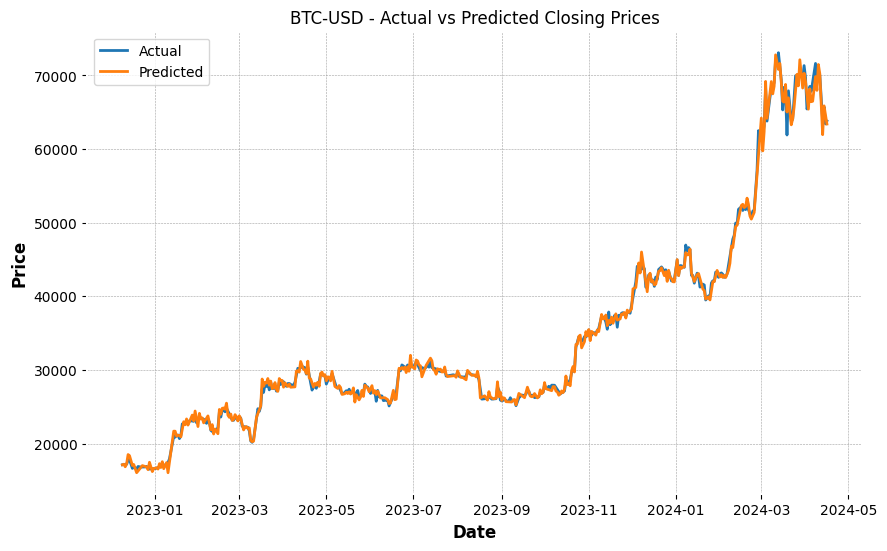

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Ticker: ETH-USD, RMSE: 173.08580654071164


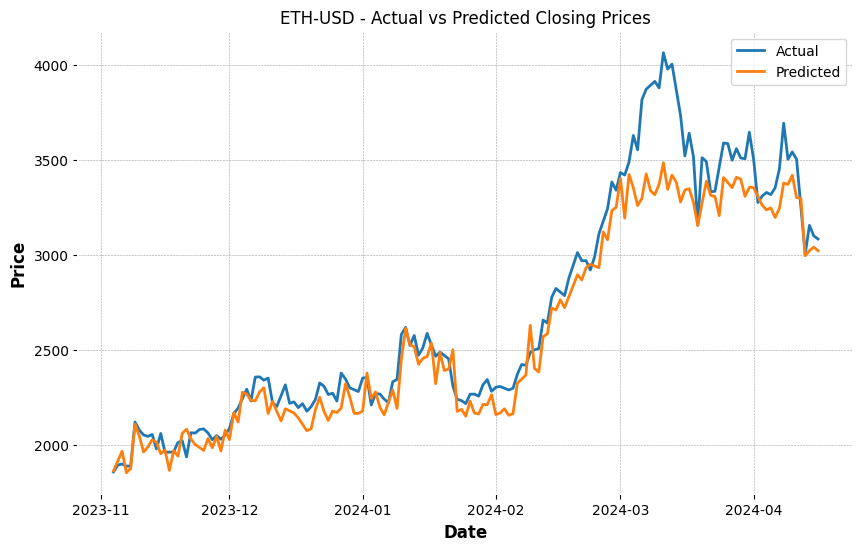

Ticker: XMR-USD, RMSE: 4.330378693665966


C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



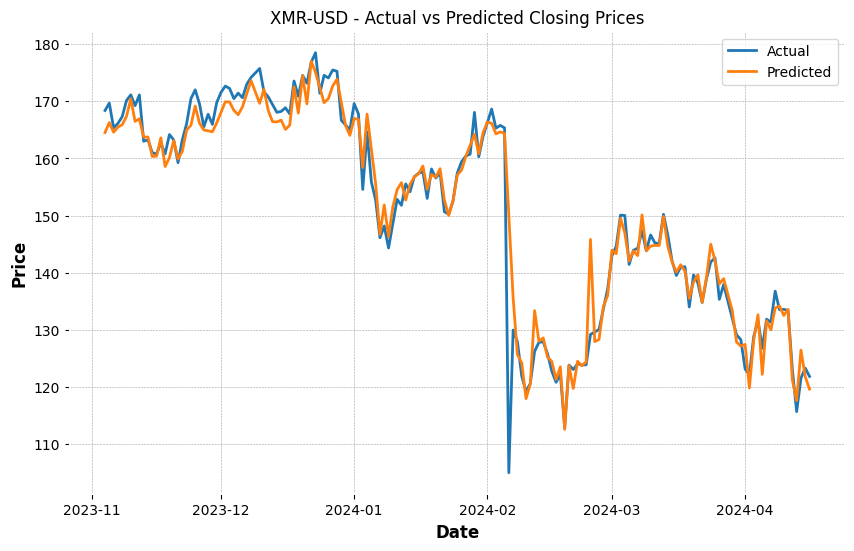

In [71]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

# Define a function to handle the modeling process
def train_xgboost_model(X_train, y_train, X_test, y_test):
    # Initialize the XGBoost regressor
    xg_2 = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                             max_depth = 5, alpha = 10, n_estimators = 100)

    # Fit the model to the training data
    xg_2.fit(X_train, y_train)

    # Predict the test set
    preds = xg_2.predict(X_test)

    # Calculate RMSE
    rmse = mean_squared_error(y_test, preds, squared=False)
    
    return xg_2, rmse

# Dictionary to store models and their performance
model_dict = {}

# Assuming 'selected_data' is a dictionary with your ticker data
for ticker, (X_train, X_test, y_train, y_test) in selected_data.items():
    xg_2, rmse = train_xgboost_model(X_train, y_train, X_test, y_test)
    model_dict[ticker] = {
        'model': xg_2,
        'rmse': rmse
    }
    print(f'Ticker: {ticker}, RMSE: {rmse}')
    
    # plot the actual vs predicted closing prices
    plt.figure(figsize=(10, 6))
    plt.plot(y_test.index, y_test, label='Actual')
    plt.plot(y_test.index, xg_2.predict(X_test), label='Predicted')
    plt.title(f'{ticker} - Actual vs Predicted Closing Prices')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()
    
    


### Lstm Model

In [72]:
selected_data = {ticker: crypto_data[crypto_data['Ticker'] == ticker].copy() for ticker in selected_cryptos}

# Now, let's check to make sure each item in 'selected_data' is a DataFrame
for ticker, df in selected_data.items():
    if not isinstance(df, pd.DataFrame):
        raise TypeError(f"Data for ticker {ticker} is not a pandas DataFrame.")
    if df.empty:
        raise ValueError(f"No data found for ticker {ticker}. Please check your 'crypto_data' DataFrame.")


In [73]:
# Check the unique values in the 'Ticker' column
print(crypto_data['Ticker'].unique())


['BNB-USD' 'ADA-USD' 'XRP-USD' 'DOGE-USD' 'DOT-USD' 'UNI-USD' 'BTC-USD'
 'BCH-USD' 'LTC-USD' 'ETH-USD' 'LINK-USD' 'XLM-USD' 'USDC-USD' 'USDT-USD'
 'VET-USD' 'ETC-USD' 'FIL-USD' 'TRX-USD' 'EOS-USD' 'THETA-USD' 'XMR-USD'
 'NEO-USD' 'AAVE-USD' 'ATOM-USD' 'XTZ-USD' 'CRO-USD' 'LEO-USD' 'HT-USD'
 'ALGO-USD' 'WIF-USD' 'BONK-USD' 'SHIB-USD' 'SOL-USD' 'DGB-USD' 'BCA-USD'
 'XDC-USD' 'ZIL-USD' 'HOT-USD' 'CHZ-USD' 'ENJ-USD' 'MANA-USD' 'BAT-USD'
 'SAND-USD']


In [74]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Define a function to create sequences and corresponding labels
def create_sequences(data, sequence_length):
    sequences = []
    labels = []
    for i in range(sequence_length, len(data)):
        sequences.append(data[i-sequence_length:i])
        labels.append(data[i])
    return np.array(sequences), np.array(labels)

# Define the length of the input sequences
sequence_length = 60  # You might adjust this based on the temporal patterns of the data

# Iterate over each DataFrame in selected_data and preprocess for LSTM
for ticker, df in selected_data.items():
    # Assuming 'Close' is the column you want to predict
    # Normalize the 'Close' prices using MinMaxScaler
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(df[['Close']])

    # Create sequences
    X, y = create_sequences(scaled_data, sequence_length)

    # Reshape the sequences for LSTM [samples, time steps, features]
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Save the preprocessed data back into selected_data
    selected_data[ticker] = {
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test,
        'scaler': scaler  # Save the scaler for inverse transforming later
    }


C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.0954 - val_loss: 0.0636
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0810 - val_loss: 0.0608
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0738 - val_loss: 0.0602
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0652 - val_loss: 0.0611
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0632 - val_loss: 0.0596
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0614 - val_loss: 0.0579
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0594 - val_loss: 0.0571
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0579 - val_loss: 0.0565
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0572 - val_loss: 0.0559
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0569 - val_loss: 0.0553
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0563 - val_loss: 0.0547
Epoch 12/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/ste

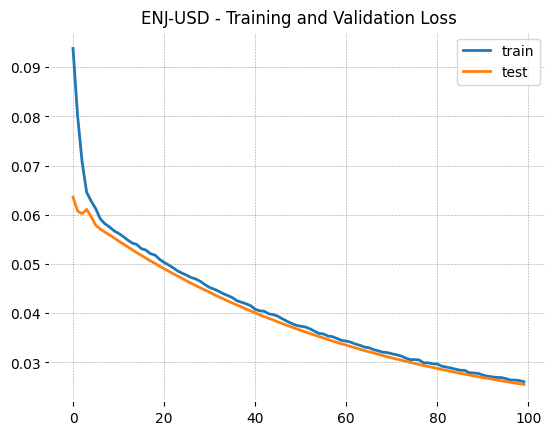

Epoch 1/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.1401 - val_loss: 0.0684
Epoch 2/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - loss: 0.0686 - val_loss: 0.0642
Epoch 3/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0646 - val_loss: 0.0619
Epoch 4/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - loss: 0.0626 - val_loss: 0.0593
Epoch 5/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0604 - val_loss: 0.0569
Epoch 6/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0581 - val_loss: 0.0555
Epoch 7/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0569 - val_loss: 0.0535
Epoch 8/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.0555 - val_loss: 0.0523
Epoch 9/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - loss: 0.0546 - val_loss: 0.0513
Epoch 10/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0532 - val_loss: 0.0491


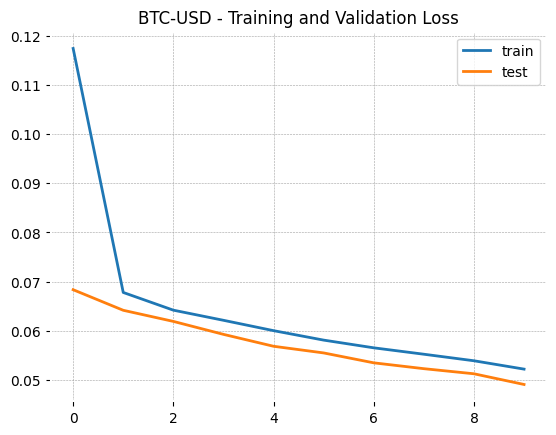

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.1443 - val_loss: 0.3258
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.1111 - val_loss: 0.2113
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0831 - val_loss: 0.1112
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0658 - val_loss: 0.0681
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0648 - val_loss: 0.0703
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0638 - val_loss: 0.0814
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.0628 - val_loss: 0.0770
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0625 - val_loss: 0.0708
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0607 - val_loss: 0.0696
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0605 - val_loss: 0.0697


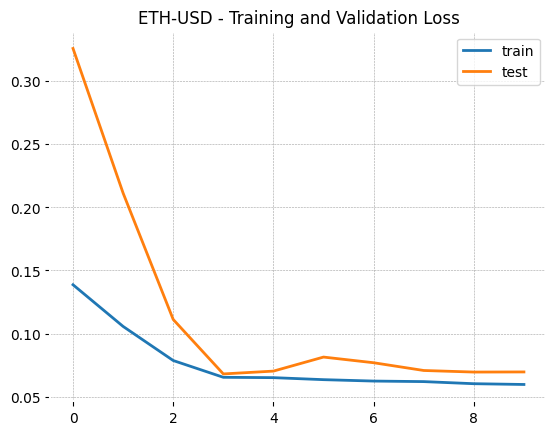

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1797 - val_loss: 0.1087
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.1240 - val_loss: 0.0791
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0873 - val_loss: 0.0640
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0696 - val_loss: 0.0674
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0682 - val_loss: 0.0639
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0670 - val_loss: 0.0622
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - loss: 0.0653 - val_loss: 0.0617
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0648 - val_loss: 0.0617
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0654 - val_loss: 0.0611
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0647 - val_loss: 0.0604


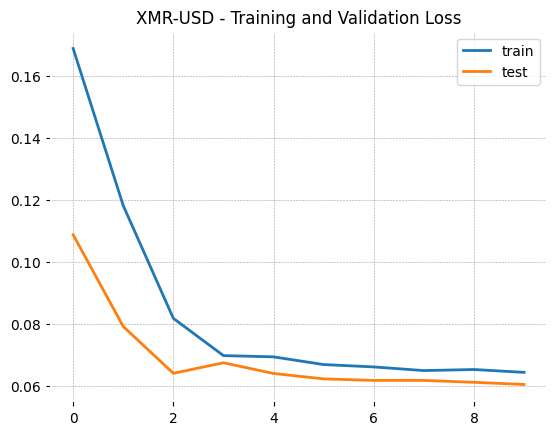

In [75]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l1_l2

# Dictionary to store trained models and their history
trained_models = {}

# Early stopping to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

for ticker, data in selected_data.items():
    # Define the LSTM model architecture with L1/L2 regularization and dropout
    lstm_model = Sequential()
    lstm_model.add(LSTM(100, return_sequences=True, input_shape=(data['X_train'].shape[1], 1),
                   kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4),
                   bias_regularizer=l1_l2(l1=1e-5, l2=1e-4)))
    lstm_model.add(Dropout(0.3))
    lstm_model.add(LSTM(100, kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4),
                   bias_regularizer=l1_l2(l1=1e-5, l2=1e-4)))
    lstm_model.add(Dropout(0.3))
    lstm_model.add(Dense(1))

    # Compile the model
    optimizer = Adam(learning_rate=1e-4)
    lstm_model.compile(optimizer=optimizer, loss='mean_squared_error')

    # Fit the model
    history = lstm_model.fit(data['X_train'], data['y_train'], epochs=100, batch_size=64,
                        validation_data=(data['X_test'], data['y_test']), verbose=1,
                        callbacks=[early_stopping])

    # Save the model and its history
    trained_models[ticker] = {
        'model': lstm_model,
        'history': history
    }

    # Plot the training and validation loss
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title(f'{ticker} - Training and Validation Loss')
    plt.legend()
    plt.show()

# Now 'trained_models' contains the models and training histories for each cryptocurrency


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step


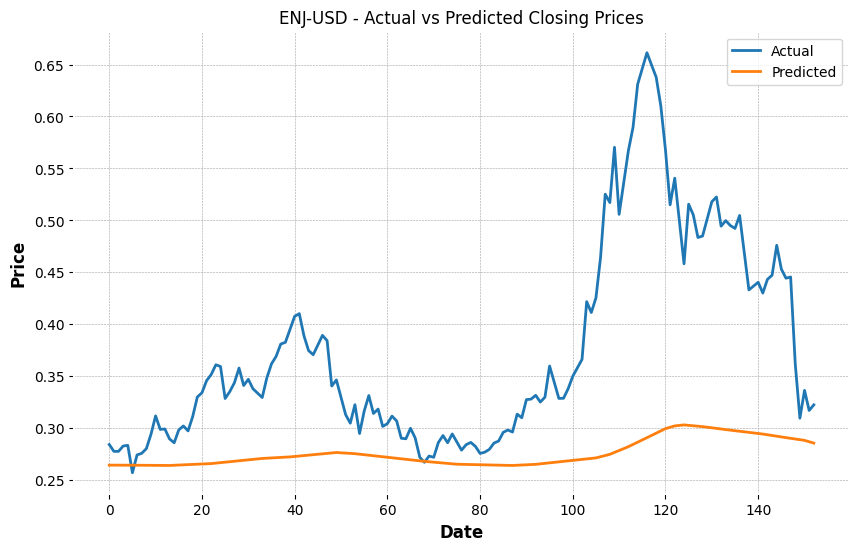

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


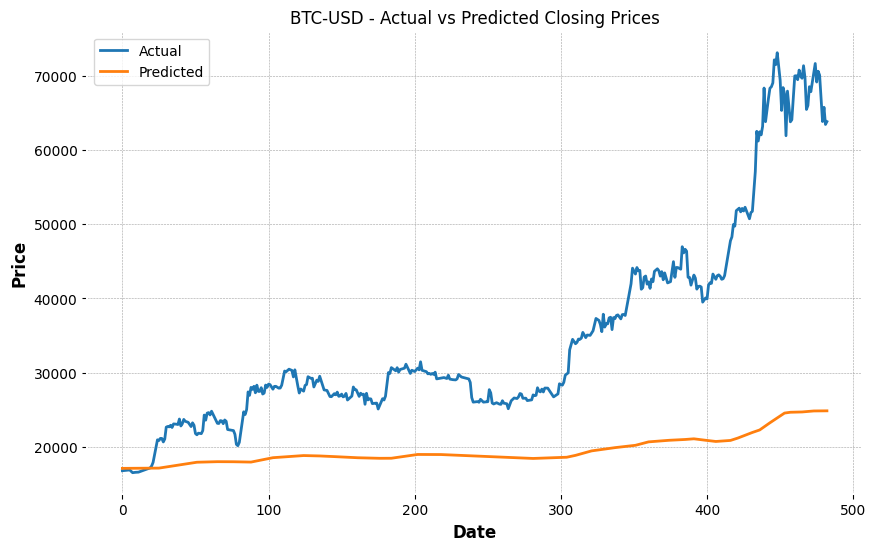

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


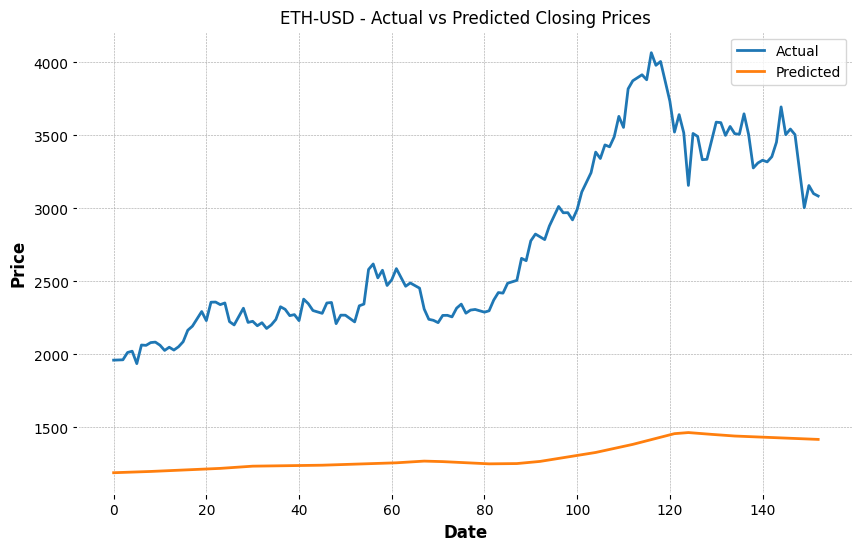

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


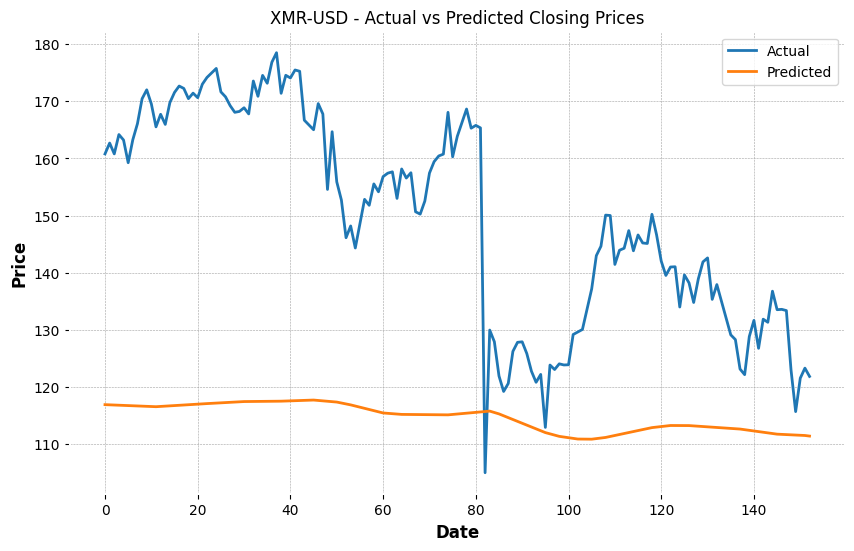

In [76]:
# Evaluate the LSTM models
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Dictionary to store evaluation metrics for each cryptocurrency
evaluation_metrics = {}

for ticker, data in selected_data.items():
    # Retrieve the model and scaler
    lstn_model = trained_models[ticker]['model']
    scaler = data['scaler']

    # Retrieve the test data
    X_test = data['X_test']
    y_test = data['y_test']

    # Make predictions
    y_pred = lstm_model.predict(X_test)

    # Inverse transform the predictions and actual values
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test)

    # Calculate evaluation metrics
    mse = mean_squared_error(y_test_inv, y_pred_inv)
    mae = mean_absolute_error(y_test_inv, y_pred_inv)

    # Store the evaluation metrics in the dictionary
    evaluation_metrics[ticker] = {
        'MSE': mse,
        'MAE': mae
    }

    # Plot the actual vs predicted closing prices
    plt.figure(figsize=(10, 6))
    plt.plot(y_test_inv, label='Actual')
    plt.plot(y_pred_inv, label='Predicted')
    plt.title(f'{ticker} - Actual vs Predicted Closing Prices')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()
    
    

In [77]:
# Evaluate the LSTM models
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Dictionary to store evaluation metrics for each cryptocurrency
evaluation_metrics = {}

for ticker, data in selected_data.items():
    # Retrieve the model and scaler
    lstm_model = trained_models[ticker]['model']
    scaler = data['scaler']

    # Retrieve the test data
    X_test = data['X_test']
    y_test = data['y_test']

    # Make predictions
    y_pred = lstm_model.predict(X_test)

    # Inverse transform the predictions and actual values
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test)

    # Calculate evaluation metrics
    mse = mean_squared_error(y_test_inv, y_pred_inv)
    mae = mean_absolute_error(y_test_inv, y_pred_inv)

    # Store the evaluation metrics in the dictionary
    evaluation_metrics[ticker] = {
        'MSE': mse,
        'MAE': mae,
        'RMSE': np.sqrt(mse)
    }

    # Print the evaluation metrics
    print(f"Evaluation Metrics for {ticker}:")
    print("Mean Squared Error:", mse)
    print("Mean Absolute Error:", mae)
    print("Root Mean Squared Error:", np.sqrt(mse))

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step
Evaluation Metrics for ENJ-USD:
Mean Squared Error: 0.0024022474376100998
Mean Absolute Error: 0.033312535753437116
Root Mean Squared Error: 0.049012727302304854
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step
Evaluation Metrics for BTC-USD:
Mean Squared Error: 29158366.621422708
Mean Absolute Error: 3524.2786094396997
Root Mean Squared Error: 5399.848759124899
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step
Evaluation Metrics for ETH-USD:
Mean Squared Error: 2512493.524032643
Mean Absolute Error: 1491.5588211358763
Root Mean Squared Error: 1585.0847056333118
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Evaluation Metrics for XMR-USD:
Mean Squared Error: 1494.8567055161652
Mean Absolute Error: 35.08446627348856
Root Mean Squared Error: 38.66337679919028


Epoch 1/100


C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\keras\src\layers\core\wrapper.py:27: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0399 - val_loss: 0.0149
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0296 - val_loss: 0.0132
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0207 - val_loss: 0.0129
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0175 - val_loss: 0.0132
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0166 - val_loss: 0.0130
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0163 - val_loss: 0.0126
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0159 - val_loss: 0.0125
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0141 - val_loss: 0.0126
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0145 - val_loss: 0.0126
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0143 - val_loss: 0.0127
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.0141 - val_loss: 0.0127
Epoch 12/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.

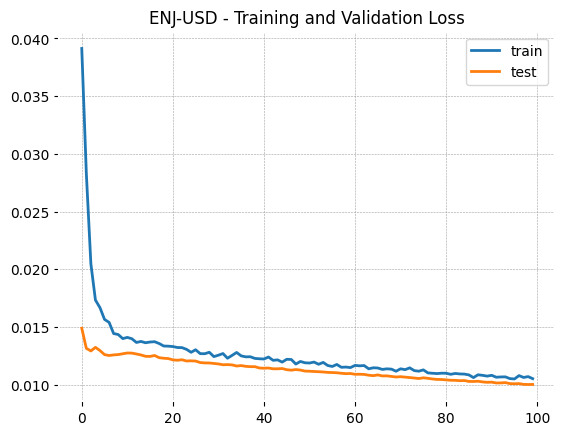

Epoch 1/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1170 - val_loss: 0.0536
Epoch 2/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0324 - val_loss: 0.0244
Epoch 3/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0269 - val_loss: 0.0230
Epoch 4/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0231 - val_loss: 0.0186
Epoch 5/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0205 - val_loss: 0.0169
Epoch 6/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 0.0191 - val_loss: 0.0160
Epoch 7/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0183 - val_loss: 0.0151
Epoch 8/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0178 - val_loss: 0.0145
Epoch 9/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0173 - val_loss: 0.0139
Epoch 10/100
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 0.0161 - val_loss: 0.0137


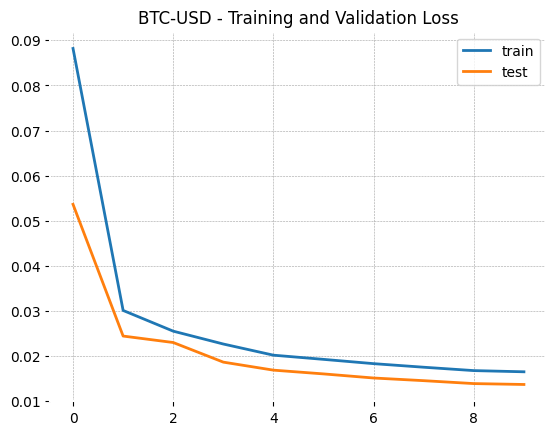

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.0756 - val_loss: 0.2115
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0458 - val_loss: 0.1303
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0292 - val_loss: 0.0735
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0224 - val_loss: 0.0463
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0222 - val_loss: 0.0422
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0206 - val_loss: 0.0449
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0203 - val_loss: 0.0461
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0197 - val_loss: 0.0429
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0202 - val_loss: 0.0359
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0180 - val_loss: 0.0306


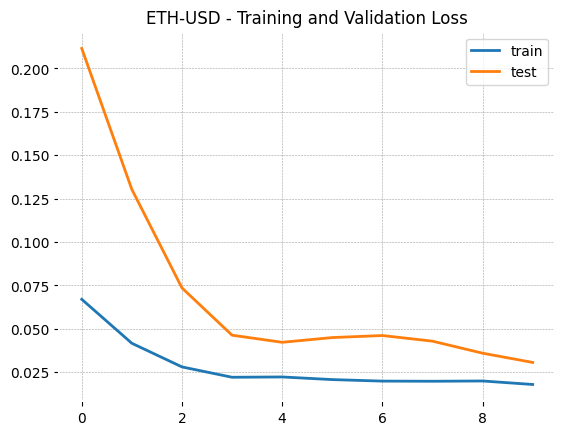

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.0980 - val_loss: 0.0459
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0640 - val_loss: 0.0284
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0449 - val_loss: 0.0191
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0284 - val_loss: 0.0184
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0259 - val_loss: 0.0196
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0254 - val_loss: 0.0186
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0248 - val_loss: 0.0176
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0236 - val_loss: 0.0173
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0222 - val_loss: 0.0172
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0210 - val_loss: 0.0170


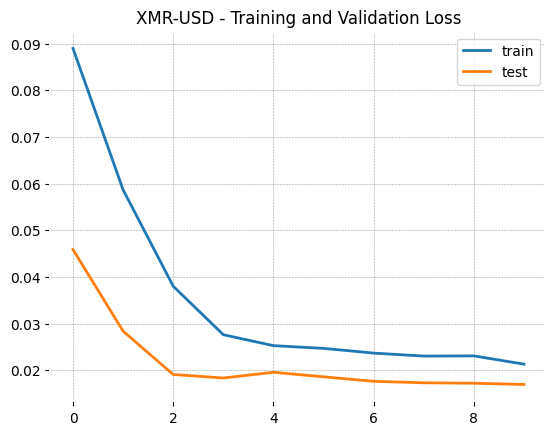

In [78]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l1_l2

trained_models = {}

# Define early stopping callback to avoid overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Loop through each cryptocurrency data
for ticker, data in selected_data.items():
    # Define a Sequential model
    bi_model = Sequential()

    # Add a Bidirectional LSTM layer
    bi_model.add(Bidirectional(LSTM(units=50, return_sequences=True, 
                                 kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4),
                                 bias_regularizer=l1_l2(l1=1e-5, l2=1e-4)),
                            input_shape=(data['X_train'].shape[1], 1)))

    # Optionally add more LSTM layers
    bi_model.add(Bidirectional(LSTM(units=50, return_sequences=False)))
    bi_model.add(Dropout(0.3))
    
    # Output layer
    bi_model.add(Dense(units=1))

    # Compile the model
    bi_model.compile(optimizer=Adam(learning_rate=1e-4), loss='mean_squared_error')

    # Fit the model
    history = bi_model.fit(data['X_train'], data['y_train'], epochs=100, batch_size=64,
                        validation_data=(data['X_test'], data['y_test']), verbose=1,
                        callbacks=[early_stopping])

    # Save the model and its history
    trained_models[ticker] = {
        'model': bi_model,
        'history': history
    }

    # Plot the training and validation loss
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.title(f'{ticker} - Training and Validation Loss')
    plt.legend()
    plt.show()


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step


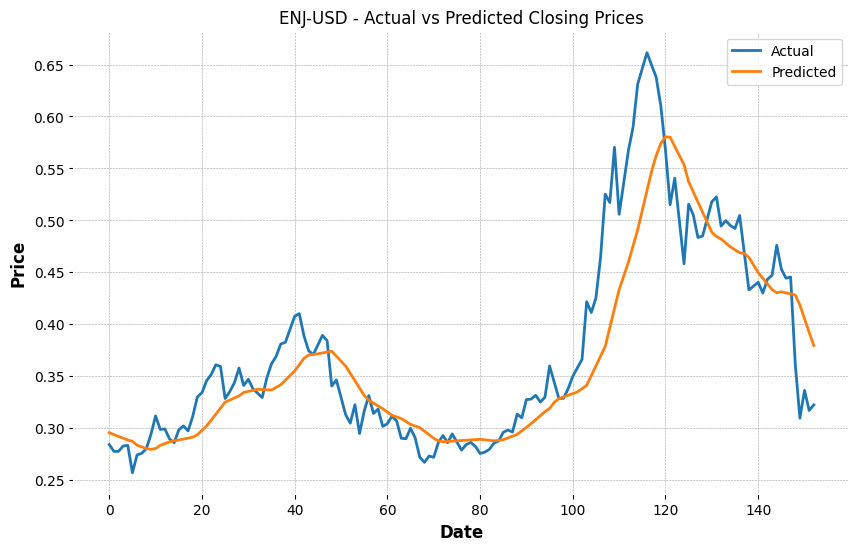

16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step


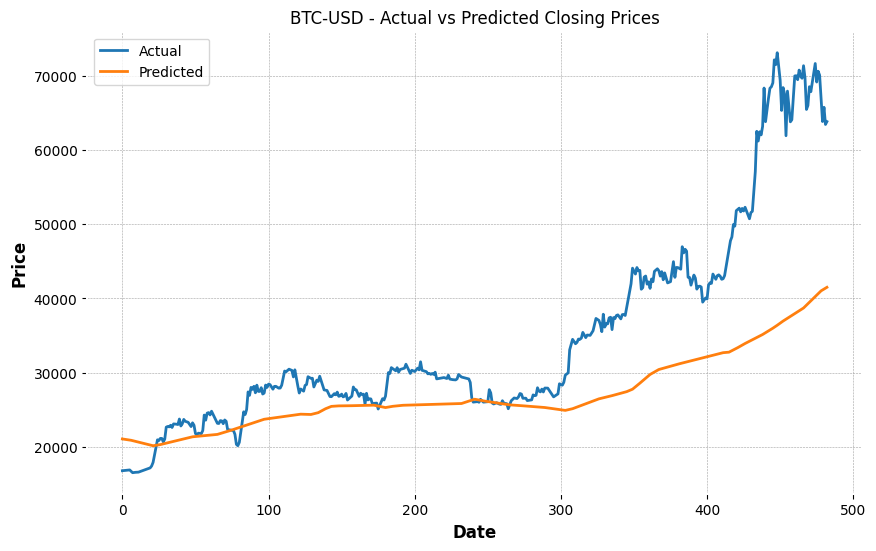

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step


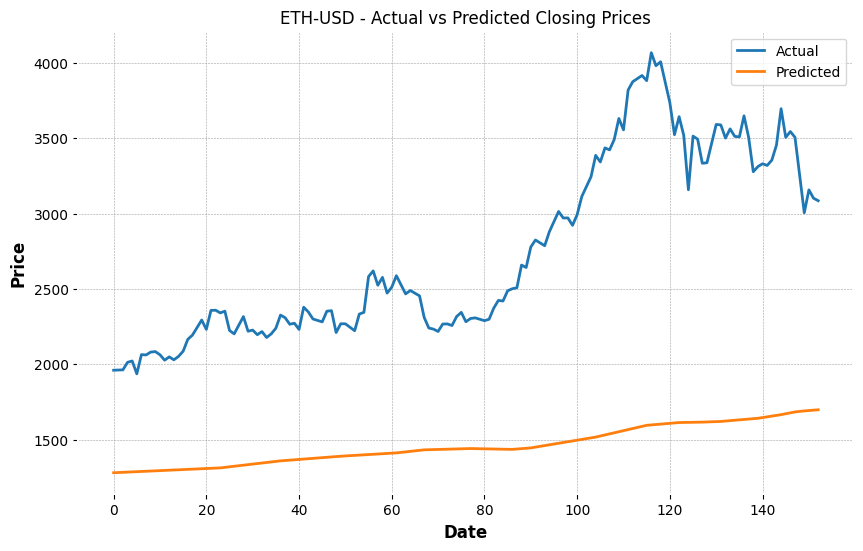

1/5 ━━━━━━━━━━━━━━━━━━━━ 2s 509ms/stepWARNING:tensorflow:5 out of the last 11 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x0000028B9A5A0C20> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 134ms/step


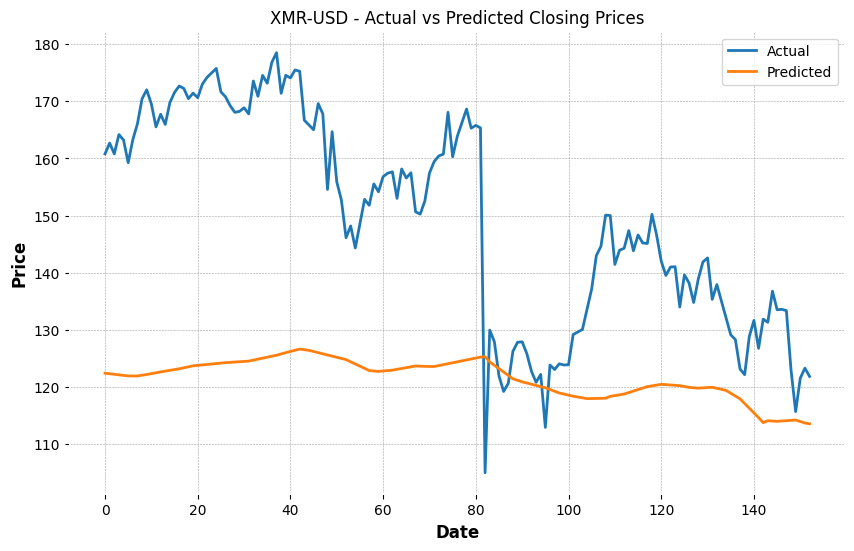

In [79]:
# Evaluate the Bidirectional LSTM models
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Dictionary to store evaluation metrics for each cryptocurrency
evaluation_metrics = {}

for ticker, data in selected_data.items():
    # Retrieve the model and scaler
    bi_model = trained_models[ticker]['model']
    scaler = data['scaler']

    # Retrieve the test data
    X_test = data['X_test']
    y_test = data['y_test']

    # Make predictions
    y_pred = bi_model.predict(X_test)

    # Inverse transform the predictions and actual values
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test)

    # Calculate evaluation metrics
    mse = mean_squared_error(y_test_inv, y_pred_inv)
    mae = mean_absolute_error(y_test_inv, y_pred_inv)

    # Store the evaluation metrics in the dictionary
    evaluation_metrics[ticker] = {
        'MSE': mse,
        'MAE': mae
    }

    # Plot the actual vs predicted closing prices
    plt.figure(figsize=(10, 6))
    plt.plot(y_test_inv, label='Actual')
    plt.plot(y_pred_inv, label='Predicted')
    plt.title(f'{ticker} - Actual vs Predicted Closing Prices')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

In [80]:
# Evaluate the Bidirectional LSTM models
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Dictionary to store evaluation metrics for each cryptocurrency
evaluation_metrics = {}

for ticker, data in selected_data.items():
    # Retrieve the model and scaler
    bi_model = trained_models[ticker]['model']
    scaler = data['scaler']

    # Retrieve the test data
    X_test = data['X_test']
    y_test = data['y_test']

    # Make predictions
    y_pred = bi_model.predict(X_test)

    # Inverse transform the predictions and actual values
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test)

    # Calculate evaluation metrics
    mse = mean_squared_error(y_test_inv, y_pred_inv)
    mae = mean_absolute_error(y_test_inv, y_pred_inv)

    # Store the evaluation metrics in the dictionary
    evaluation_metrics[ticker] = {
        'MSE': mse,
        'MAE': mae,
        'RMSE': np.sqrt(mse),
        'R-squared': r2_score(y_test_inv, y_pred_inv)
    }

    # Print the evaluation metrics
    print(f"Evaluation Metrics for {ticker}:")
    print("Mean Squared Error:", mse)
    print("Mean Absolute Error:", mae)
    print("Root Mean Squared Error:", np.sqrt(mse))
    print("R-squared:", r2_score(y_test_inv, y_pred_inv))

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Evaluation Metrics for ENJ-USD:
Mean Squared Error: 0.002008943247227843
Mean Absolute Error: 0.030159007490070815
Root Mean Squared Error: 0.044821236565135536
R-squared: 0.7903280910851377
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Evaluation Metrics for BTC-USD:
Mean Squared Error: 137479575.17419642
Mean Absolute Error: 7873.572997541408
Root Mean Squared Error: 11725.168449715185
R-squared: 0.2601876217024054
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Evaluation Metrics for ETH-USD:
Mean Squared Error: 1886163.6533828645
Mean Absolute Error: 1282.559099583844
Root Mean Squared Error: 1373.376733960083
R-squared: -4.250048146524512
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Evaluation Metrics for XMR-USD:
Mean Squared Error: 1046.5639085572288
Mean Absolute Error: 28.487260806015115
Root Mean Squared Error: 32.3506400022817
R-squared: -2.119312325436118


Evaluation Metrics for ENJ-USD: MSE = 0.000551676335924863, RMSE = 0.023487791210006593


C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1989120422.py:8: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1989120422.py:9: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1989120422.py:12: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1989120422.py:8: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1989120422.py:9: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise

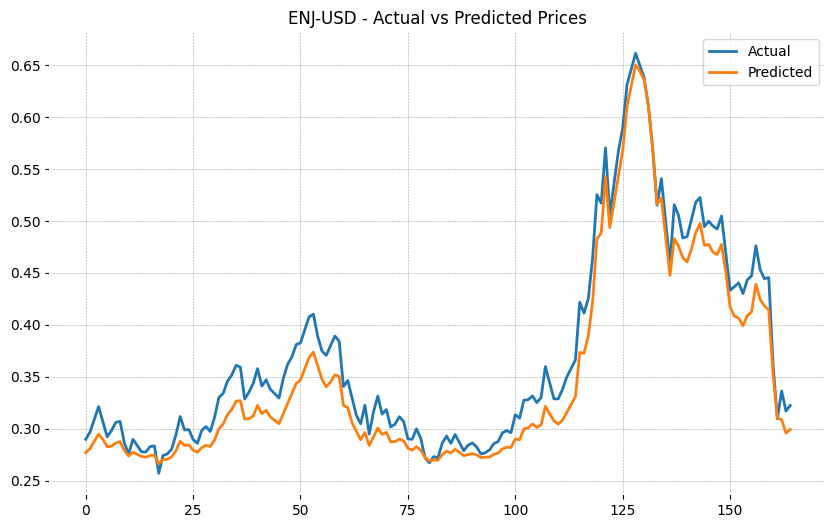

Evaluation Metrics for BTC-USD: MSE = 241704.1643886511, RMSE = 491.6341774008913


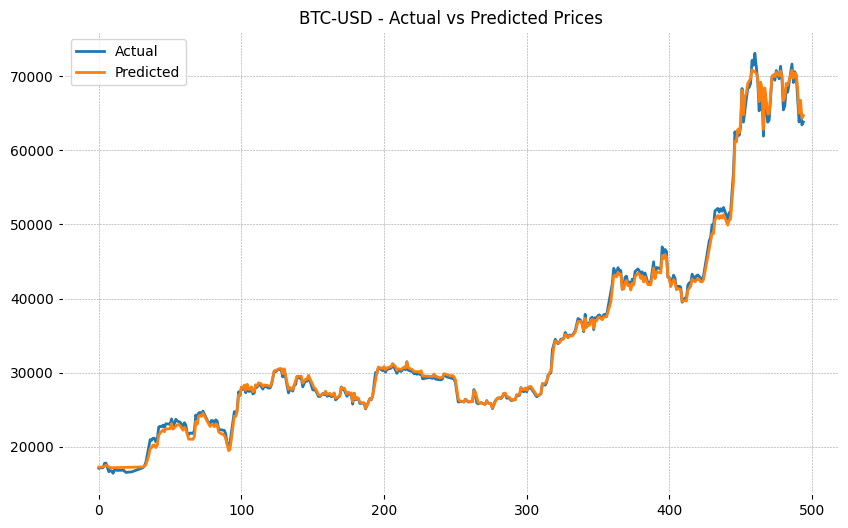

Evaluation Metrics for ETH-USD: MSE = 56365.65693791562, RMSE = 237.41452554112107


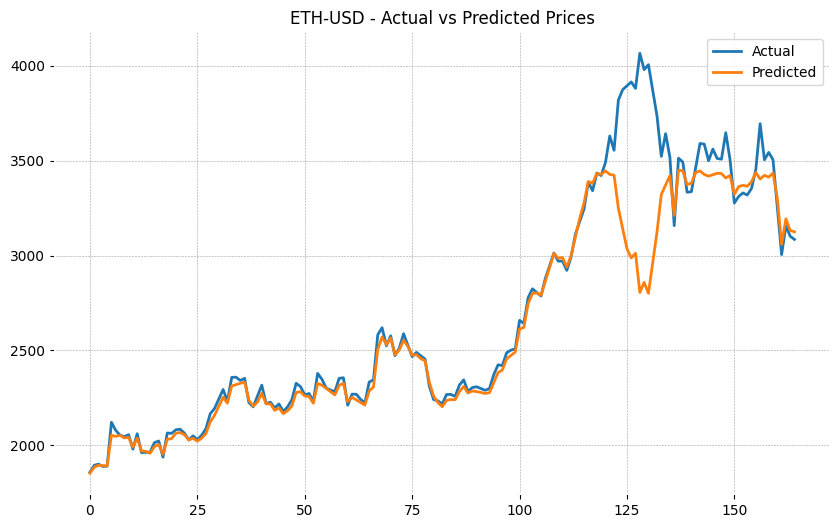

Evaluation Metrics for XMR-USD: MSE = 6.814612629595129, RMSE = 2.6104813022879765


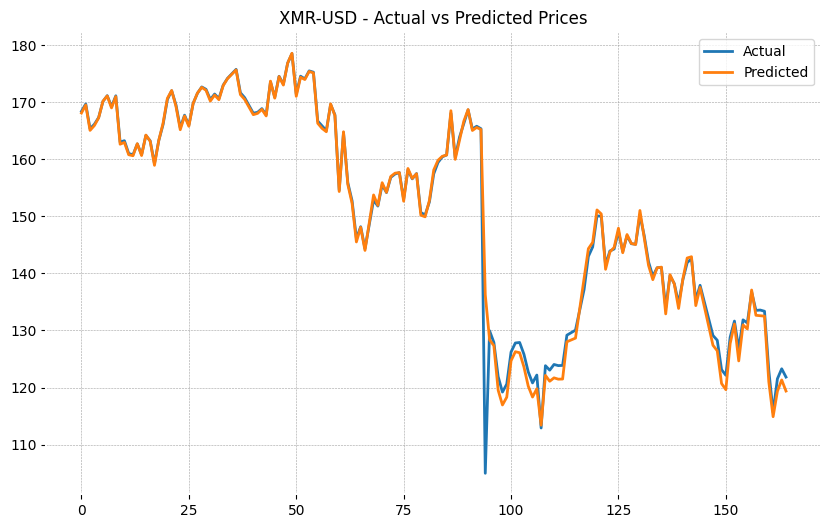

In [81]:
from sklearn.svm import SVR

selected_data = {ticker: crypto_data[crypto_data['Ticker'] == ticker].copy() for ticker in selected_cryptos}


# Process each ticker
for ticker, df in selected_data.items():
    df.fillna(method='ffill', inplace=True)
    df.fillna(method='bfill', inplace=True)
    
    # Create features
    df['3d_MA'] = df['Close'].rolling(window=3).mean().fillna(method='bfill')

    # Create separate scalers for features and target
    feature_scaler = StandardScaler()
    target_scaler = StandardScaler()

    # Scale features
    df['scaled_Close'] = target_scaler.fit_transform(df[['Close']])
    features_scaled = feature_scaler.fit_transform(df[['Close', '3d_MA']])

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(features_scaled, df['scaled_Close'], test_size=0.2, shuffle=False)

    selected_data[ticker] = {
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test,
        'feature_scaler': feature_scaler,
        'target_scaler': target_scaler
    }

# Train and predict
svr_models = {}
evaluation_metrics = {}
for ticker, data in selected_data.items():
    svr = SVR(kernel='rbf')
    svr.fit(data['X_train'], data['y_train'])
    y_pred_scaled = svr.predict(data['X_test'])

    # Correct inverse transformation using the target_scaler
    y_pred = data['target_scaler'].inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
    y_test = data['target_scaler'].inverse_transform(data['y_test'].values.reshape(-1, 1)).flatten()  # Adjusted here
    
    mse = mean_squared_error(y_test, y_pred)
    evaluation_metrics[ticker] = {'MSE': mse, 'RMSE': np.sqrt(mse)}
    
    # Print and plot results
    print(f"Evaluation Metrics for {ticker}: MSE = {mse}, RMSE = {np.sqrt(mse)}")
    plt.figure(figsize=(10, 6))
    plt.plot(y_test, label='Actual')
    plt.plot(y_pred, label='Predicted')
    plt.title(f'{ticker} - Actual vs Predicted Prices')
    plt.legend()
    plt.show()


### 8. CatBoost Model

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1286292587.py:22: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1286292587.py:23: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1286292587.py:22: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1286292587.py:23: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\dagbo_b40tnyc\AppData\Local\Temp\ipykernel_54144\1286292587.py:22: FutureWarning:

DataFrame.fillna with 'method' is deprecated and wil

ENJ-USD: MSE = 4.866692635517311e-05
ENJ-USD: RMSE = 0.006976168458055834
ENJ-USD: R-squared = 0.9947641417485865


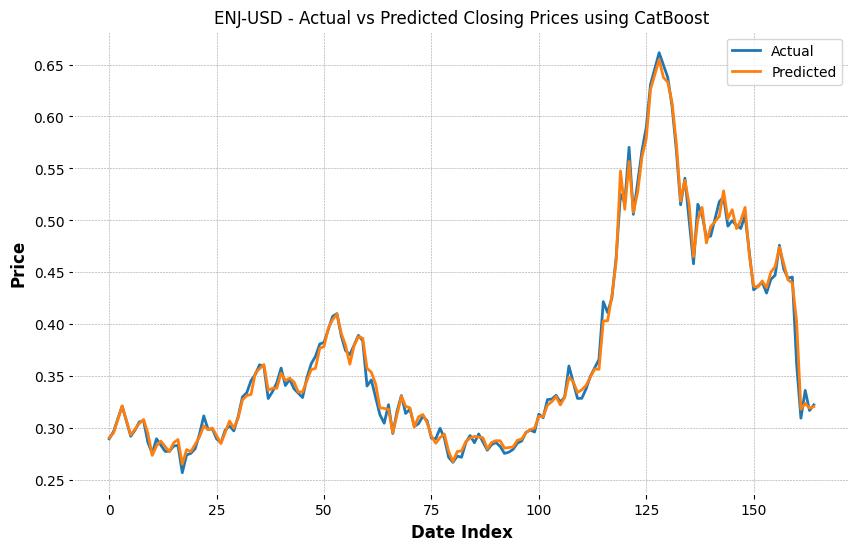

BTC-USD: MSE = 1559.2349490087056
BTC-USD: RMSE = 39.487149162844176
BTC-USD: R-squared = 0.9999917289928505


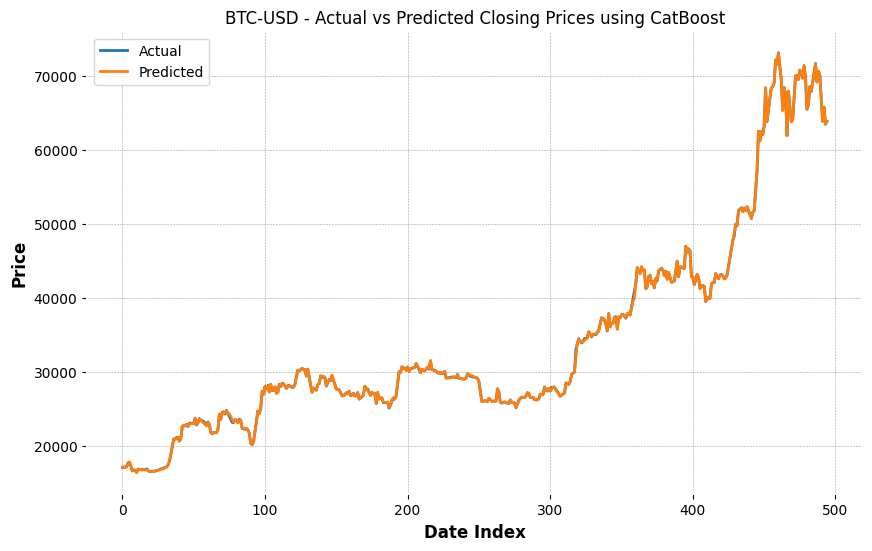

ETH-USD: MSE = 14017.253756166803
ETH-USD: RMSE = 118.39448363909023
ETH-USD: R-squared = 0.9623621955283266


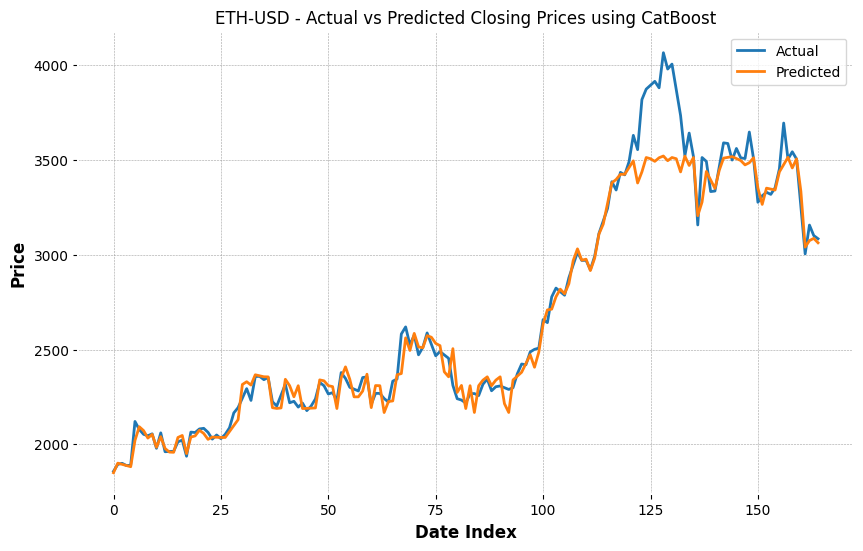

XMR-USD: MSE = 7.657663086672303
XMR-USD: RMSE = 2.767248287861482
XMR-USD: R-squared = 0.9769785266847241


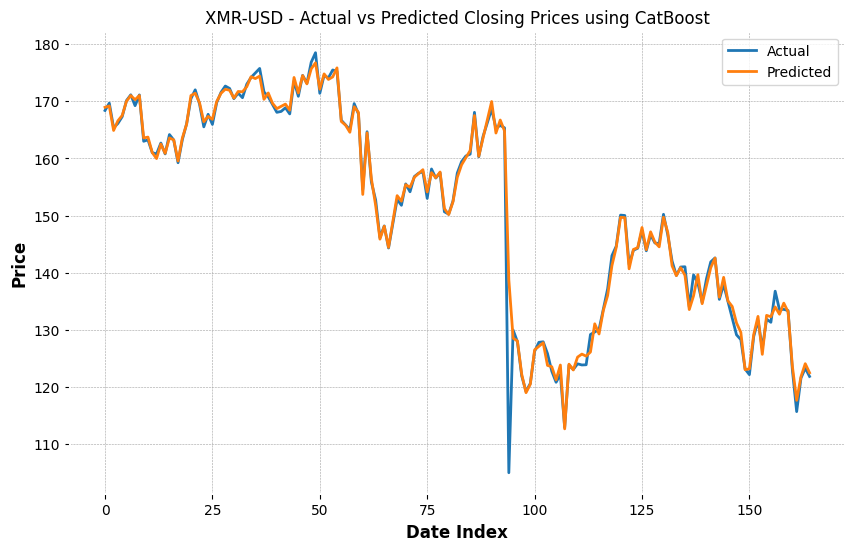

In [82]:
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Ensure crypto_data is a pandas DataFrame
if not isinstance(crypto_data, pd.DataFrame):
    raise ValueError("crypto_data is not a pandas DataFrame.")


selected_data = {ticker: crypto_data[crypto_data['Ticker'] == ticker].copy() for ticker in selected_cryptos}

# Preprocess and feature engineering
for ticker, df in selected_data.items():
    # Drop 'Ticker' column if it's not needed as a feature
    df.drop(columns=['Ticker'], inplace=True)
    
    # Ensure there is no 'Date' column or convert it to numerical features before using it
    # df['Date'] = pd.to_datetime(df['Date']).astype(int)/1e9 if 'Date' in df.columns else df
    
    # Fill missing values
    df.fillna(method='bfill', inplace=True)
    df.fillna(method='ffill', inplace=True)
    
    # Feature engineering: lagged features
    for lag in range(1, 4):
        df[f'lag_{lag}'] = df['Close'].shift(lag)
    
    df.dropna(inplace=True)  # Drop rows with missing values due to lags

# Modeling and evaluation
for ticker, df in selected_data.items():
    # Define features and target
    X = df.drop(['Close'], axis=1)
    y = df['Close']
    
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False, random_state=42)
    
    # Initialize CatBoostRegressor
    cat_model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE')
    
    # Fit the model
    cat_model.fit(X_train, y_train, verbose=False)
    
    # Predict
    predictions = cat_model.predict(X_test)
    
    # Evaluate the model
    mse = mean_squared_error(y_test, predictions)
    print(f"{ticker}: MSE = {mse}")
    rmse = np.sqrt(mse)
    print(f"{ticker}: RMSE = {rmse}")
    r2 = r2_score(y_test, predictions)
    print(f"{ticker}: R-squared = {r2}")
    
    # Plot actual vs predicted closing prices
    plt.figure(figsize=(10, 6))
    plt.plot(y_test.reset_index(drop=True), label='Actual')  # Reset index if needed
    plt.plot(predictions, label='Predicted')
    plt.title(f'{ticker} - Actual vs Predicted Closing Prices using CatBoost')
    plt.xlabel('Date Index')
    plt.ylabel('Price')
    plt.legend()
    plt.show()


### comparison of all models used from prohet, ARIMA, Random Forest, XGBoost, LSTM, Bidirectional LSTM, SVR, CatBoost and choose the best 4 models

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Ticker: ENJ-USD, XGBoost RMSE: 1.4538074495917361, CatBoost RMSE: 2.767248287861482, SVR RMSE: 348.5502577303004
Ticker: ENJ-USD, XGBoost R-squared: 0.9936459498391333, CatBoost R-squared: 0.9769785266847241, SVR R-squared: -0.04785759918534316


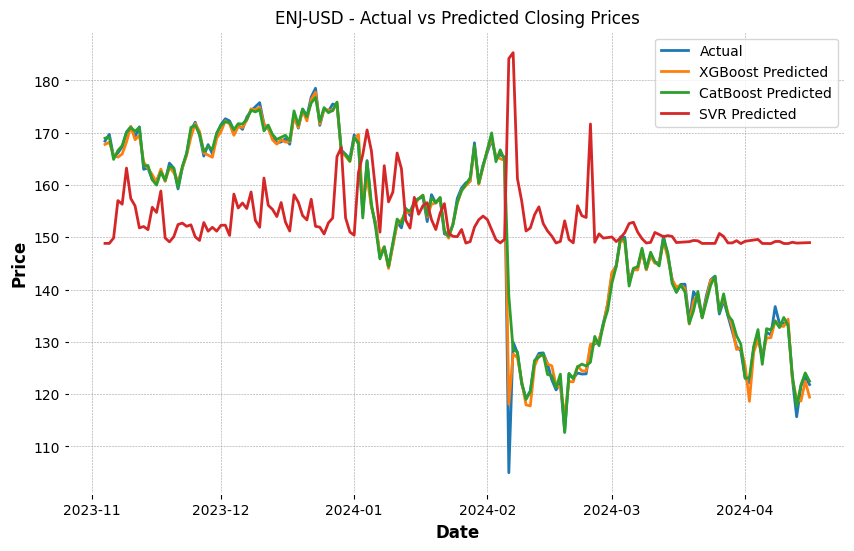

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Ticker: BTC-USD, XGBoost RMSE: 1.4538074495917361, CatBoost RMSE: 2.767248287861482, SVR RMSE: 348.5502577303004
Ticker: BTC-USD, XGBoost R-squared: 0.9936459498391333, CatBoost R-squared: 0.9769785266847241, SVR R-squared: -0.04785759918534316


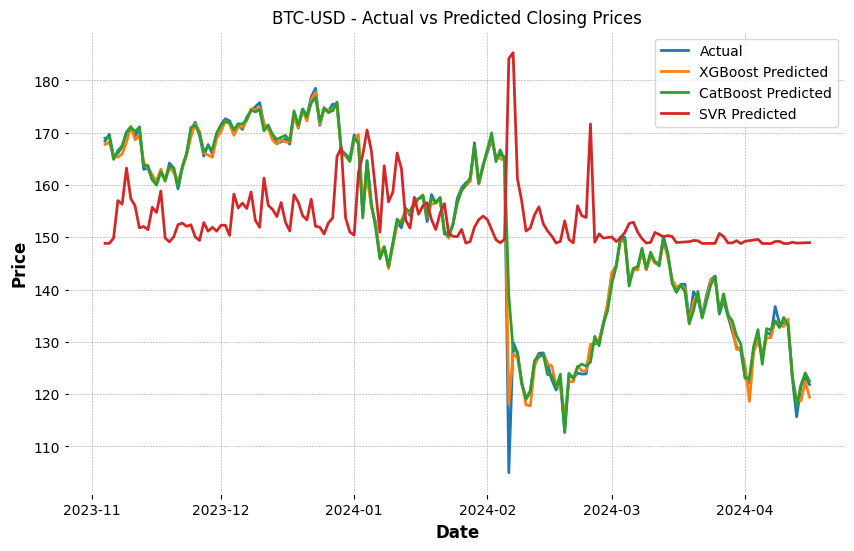

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Ticker: ETH-USD, XGBoost RMSE: 1.4538074495917361, CatBoost RMSE: 2.767248287861482, SVR RMSE: 348.5502577303004
Ticker: ETH-USD, XGBoost R-squared: 0.9936459498391333, CatBoost R-squared: 0.9769785266847241, SVR R-squared: -0.04785759918534316


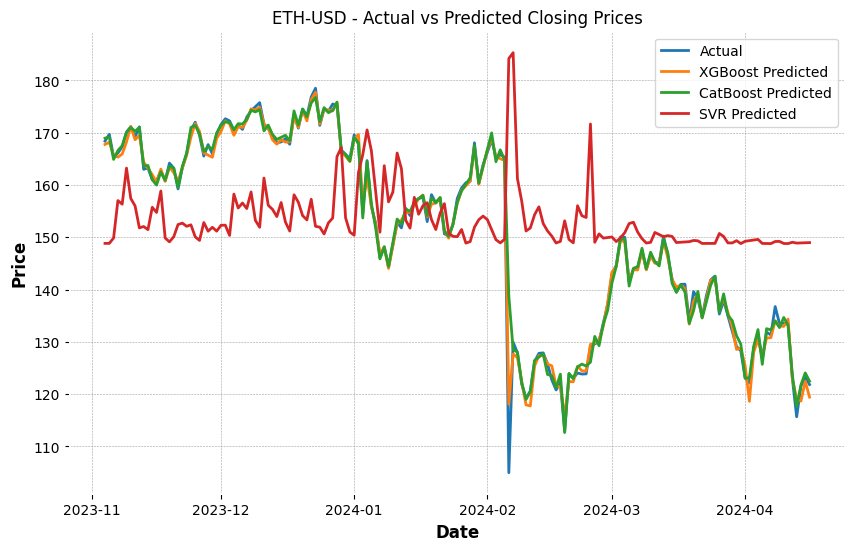

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



Ticker: XMR-USD, XGBoost RMSE: 1.4538074495917361, CatBoost RMSE: 2.767248287861482, SVR RMSE: 348.5502577303004
Ticker: XMR-USD, XGBoost R-squared: 0.9936459498391333, CatBoost R-squared: 0.9769785266847241, SVR R-squared: -0.04785759918534316


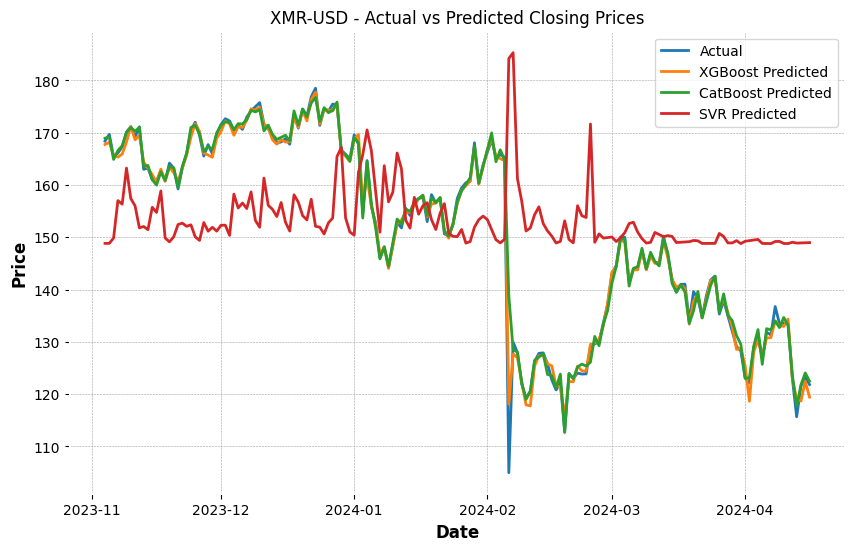

In [83]:
# compare xgboost, catboost and svr model performance

xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = best['colsample_bytree'], 
                          learning_rate = best['learning_rate'], max_depth = int(best['max_depth']),
                          alpha = best['alpha'], n_estimators = int(best['n_estimators']))

cat_model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE')

svr = SVR(kernel='rbf')

# Dictionary to store models and their performance
model_dict = {}

# Assuming 'selected_data' is a dictionary with your ticker data
for ticker, data in selected_data.items():
    xg_reg.fit(X_train, y_train)
    cat_model.fit(X_train, y_train, verbose=False)
    svr.fit(X_train, y_train)
    
    xg_pred = xg_reg.predict(X_test)
    cat_pred = cat_model.predict(X_test)
    svr_pred = svr.predict(X_test)
    
    xg_rmse = mean_squared_error(y_test, xg_pred, squared=False)
    cat_rmse = mean_squared_error(y_test, cat_pred, squared=False)
    svr_rmse = mean_squared_error(y_test, svr_pred)
    
    # rsquared = r2_score(y_test, y_pred)
    xg_r2 = r2_score(y_test, xg_pred)
    cat_r2 = r2_score(y_test, cat_pred)
    svr_r2 = r2_score(y_test, svr_pred)
    
    
    model_dict[ticker] = {
        'XGBoost': xg_rmse,
        'CatBoost': cat_rmse,
        'SVR': svr_rmse
    }
    
    #r2 model dict
    model_dict[ticker] = {
        'XGBoost': xg_r2,
        'CatBoost': cat_r2,
        'SVR': svr_r2
    }
    
    
    print(f'Ticker: {ticker}, XGBoost RMSE: {xg_rmse}, CatBoost RMSE: {cat_rmse}, SVR RMSE: {svr_rmse}')
    print(f'Ticker: {ticker}, XGBoost R-squared: {xg_r2}, CatBoost R-squared: {cat_r2}, SVR R-squared: {svr_r2}')
    
    # plot the actual vs predicted closing prices
    plt.figure(figsize=(10, 6))
    plt.plot(y_test.index, y_test, label='Actual')
    plt.plot(y_test.index, xg_pred, label='XGBoost Predicted')
    plt.plot(y_test.index, cat_pred, label='CatBoost Predicted')
    plt.plot(y_test.index, svr_pred, label='SVR Predicted')
    plt.title(f'{ticker} - Actual vs Predicted Closing Prices')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

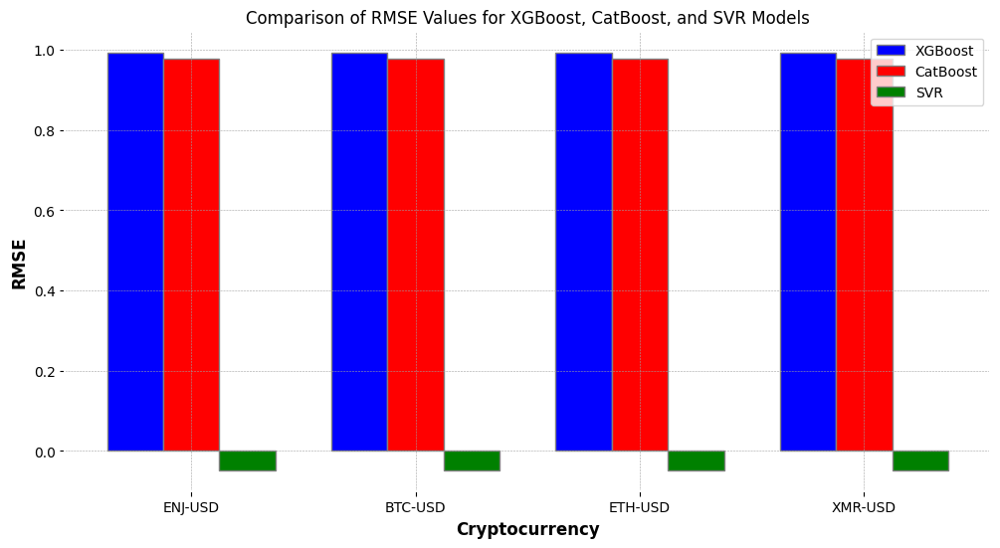

In [84]:
# compare xgboost, catboost and svr model performance using bar chart
import matplotlib.pyplot as plt

# Extract the RMSE values from the model_dict
xgboost_rmse = [value['XGBoost'] for value in model_dict.values()]
catboost_rmse = [value['CatBoost'] for value in model_dict.values()]
svr_rmse = [value['SVR'] for value in model_dict.values()]

# Create a bar chart to compare the RMSE values
plt.figure(figsize=(12, 6))
barWidth = 0.25
r1 = np.arange(len(xgboost_rmse))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

plt.bar(r1, xgboost_rmse, color='b', width=barWidth, edgecolor='grey', label='XGBoost')
plt.bar(r2, catboost_rmse, color='r', width=barWidth, edgecolor='grey', label='CatBoost')
plt.bar(r3, svr_rmse, color='g', width=barWidth, edgecolor='grey', label='SVR')

plt.xlabel('Cryptocurrency', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(xgboost_rmse))], model_dict.keys())
plt.ylabel('RMSE')
plt.title('Comparison of RMSE Values for XGBoost, CatBoost, and SVR Models')    
plt.legend()
plt.show()



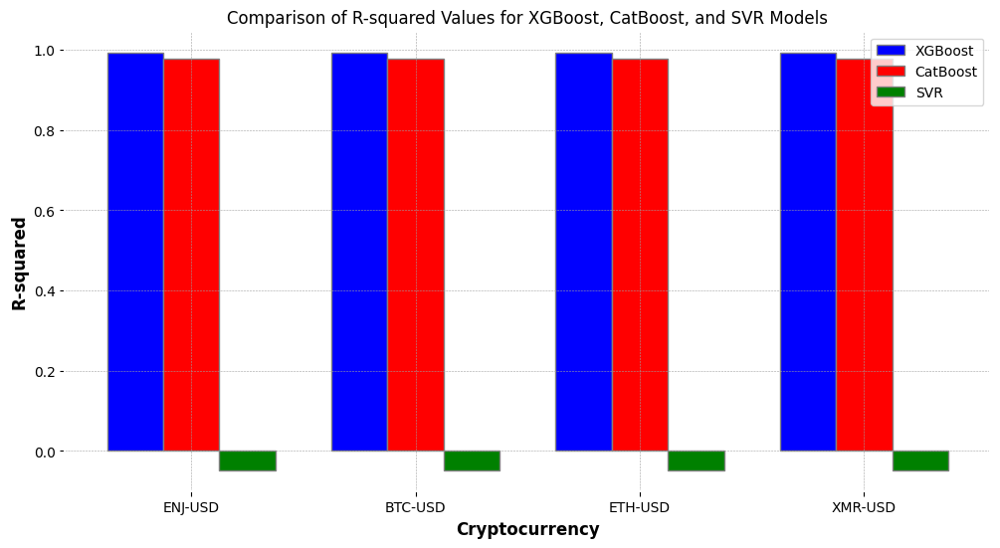

In [85]:
# Extract the R-squared values from the model_dict and show the values in the bar chart

xgboost_r2 = [value['XGBoost'] for value in model_dict.values()]
catboost_r2 = [value['CatBoost'] for value in model_dict.values()]
svr_r2 = [value['SVR'] for value in model_dict.values()]

# Create a bar chart to compare the R-squared values
plt.figure(figsize=(12, 6))
barWidth = 0.25
r1 = np.arange(len(xgboost_r2))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

plt.bar(r1, xgboost_r2, color='b', width=barWidth, edgecolor='grey', label='XGBoost')
plt.bar(r2, catboost_r2, color='r', width=barWidth, edgecolor='grey', label='CatBoost')
plt.bar(r3, svr_r2, color='g', width=barWidth, edgecolor='grey', label='SVR')

plt.xlabel('Cryptocurrency', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(xgboost_r2))], model_dict.keys())
plt.ylabel('R-squared')
plt.title('Comparison of R-squared Values for XGBoost, CatBoost, and SVR Models')
plt.legend()
plt.show()

### 	General Trading Signals and Analysis

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



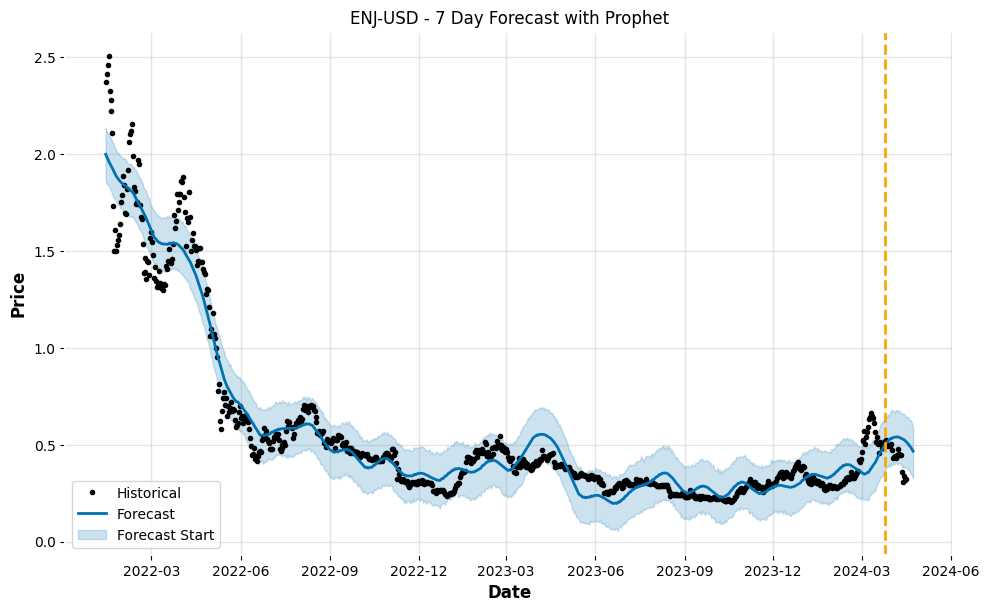

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



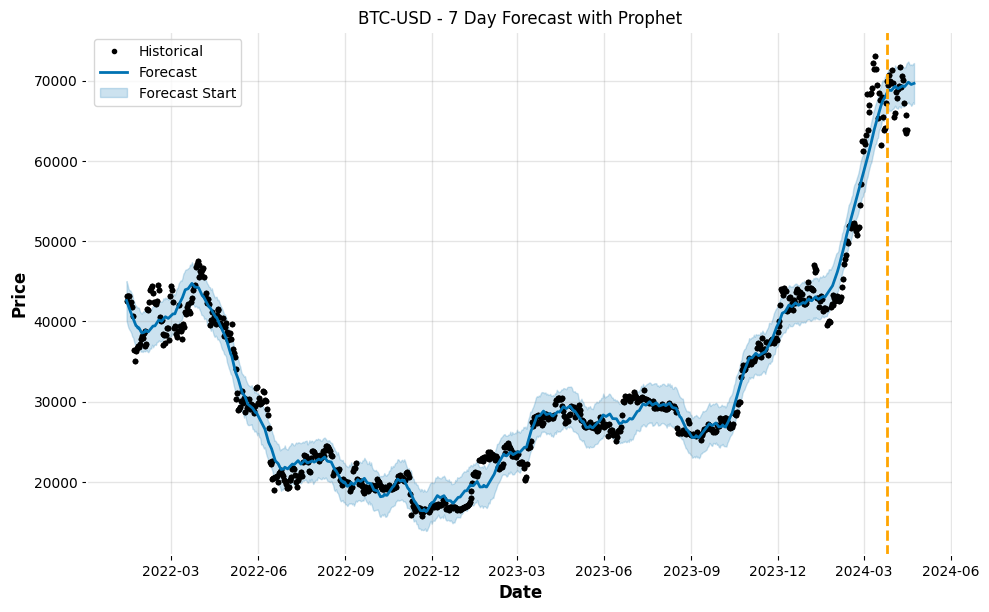

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



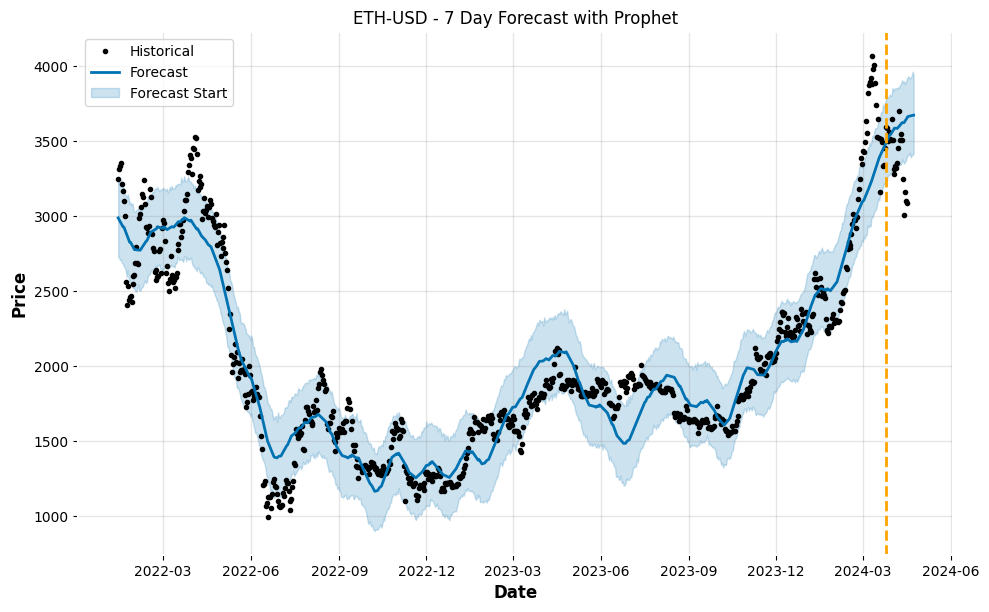

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



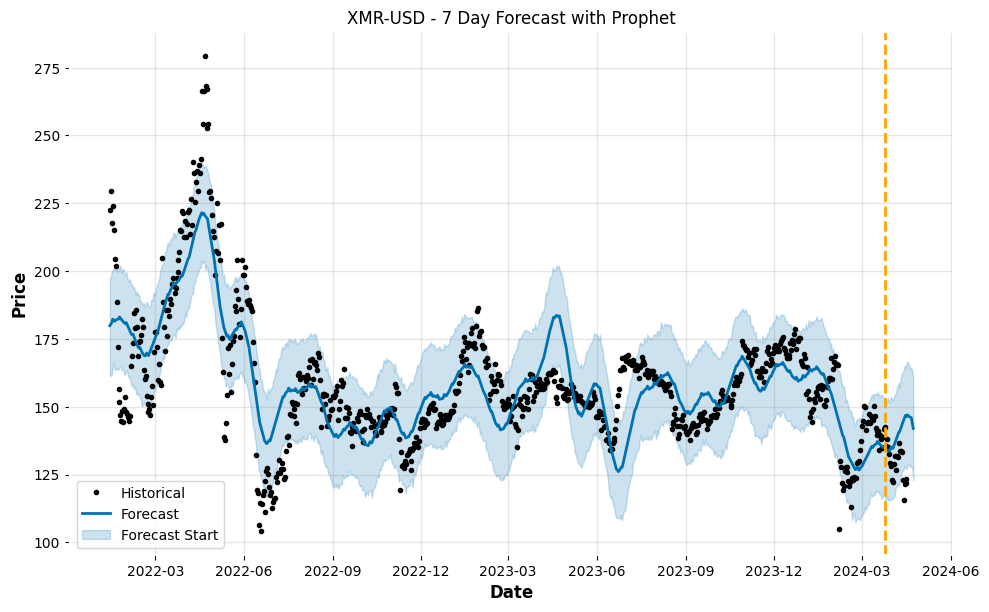

In [86]:
import matplotlib.pyplot as plt

for ticker in selected_cryptos:
    # Retrieve the trained model for the current ticker
    prophet_model = trained_prophet_models[ticker]
    
    # Create a future dataframe for the next 30 days
    future = prophet_model.make_future_dataframe(periods=7)
    
    # Make predictions for the future data
    forecast = prophet_model.predict(future)
    
    # Plot the forecast
    fig = prophet_model.plot(forecast)
    plt.title(f'{ticker} - 7 Day Forecast with Prophet')
    plt.xlabel('Date')
    plt.ylabel('Price')
    
    # Highlight the forecast period on the plot
    plt.axvline(x=forecast['ds'].iloc[-30], color='orange', linestyle='--', lw=2)
    plt.legend(['Historical', 'Forecast', 'Forecast Start'])
    
    plt.show()


C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



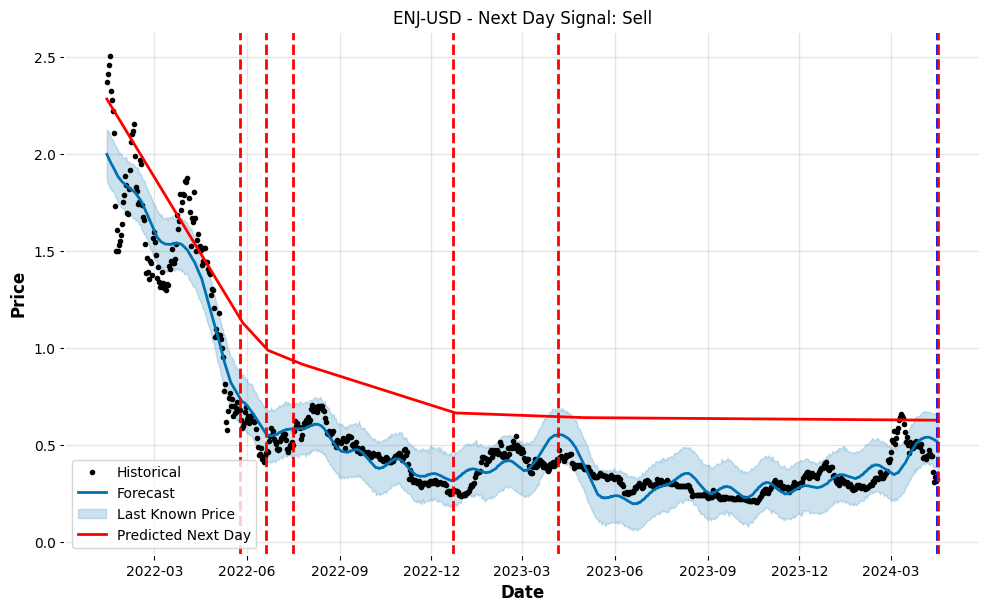

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



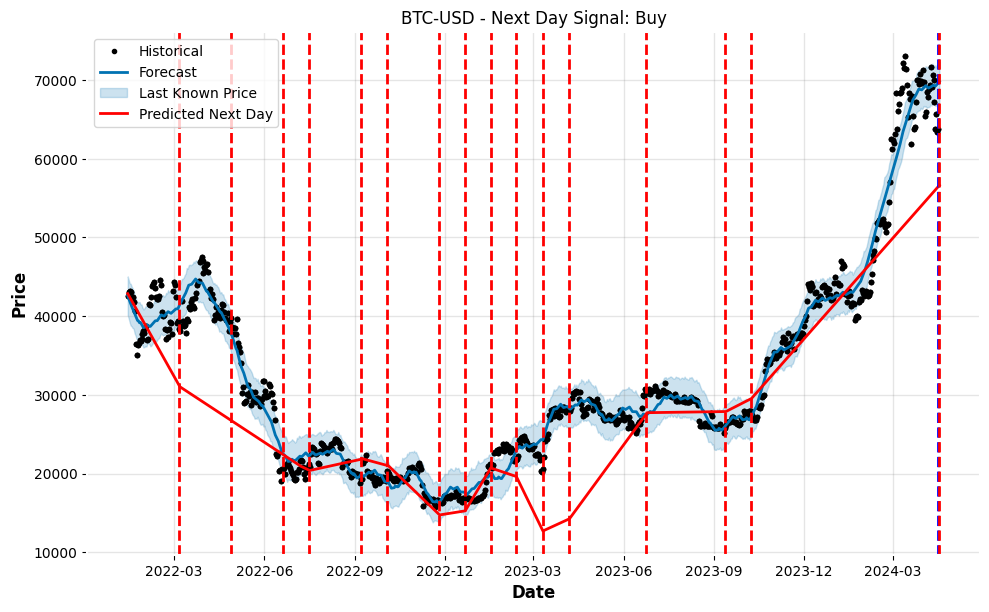

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



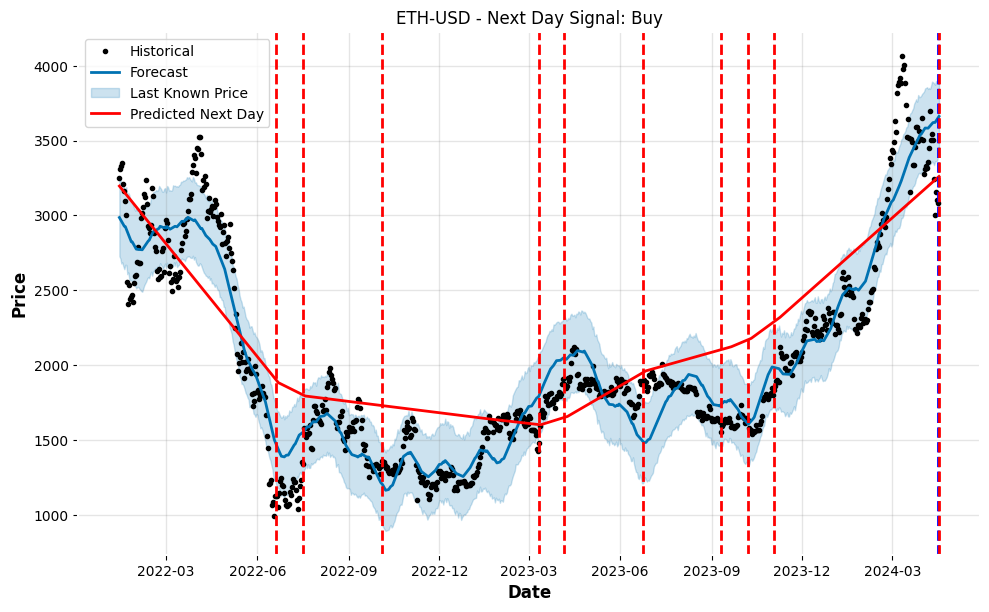

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



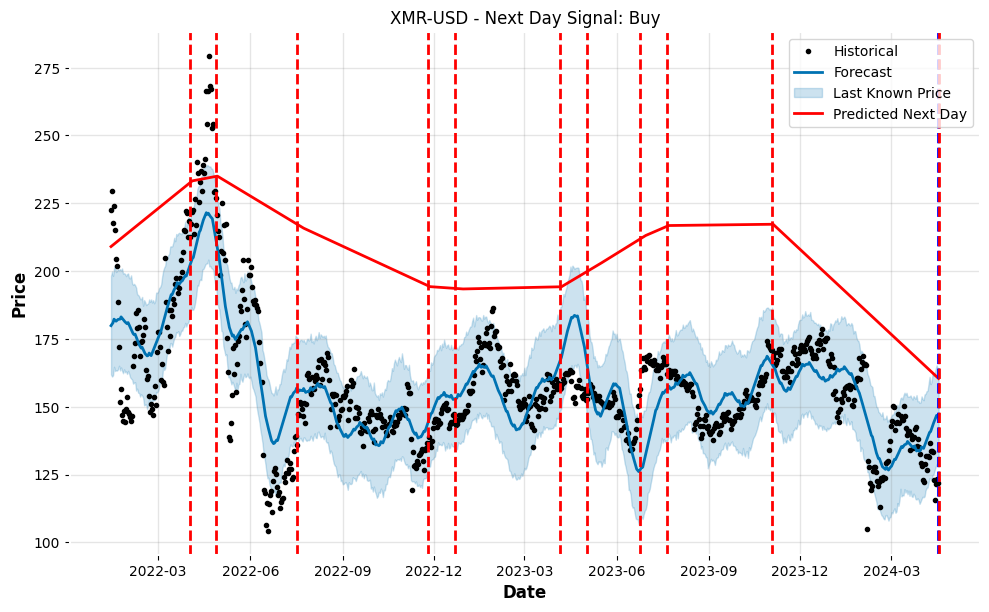

ENJ-USD: Sell
BTC-USD: Buy
ETH-USD: Buy
XMR-USD: Buy


In [87]:
import matplotlib.pyplot as plt
from prophet.plot import add_changepoints_to_plot


# Generate signals based on the forecast
signals = {}

for ticker in selected_cryptos:
    # Retrieve the trained model for the current ticker
    prophet_model = trained_prophet_models[ticker]
    
    # Create a future dataframe for the next day
    future = prophet_model.make_future_dataframe(periods=1)
    
    # Make predictions for the next day
    forecast = prophet_model.predict(future)
    
    # Determine the last known price
    last_known_price = forecast.iloc[-2]['yhat']
    
    # Determine the predicted price for the next day
    predicted_next_day_price = forecast.iloc[-1]['yhat']
    
    # Generate the signal
    signal = "Buy" if predicted_next_day_price > last_known_price else "Sell"
    signals[ticker] = signal
    
    # Plot the forecast with the changepoints
    fig = prophet_model.plot(forecast)
    a = add_changepoints_to_plot(fig.gca(), prophet_model, forecast)
    plt.title(f'{ticker} - Next Day Signal: {signal}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    
    # Highlight the last day and the next day prediction
    plt.axvline(x=forecast['ds'].iloc[-2], color='blue', linestyle='--', lw=2)
    plt.axvline(x=forecast['ds'].iloc[-1], color='red', linestyle='--', lw=2)
    plt.legend(['Historical', 'Forecast', 'Last Known Price', 'Predicted Next Day'])
    
    plt.show()

# Print generated signals
for ticker, signal in signals.items():
    print(f"{ticker}: {signal}")


In [88]:
def calculate_rsi(data, window=14):
    delta = data.diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

def generate_trading_signals(forecast, historical_data):
    # Add moving averages to historical data
    historical_data['MA7'] = historical_data['y'].rolling(window=7).mean()
    historical_data['MA30'] = historical_data['y'].rolling(window=30).mean()
    historical_data['RSI'] = calculate_rsi(historical_data['y'])
    
    # Generate signals based on moving averages
    historical_data['Signal_MA'] = 0
    historical_data['Signal_MA'] = np.where(historical_data['MA7'] > historical_data['MA30'], 1, -1)

    # Generate signals based on RSI
    historical_data['Signal_RSI'] = 0
    historical_data['Signal_RSI'] = np.where(historical_data['RSI'] > 70, -1, np.where(historical_data['RSI'] < 30, 1, 0))
    
    # Combine signals and return
    historical_data['Combined_Signal'] = historical_data[['Signal_MA', 'Signal_RSI']].max(axis=1)
    
    # Extract last known price and latest forecast price for future signal
    last_known_price = historical_data['y'].iloc[-1]
    predicted_future_price = forecast['yhat'].iloc[-1]
    historical_data['Forecast_Signal'] = "Buy" if predicted_future_price > last_known_price else "Sell" if predicted_future_price < last_known_price else "Hold"
    
    return historical_data

# Example usage within your loop:
for ticker in selected_cryptos:
    # Retrieve and prepare the data
    crypto_subset = crypto_data[crypto_data['Ticker'] == ticker].copy()
    crypto_subset = crypto_subset.reset_index()
    df_prophet = crypto_subset[['Date', 'Close']].rename(columns={'Date': 'ds', 'Close': 'y'})

    # Use the Prophet model
    prophet_model = trained_prophet_models[ticker]
    future = prophet_model.make_future_dataframe(periods=30)
    forecast = prophet_model.predict(future)

    # Generate signals
    signals_data = generate_trading_signals(forecast, df_prophet)
    
    # Visualization or analysis
    print(signals_data[['ds', 'Signal_MA', 'Signal_RSI', 'Combined_Signal', 'Forecast_Signal']].tail())


            ds  Signal_MA  Signal_RSI  Combined_Signal Forecast_Signal
820 2024-04-12         -1           1                1            Sell
821 2024-04-13         -1           1                1            Sell
822 2024-04-14         -1           1                1            Sell
823 2024-04-15         -1           1                1            Sell
824 2024-04-16         -1           0                0            Sell
             ds  Signal_MA  Signal_RSI  Combined_Signal Forecast_Signal
2470 2024-04-12          1           0                1             Buy
2471 2024-04-13          1           0                1             Buy
2472 2024-04-14          1           0                1             Buy
2473 2024-04-15         -1           0                0             Buy
2474 2024-04-16         -1           0                0             Buy
            ds  Signal_MA  Signal_RSI  Combined_Signal Forecast_Signal
820 2024-04-12         -1           0                0             Buy


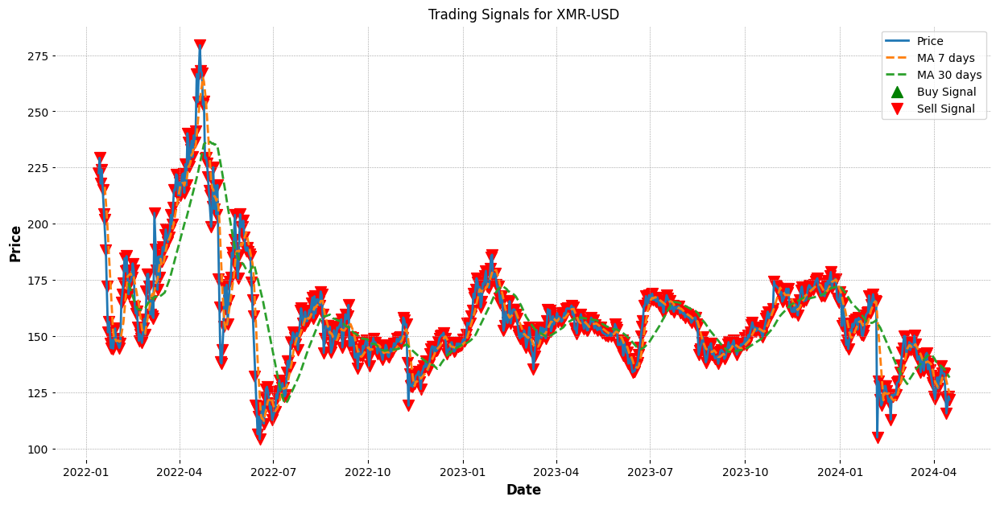

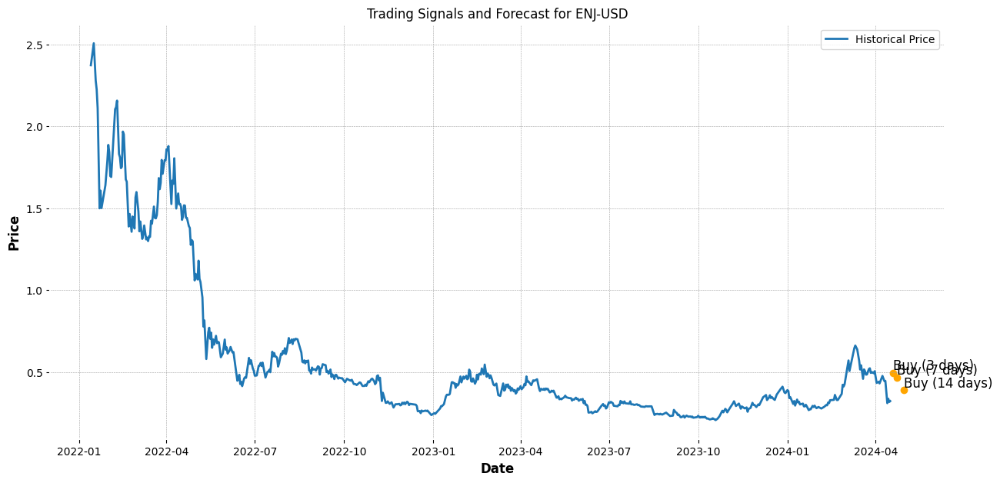

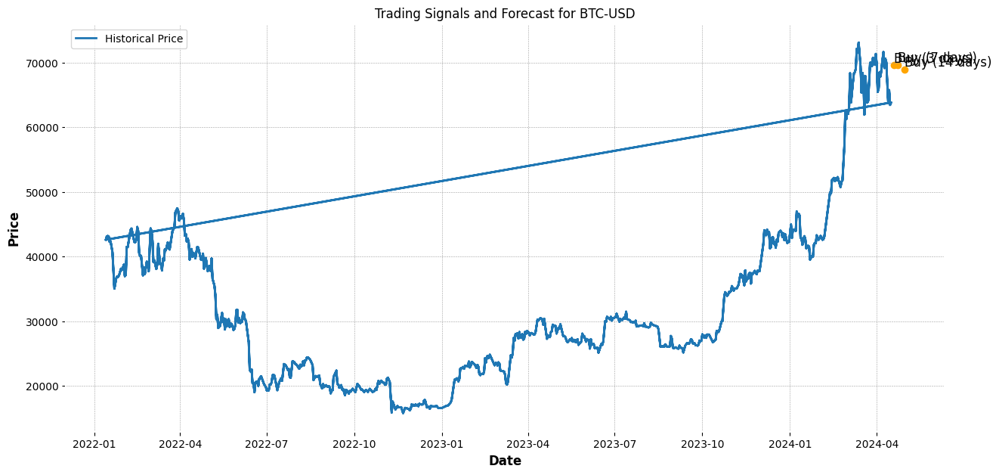

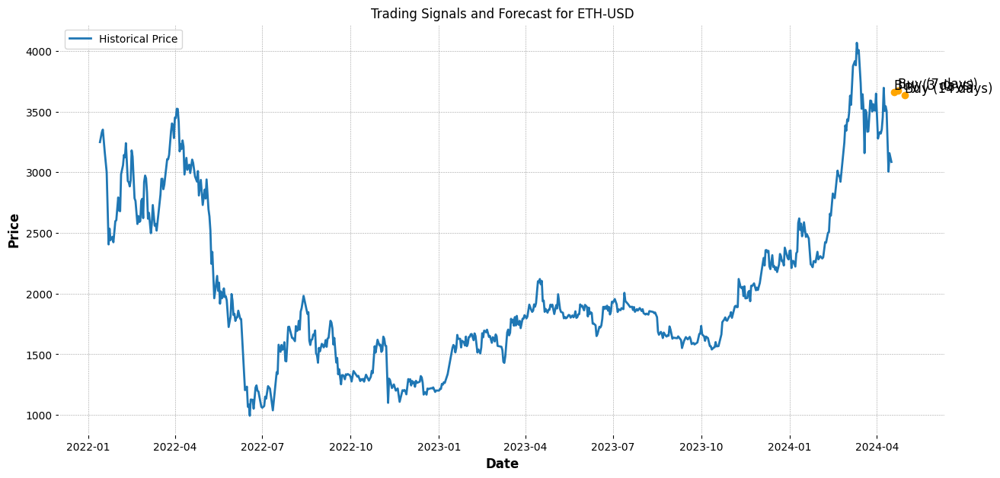

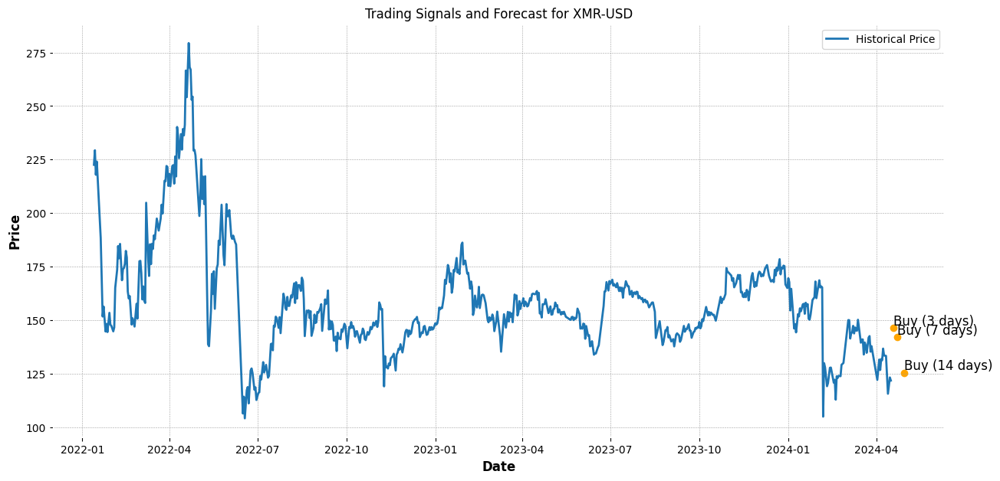

In [89]:
import matplotlib.pyplot as plt

# Plot the last 200 days and highlight signals
plt.figure(figsize=(15, 7))
plt.plot(df_prophet['ds'], df_prophet['y'], label='Price')
plt.plot(df_prophet['ds'], df_prophet['MA7'], label='MA 7 days', linestyle='--')
plt.plot(df_prophet['ds'], df_prophet['MA30'], label='MA 30 days', linestyle='--')

# Highlight buy and sell signals
buy_signals = df_prophet[df_prophet['Forecast_Signal'] == 'Buy']
sell_signals = df_prophet[df_prophet['Forecast_Signal'] == 'Sell']
plt.scatter(buy_signals['ds'], buy_signals['y'], color='green', label='Buy Signal', marker='^', s=100)
plt.scatter(sell_signals['ds'], sell_signals['y'], color='red', label='Sell Signal', marker='v', s=100)

plt.title(f'Trading Signals for {ticker}')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

def forecast_decision(forecast_price, last_price, threshold=0.01):
    change_percentage = (forecast_price - last_price) / last_price
    if change_percentage > threshold:
        return "Buy"
    elif change_percentage < -threshold:
        return "Sell"
    else:
        return "Hold"

for ticker in selected_cryptos:
    prophet_model = trained_prophet_models[ticker]
    # Using 'df_prophet' which should be your dataframe that contains the historical data
    df_prophet = crypto_data[crypto_data['Ticker'] == ticker]
    df_prophet = df_prophet.reset_index()
    df_prophet = df_prophet.rename(columns={'Date': 'ds', 'Close': 'y'})

    # Make sure 'ds' is a datetime type
    df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])
    
    last_known_price = df_prophet['y'].iloc[-1]
    
    # Creating a future dataframe for the next 14 days
    future = prophet_model.make_future_dataframe(periods=14)
    forecast = prophet_model.predict(future)
    
    # Plot the historical data
    plt.figure(figsize=(15, 7))
    plt.plot(df_prophet['ds'], df_prophet['y'], label='Historical Price')

    # Annotate the decision for 3, 7, and 14 day forecasts
    for offset in [3, 7, 14]:
        forecast_date = df_prophet['ds'].max() + pd.Timedelta(days=offset)
        forecast_price = forecast.loc[forecast['ds'] == forecast_date, 'yhat'].values[0]
        decision = forecast_decision(forecast_price, last_known_price)
        plt.scatter(forecast_date, forecast_price, color='orange')
        plt.text(forecast_date, forecast_price, f'{decision} ({offset} days)', fontsize=12, verticalalignment='bottom')
    
    plt.title(f'Trading Signals and Forecast for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()


C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



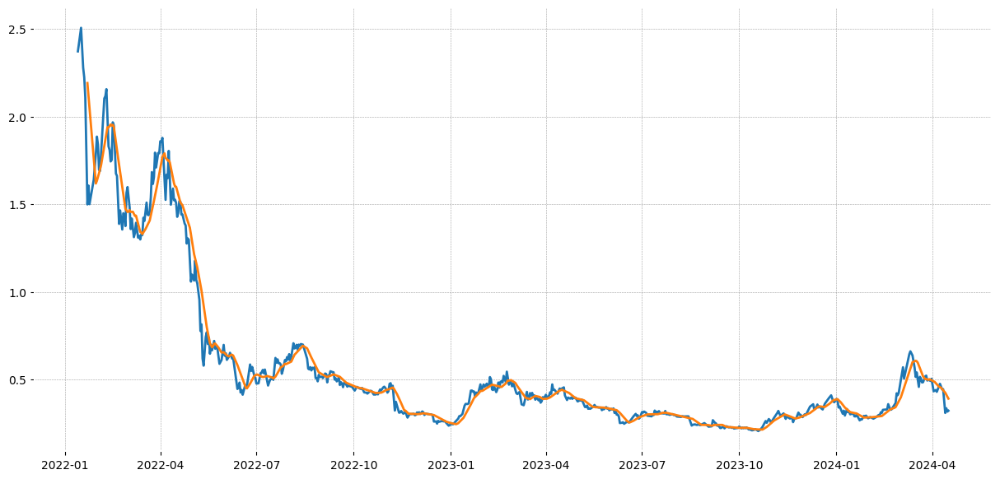

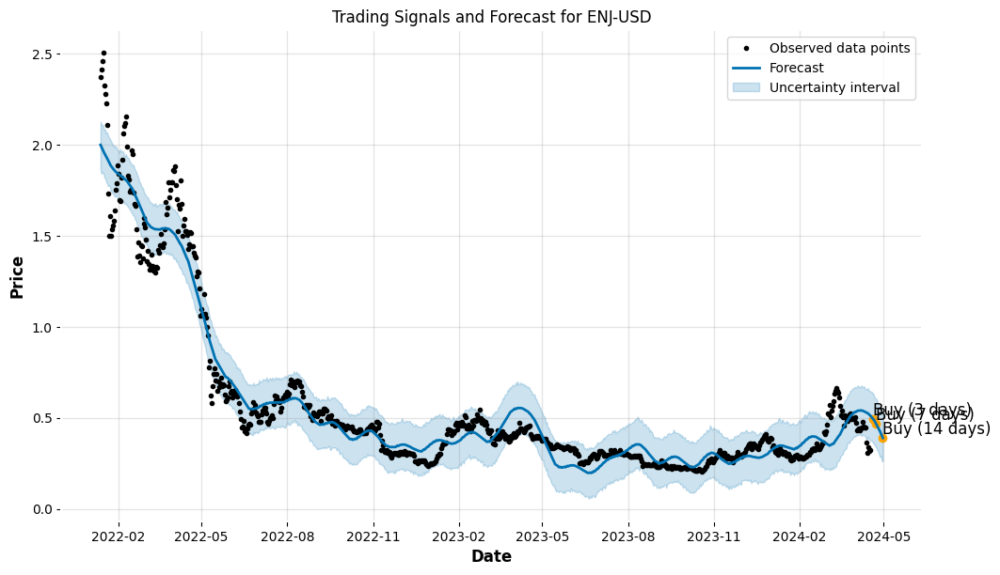

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



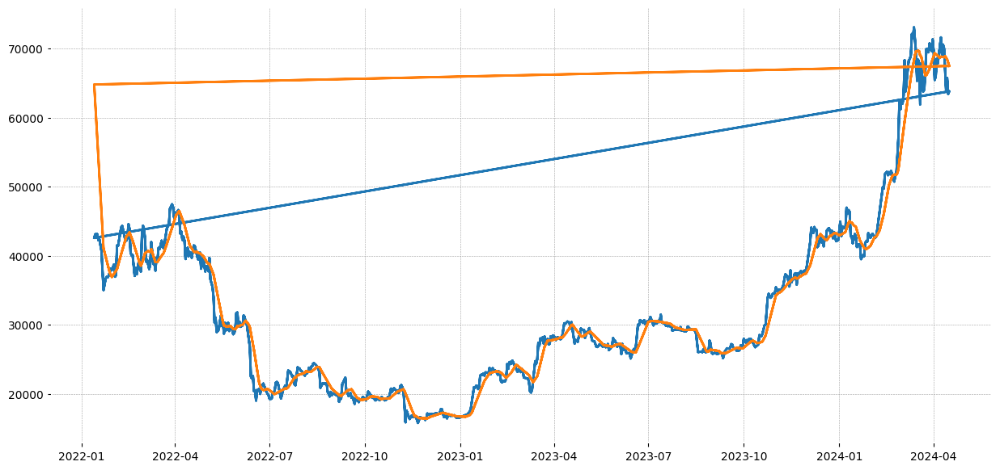

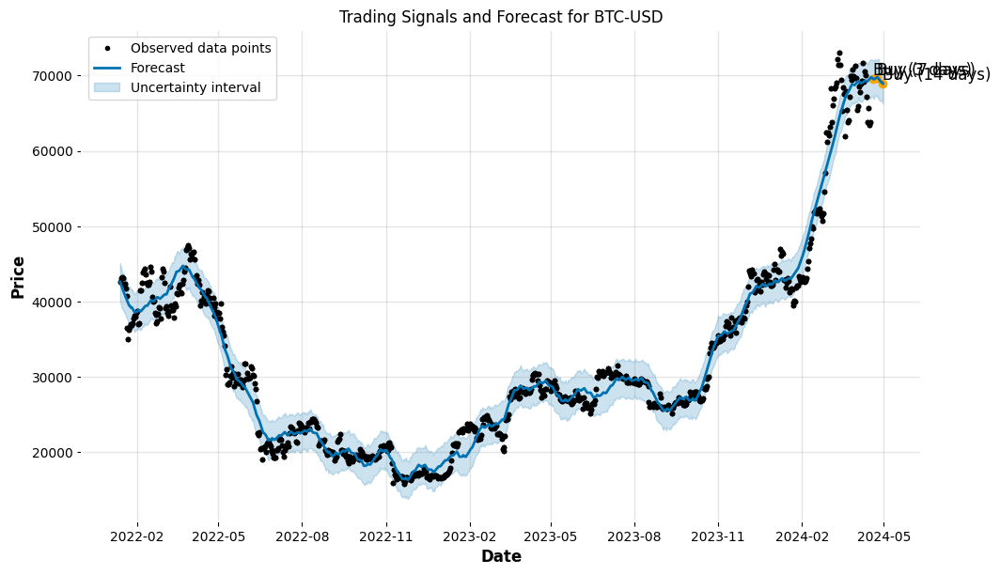

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



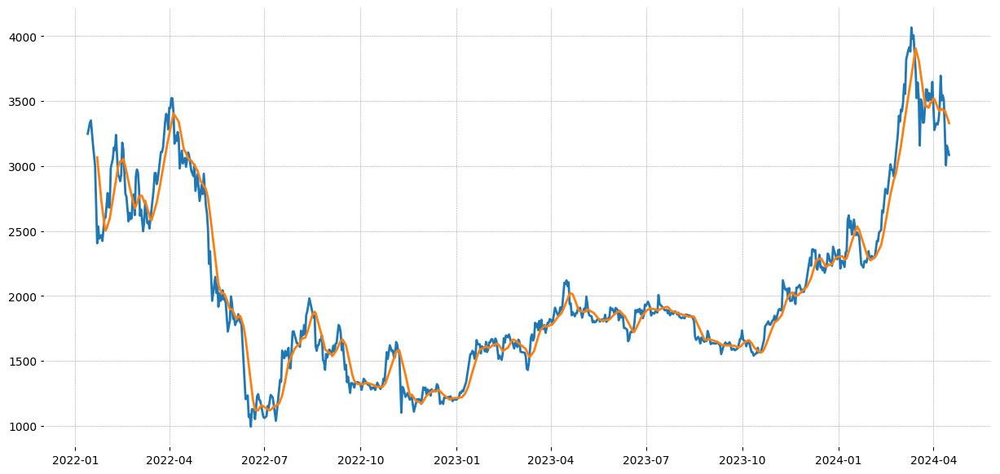

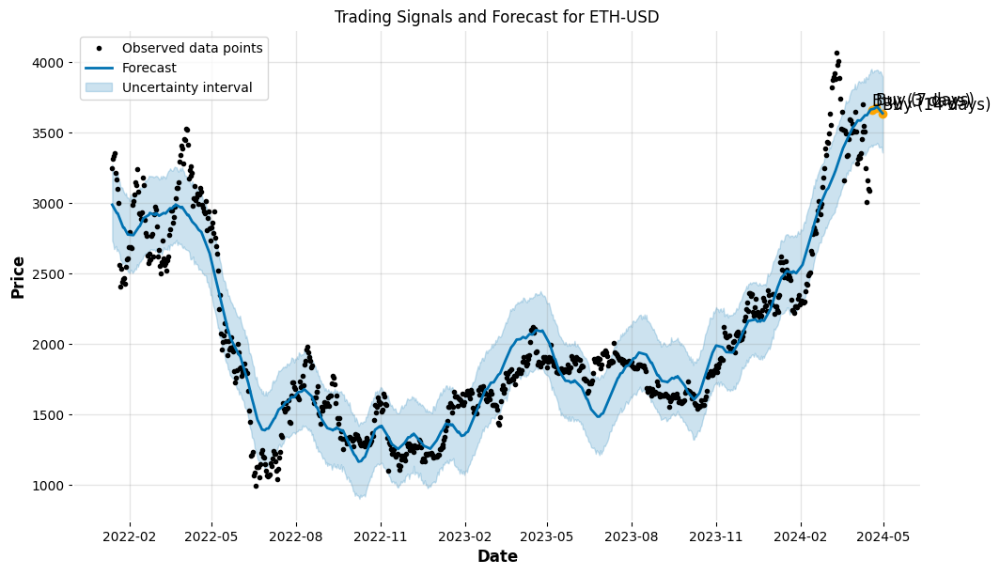

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\dagbo_b40tnyc\OneDrive\Crypto-Predictions\Crypt_pred\.venv\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



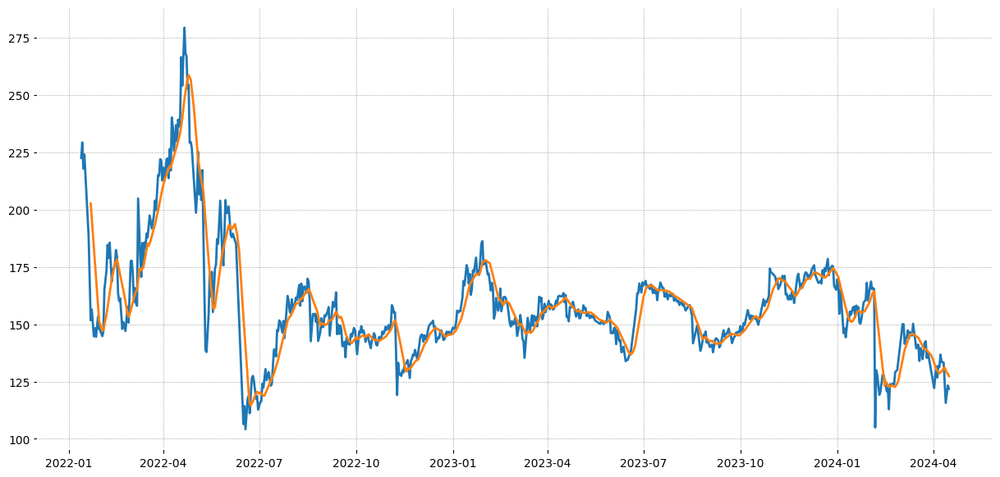

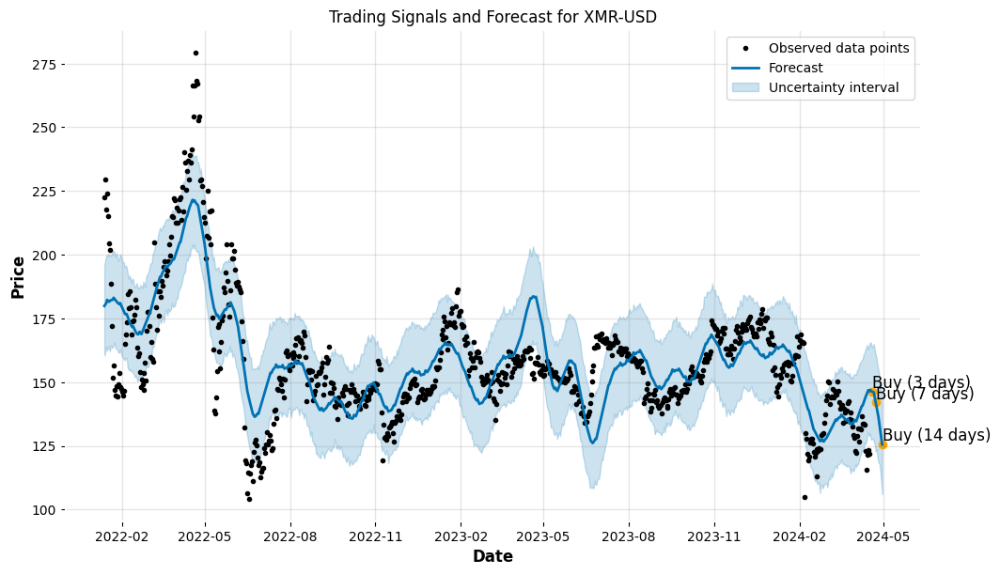

In [90]:
def forecast_decision(forecast_price, last_price, threshold=0.01):
    change_percentage = (forecast_price - last_price) / last_price
    if change_percentage > threshold:
        return "Buy"
    elif change_percentage < -threshold:
        return "Sell"
    else:
        return "Hold"

def plot_forecast(ticker, df_prophet, forecast, last_known_price): 
    # Calculate a Simple Moving Average (adjust window as needed)
    df_prophet['SMA_10'] = df_prophet['y'].rolling(window=10).mean() 

    plt.figure(figsize=(15, 7))
    plt.plot(df_prophet['ds'], df_prophet['y'], label='Historical Price')
    plt.plot(df_prophet['ds'], df_prophet['SMA_10'], label='SMA (10)')
    prophet_model.plot(forecast)  # Plot forecast with uncertainty intervals

    for offset in [3, 7, 14]:
        forecast_date = df_prophet['ds'].max() + pd.Timedelta(days=offset)
        forecast_price = forecast.loc[forecast['ds'] == forecast_date, 'yhat'].values[0]
        decision = forecast_decision(forecast_price, last_known_price)
        plt.scatter(forecast_date, forecast_price, color='orange')
        plt.text(forecast_date, forecast_price, f'{decision} ({offset} days)', 
                 fontsize=12, verticalalignment='bottom')

    plt.title(f'Trading Signals and Forecast for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()  


for ticker in selected_cryptos:
    prophet_model = trained_prophet_models[ticker]
    df_prophet = crypto_data[crypto_data['Ticker'] == ticker].copy()  # Avoid modifying original data
    df_prophet = df_prophet.reset_index()
    df_prophet = df_prophet.rename(columns={'Date': 'ds', 'Close': 'y'})
    df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

    last_known_price = df_prophet['y'].iloc[-1]
    future = prophet_model.make_future_dataframe(periods=14)
    forecast = prophet_model.predict(future)

    plot_forecast(ticker, df_prophet, forecast, last_known_price)

In [91]:
print(df_prophet)

            ds        Open        High         Low           y   Adj Close  \
0   2022-01-13  198.887451  229.245285  198.574249  222.547287  222.547287   
1   2022-01-14  222.871521  230.238922  217.544006  229.346146  229.346146   
2   2022-01-15  229.339523  230.260788  217.308929  217.897247  217.897247   
3   2022-01-16  217.924026  227.565186  213.429489  224.066055  224.066055   
4   2022-01-17  224.018127  229.678543  212.440475  215.149857  215.149857   
..         ...         ...         ...         ...         ...         ...   
820 2024-04-12  133.369156  134.953949  117.228798  122.996651  122.996651   
821 2024-04-13  122.996651  128.999756  105.426025  115.678329  115.678329   
822 2024-04-14  115.678329  123.254227  113.112610  121.533531  121.533531   
823 2024-04-15  121.533531  127.288727  117.548470  123.288460  123.288460   
824 2024-04-16  123.288460  123.965866  114.284363  121.838257  121.838257   

        Volume   Ticker      SMA_10  
0    389788594  XMR-USD  

In [92]:
# using plotly to plot the forecast
import plotly.graph_objects as go

def plot_forecast(ticker, df_prophet, forecast, last_known_price): 
    # Calculate a Simple Moving Average (adjust window as needed)
    df_prophet['SMA_10'] = df_prophet['y'].rolling(window=10).mean() 

    fig = go.Figure()
    fig.add_trace(go.Scatter
                  
    (x=df_prophet['ds'], y=df_prophet['y'], mode='lines', name='Historical Price'))
    fig.add_trace(go.Scatter(x=df_prophet['ds'], y=df_prophet['SMA_10'], mode='lines', name='SMA (10)'))
    fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='Forecast'))
    
    for offset in [3, 7, 14]:
        forecast_date = df_prophet['ds'].max() + pd.Timedelta(days=offset)
        forecast_price = forecast.loc[forecast['ds'] == forecast_date, 'yhat'].values[0]
        decision = forecast_decision(forecast_price, last_known_price)
        fig.add_trace(go.Scatter(x=[forecast_date], y=[forecast_price], mode='markers', name=f'{decision} ({offset} days)'))
        
    fig.update_layout(title=f'Trading Signals and Forecast for {ticker}', xaxis_title='Date', yaxis_title='Price')
    fig.show()
    

In [93]:
for ticker in selected_cryptos:
    prophet_model = trained_prophet_models[ticker]
    df_prophet = crypto_data[crypto_data['Ticker'] == ticker].copy()  # Avoid modifying original data
    df_prophet = df_prophet.reset_index()
    df_prophet = df_prophet.rename(columns={'Date': 'ds', 'Close': 'y'})
    df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

    last_known_price = df_prophet['y'].iloc[-1]
    future = prophet_model.make_future_dataframe(periods=14)
    forecast = prophet_model.predict(future)

    plot_forecast(ticker, df_prophet, forecast, last_known_price)
    
    

In [94]:
import pandas as pd
import plotly.graph_objs as go

def forecast_decision(forecast_price, last_known_price, threshold=0.01):
    change_percentage = (forecast_price - last_known_price) / last_known_price
    if change_percentage > threshold:
        return "Buy"
    elif change_percentage < -threshold:
        return "Sell"
    else:
        return "Hold"

def plot_forecast(ticker, df_prophet, forecast, last_known_price):
    # Calculate a Simple Moving Average (adjust window as needed)
    df_prophet['SMA_10'] = df_prophet['y'].rolling(window=10).mean() 

    # Create the figure for the candlestick chart
    fig = go.Figure(data=[
        # Candlestick chart
        go.Candlestick(
            x=df_prophet['ds'],
            open=df_prophet['Open'],
            high=df_prophet['High'],
            low=df_prophet['Low'],
            close=df_prophet['y'],
            name='Candlesticks'
        ),

        # Historical Price (optional)
        go.Scatter(
            x=df_prophet['ds'], y=df_prophet['y'],
            mode='lines', name='Historical Price'
        ),

        # Simple Moving Average
        go.Scatter(
            x=df_prophet['ds'], y=df_prophet['SMA_10'],
            mode='lines', name='SMA (10)'
        ),

        # Forecast line
        go.Scatter(
            x=forecast['ds'], y=forecast['yhat'],
            mode='lines', name='Forecast'
        )
    ])

    # Add markers for trading signals based on decisions at forecast dates
    for offset in [3, 7, 14]:
        forecast_date = df_prophet['ds'].max() + pd.Timedelta(days=offset)
        if forecast_date in forecast['ds'].values:  # Check if the forecast date is in the predictions
            forecast_price = forecast.loc[forecast['ds'] == forecast_date, 'yhat'].values[0]
            decision = forecast_decision(forecast_price, last_known_price)

            # Define marker properties based on decision
            marker_props = dict(size=10, symbol='triangle-up', color='green') if decision == 'Buy' \
                else dict(size=10, symbol='triangle-down', color='red') if decision == 'Sell' \
                else dict(size=10, symbol='circle', color='grey')  # Hold

            fig.add_trace(go.Scatter(
                x=[forecast_date], y=[forecast_price],
                mode='markers+text', marker=marker_props,
                name=f'{decision} Signal', text=[f'{decision} ({offset} days)'],
                textposition="top center"
            ))

    # Set the figure layout
    fig.update_layout(
        title=f'Trading Signals and Forecast for {ticker}',
        xaxis_title='Date', yaxis_title='Price',
        xaxis_rangeslider_visible=False,  # Disable range slider for clarity
        width=1000,  # You can adjust the width
        height=600,  # You can adjust the height
        margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4)  # You can adjust the margins
    )

    # Show the plot
    fig.show()


In [95]:
for ticker in selected_cryptos:
    prophet_model = trained_prophet_models[ticker]
    df_prophet = crypto_data[crypto_data['Ticker'] == ticker].copy()  # Avoid modifying original data
    df_prophet = df_prophet.reset_index()
    df_prophet = df_prophet.rename(columns={'Date': 'ds', 'Close': 'y'})
    df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

    last_known_price = df_prophet['y'].iloc[-1]
    future = prophet_model.make_future_dataframe(periods=14)
    forecast = prophet_model.predict(future)

    plot_forecast(ticker, df_prophet, forecast, last_known_price)
    

In [96]:
print(df_prophet)

            ds        Open        High         Low           y   Adj Close  \
0   2022-01-13  198.887451  229.245285  198.574249  222.547287  222.547287   
1   2022-01-14  222.871521  230.238922  217.544006  229.346146  229.346146   
2   2022-01-15  229.339523  230.260788  217.308929  217.897247  217.897247   
3   2022-01-16  217.924026  227.565186  213.429489  224.066055  224.066055   
4   2022-01-17  224.018127  229.678543  212.440475  215.149857  215.149857   
..         ...         ...         ...         ...         ...         ...   
820 2024-04-12  133.369156  134.953949  117.228798  122.996651  122.996651   
821 2024-04-13  122.996651  128.999756  105.426025  115.678329  115.678329   
822 2024-04-14  115.678329  123.254227  113.112610  121.533531  121.533531   
823 2024-04-15  121.533531  127.288727  117.548470  123.288460  123.288460   
824 2024-04-16  123.288460  123.965866  114.284363  121.838257  121.838257   

        Volume   Ticker      SMA_10  
0    389788594  XMR-USD  